# EDA

In [345]:
import nltk

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from nltk.stem import WordNetLemmatizer
from nltk.tokenize import RegexpTokenizer
from nltk.stem.porter import PorterStemmer
from nltk.corpus import stopwords

import regex as re

In [346]:
train = pd.read_csv('../data/Devex_train.csv')
clean_train = pd.read_csv('../data/clean_train.csv')
feature_train = pd.read_csv('../data/feature_train.csv')

In [347]:
print('train columns:',train.columns)
print('clean train columns:', clean_train.columns)
print('feature train columns:', feature_train.columns)

train columns: Index(['Unique ID', 'Type', 'Text', 'Label 1', 'Label 2', 'Label 3', 'Label 4',
       'Label 5', 'Label 6', 'Label 7', 'Label 8', 'Label 9', 'Label 10',
       'Label 11', 'Label 12'],
      dtype='object')
clean train columns: Index(['Unique ID', 'Type', 'clean_text', '3.1.1', '3.1.2', '3.2.1', '3.2.2',
       '3.3.1', '3.3.2', '3.3.3', '3.3.4', '3.3.5', '3.4.1', '3.4.2', '3.5.1',
       '3.5.2', '3.6.1', '3.7.1', '3.7.2', '3.8.1', '3.8.2', '3.9.1', '3.9.2',
       '3.9.3', '3.a.1', '3.b.1', '3.b.2', '3.b.3', '3.c.1', '3.d.1'],
      dtype='object')
feature train columns: Index(['Unique ID', 'Type', 'clean_text', '3.1.1', '3.1.2', '3.2.1', '3.2.2',
       '3.3.1', '3.3.2', '3.3.3', '3.3.4', '3.3.5', '3.4.1', '3.4.2', '3.5.1',
       '3.5.2', '3.6.1', '3.7.1', '3.7.2', '3.8.1', '3.8.2', '3.9.1', '3.9.2',
       '3.9.3', '3.a.1', '3.b.1', '3.b.2', '3.b.3', '3.c.1', '3.d.1',
       'word_count', 'unique_word', 'Contract', 'Funding Info', 'Grant',
       'News', 'Open Opp'

In [348]:
print('There are',clean_train.shape[0],'train text.')

There are 2995 train text.


In [349]:
clean_train_text = clean_train[['3.1.1', '3.1.2', '3.2.1', '3.2.2',
       '3.3.1', '3.3.2', '3.3.3', '3.3.4', '3.3.5', '3.4.1', '3.4.2', '3.5.1',
       '3.5.2', '3.6.1', '3.7.1', '3.7.2', '3.8.1', '3.8.2', '3.9.1', '3.9.2',
       '3.9.3', '3.a.1', '3.b.1', '3.b.2', '3.b.3', '3.c.1', '3.d.1']]
train_text = feature_train[['Unique ID','Type','Text','clean_text','word_count','unique_word']]

eda_df = pd.concat([train_text,clean_train_text],axis=1)
eda_df

,Unique ID,Type,Text,clean_text,word_count,unique_word,3.1.1,3.1.2,3.2.1,3.2.2,...,3.8.2,3.9.1,3.9.2,3.9.3,3.a.1,3.b.1,3.b.2,3.b.3,3.c.1,3.d.1
0,12555,Grant,Centers of Biomedical Research Excellence (COB...,center biomedical excellence cobre phase iii t...,398,221,0,0,0,0,...,0,0,0,0,0,0,1,0,1,0
1,14108,Grant,Research on Regenerative Medicine <h2><strong>...,regenerative medicine introduction support tra...,313,170,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
2,23168,Organization,Catholic Health Association of India (CHAI): <...,catholic association india chai catholic assoc...,313,192,0,0,0,0,...,1,0,0,0,0,0,0,1,0,1
3,219512,Contract,Quality Improvement Initiatives for Diabetes,quality improvement initiative diabetes,5,5,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,274093,Tender,Provision of Thalassemia Drugs and Disposables...,provision thalassemia drug disposable backgrou...,513,291,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2990,92153,News,How rats could help reduce the global TB burden:,rat could help reduce global tb burden,9,9,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2991,1209,Open Opp,Exploratory Analyses of Adherence Strategies a...,exploratory analysis adherence strategy data s...,2120,966,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
2992,14342,Grant,Study on Vaccines for Diarrhoeal Diseases or L...,study vaccine diarrhoeal disease lower respira...,94,69,0,0,0,0,...,0,0,0,0,0,1,1,0,0,0
2993,12353,Grant,Regional Engagement Stimulation Fund on Human ...,regional engagement stimulation fund human imm...,535,319,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [350]:
eda_df[['word_count','unique_word']].describe()

,word_count,unique_word
count,2995.000000,2995.000000
mean,477.745242,236.957930
std,641.966053,264.669533
min,2.000000,2.000000
25%,18.000000,17.000000
50%,211.000000,138.000000
75%,618.500000,336.000000
max,3781.000000,1443.000000


### Explore by Indicators

Each type I will be exploring how they distributes by word count and text types:

In [351]:
indicount = eda_df[['3.1.1', '3.1.2', '3.2.1', '3.2.2',
       '3.3.1', '3.3.2', '3.3.3', '3.3.4', '3.3.5', '3.4.1', '3.4.2', '3.5.1',
       '3.5.2', '3.6.1', '3.7.1', '3.7.2', '3.8.1', '3.8.2', '3.9.1', '3.9.2',
       '3.9.3', '3.a.1', '3.b.1', '3.b.2', '3.b.3', '3.c.1', '3.d.1']].sum()
indicount

3.1.1     218
3.1.2      96
3.2.1     249
3.2.2     138
3.3.1     371
3.3.2     174
3.3.3     157
3.3.4      53
3.3.5     156
3.4.1     483
3.4.2      61
3.5.1     123
3.5.2      68
3.6.1      31
3.7.1     189
3.7.2     165
3.8.1     529
3.8.2     161
3.9.1      55
3.9.2     217
3.9.3      63
3.a.1      76
3.b.1     185
3.b.2    1040
3.b.3     394
3.c.1     232
3.d.1     217
dtype: int64

#### 3.1.1

In [352]:
indi1 = eda_df[eda_df['3.1.1']==1]
indi1

,Unique ID,Type,Text,clean_text,word_count,unique_word,3.1.1,3.1.2,3.2.1,3.2.2,...,3.8.2,3.9.1,3.9.2,3.9.3,3.a.1,3.b.1,3.b.2,3.b.3,3.c.1,3.d.1
28,11352,Grant,Early Childhood Developmental Health System: I...,early childhood developmental system improving...,125,90,1,0,1,0,...,0,0,0,0,0,0,0,0,0,0
68,23760,Organization,M_decins du Monde (Doctors of the World): <p>D...,decins du monde doctor world doctor world also...,568,307,1,0,0,0,...,0,0,0,0,0,0,0,0,0,1
78,220427,Contract,Management review of the Reproductive Maternal...,management review reproductive maternal newbor...,12,12,1,1,1,1,...,0,0,0,0,0,0,0,0,0,0
104,13254,Grant,Support for Women's Health and Family Planning...,woman family planning austrian agency ada invi...,83,69,1,1,1,0,...,0,0,0,0,0,0,0,0,0,0
145,92288,News,Opinion: An unacceptable inequality in women a...,opinion unacceptable inequality woman child,9,9,1,0,1,1,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2893,280255,Tender,Provision of Consultancy Services for the Asse...,provision consultancy service assessment micro...,969,507,1,0,1,1,...,0,0,0,0,0,0,0,0,0,0
2925,261676,Tender,Baseline Assessment for an Intervention to Imp...,baseline assessment intervention improve mater...,130,55,1,1,0,1,...,0,0,0,0,0,0,0,0,0,0
2933,267955,Tender,Health Development Fund Support Evaluation On ...,fund evaluation access quality improvement bac...,910,472,1,0,1,1,...,0,0,0,0,0,1,0,0,0,0
2970,35401,Program,Liberia Health Systems Strengthening Project -...,liberia system strengthening objective pdo imp...,71,45,1,0,1,0,...,0,0,0,0,0,0,0,0,0,0


In [353]:
indi1[['word_count','unique_word']].describe()

,word_count,unique_word
count,218.000000,218.000000
mean,382.412844,201.940367
std,522.467739,236.945153
min,2.000000,2.000000
25%,14.000000,13.000000
50%,154.500000,108.500000
75%,563.250000,307.000000
max,3424.000000,1389.000000


In [354]:
indi1.Type.value_counts()

Contract        53
Tender          51
Grant           45
Funding Info    24
Open Opp        12
Organization    11
Program         11
News            11
Name: Type, dtype: int64

#### 3.1.2

In [355]:
indi2 = eda_df[eda_df['3.1.2']==1]
indi2

,Unique ID,Type,Text,clean_text,word_count,unique_word,3.1.1,3.1.2,3.2.1,3.2.2,...,3.8.2,3.9.1,3.9.2,3.9.3,3.a.1,3.b.1,3.b.2,3.b.3,3.c.1,3.d.1
27,234687,Contract,Immunization of Infants by Training Traditiona...,immunization infant training traditionally inv...,9,9,0,1,0,1,...,0,0,0,0,0,0,0,0,1,0
46,92798,News,World Health Assembly kicks off with focus on ...,world assembly kick focus worker universal cov...,12,12,0,1,0,0,...,0,0,0,0,0,0,0,1,1,0
48,38422,Program,Scaling up Family Planning in Tanzania<p>This ...,scaling family planning tanzaniathis national ...,80,54,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
61,11813,Grant,Accelerating Universal Access to Family Planni...,accelerating universal access family planning ...,639,329,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
78,220427,Contract,Management review of the Reproductive Maternal...,management review reproductive maternal newbor...,12,12,1,1,1,1,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2818,51147,Funding Info,Cuba Country Programme For Development of Nati...,cuba programme national capacity cuba middle i...,206,141,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
2827,22689,Organization,Foundation for International Training (FIT): <...,foundation international training fit foundati...,648,344,0,1,0,0,...,0,0,0,0,0,0,0,0,1,0
2859,48534,Funding Info,$18 million Additional Humanitarian Assistance...,million additional humanitarian assistance con...,198,96,0,1,0,0,...,0,0,1,0,0,0,0,0,0,0
2881,50371,Funding Info,Co-financing Agreement to Scale Up Support for...,co financing agreement scale humanitarian assi...,168,119,1,1,1,0,...,0,0,0,0,0,0,0,0,0,0


In [356]:
indi2[['word_count','unique_word']].describe()

,word_count,unique_word
count,96.000000,96.000000
mean,296.312500,160.895833
std,367.515107,168.031606
min,6.000000,6.000000
25%,19.250000,16.750000
50%,169.500000,109.000000
75%,379.000000,223.500000
max,1777.000000,734.000000


In [357]:
indi2.Type.value_counts()

Funding Info    22
Tender          20
Contract        19
Grant           13
Program          8
Organization     7
News             6
Open Opp         1
Name: Type, dtype: int64

#### 3.2.1

In [358]:
indi3 = eda_df[eda_df['3.2.1']==1]
indi3

,Unique ID,Type,Text,clean_text,word_count,unique_word,3.1.1,3.1.2,3.2.1,3.2.2,...,3.8.2,3.9.1,3.9.2,3.9.3,3.a.1,3.b.1,3.b.2,3.b.3,3.c.1,3.d.1
28,11352,Grant,Early Childhood Developmental Health System: I...,early childhood developmental system improving...,125,90,1,0,1,0,...,0,0,0,0,0,0,0,0,0,0
35,260205,Tender,Provision of LAC Schools as Enabling Environme...,provision lac school enabling environment prev...,387,222,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
78,220427,Contract,Management review of the Reproductive Maternal...,management review reproductive maternal newbor...,12,12,1,1,1,1,...,0,0,0,0,0,0,0,0,0,0
93,255431,Tender,National Parenting and Family Care Strategic F...,national parenting family care strategic frame...,531,263,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
104,13254,Grant,Support for Women's Health and Family Planning...,woman family planning austrian agency ada invi...,83,69,1,1,1,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2939,47043,Funding Info,$23 million Additional Financing Agreement to ...,million additional financing agreement help re...,182,116,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
2940,216882,Contract,Preventing Diabetes Among School Children,preventing diabetes among school child,5,5,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
2958,39072,Program,"Emergency Shelter, Health, Nutrition and Livel...",emergency shelter nutrition livelihood assista...,58,47,0,0,1,0,...,0,0,1,0,0,0,0,0,0,0
2970,35401,Program,Liberia Health Systems Strengthening Project -...,liberia system strengthening objective pdo imp...,71,45,1,0,1,0,...,0,0,0,0,0,0,0,0,0,0


In [359]:
indi3[['word_count','unique_word']].describe()

,word_count,unique_word
count,249.000000,249.000000
mean,420.449799,214.040161
std,587.823252,240.177821
min,3.000000,3.000000
25%,20.000000,17.000000
50%,173.000000,116.000000
75%,598.000000,320.000000
max,3424.000000,1389.000000


In [360]:
indi3.Type.value_counts()

Grant           65
Tender          56
Contract        50
Funding Info    27
Program         18
Organization    12
Open Opp        11
News            10
Name: Type, dtype: int64

#### 3.2.2

In [361]:
indi4 = eda_df[eda_df['3.2.2']==1]
indi4

,Unique ID,Type,Text,clean_text,word_count,unique_word,3.1.1,3.1.2,3.2.1,3.2.2,...,3.8.2,3.9.1,3.9.2,3.9.3,3.a.1,3.b.1,3.b.2,3.b.3,3.c.1,3.d.1
24,233336,Contract,Understanding the Impact of Antibiotic Resista...,understanding impact antibiotic resistance neo...,11,11,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
25,257350,Tender,Health System Modernization (GPN); ; <p>The Re...,system modernization gpn republic belarus rece...,550,256,0,0,0,1,...,0,0,0,0,0,0,0,0,0,1
27,234687,Contract,Immunization of Infants by Training Traditiona...,immunization infant training traditionally inv...,9,9,0,1,0,1,...,0,0,0,0,0,0,0,0,1,0
53,34536,Program,Belarus Health System Modernization Project<p>...,belarus system modernization projectthe aim co...,493,257,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
73,258232,Tender,Development of Business Case for Transition of...,business case transition polio infrastructure ...,1039,527,0,0,0,1,...,0,0,0,0,0,1,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2780,92757,News,"Better mortality data can have big payoffs, sa...",better mortality data big payoff say public ex...,12,12,1,0,1,1,...,0,1,1,1,0,0,0,0,0,0
2886,1046,Open Opp,Safety and Outcome Measures of Pain Medication...,safety outcome measure pain medication used ch...,1200,585,1,0,1,1,...,0,0,0,0,0,0,1,0,0,0
2893,280255,Tender,Provision of Consultancy Services for the Asse...,provision consultancy service assessment micro...,969,507,1,0,1,1,...,0,0,0,0,0,0,0,0,0,0
2925,261676,Tender,Baseline Assessment for an Intervention to Imp...,baseline assessment intervention improve mater...,130,55,1,1,0,1,...,0,0,0,0,0,0,0,0,0,0


In [362]:
indi4[['word_count','unique_word']].describe()

,word_count,unique_word
count,138.000000,138.000000
mean,623.521739,304.659420
std,688.500722,289.876251
min,5.000000,5.000000
25%,33.000000,29.750000
50%,353.000000,209.500000
75%,949.750000,478.750000
max,3247.000000,1124.000000


In [363]:
indi4.Type.value_counts()

Tender          54
Contract        21
Grant           19
Open Opp        16
Program         11
News             7
Organization     7
Funding Info     3
Name: Type, dtype: int64

#### 3.3.1

In [364]:
indi5 = eda_df[eda_df['3.3.1']==1]
indi5

,Unique ID,Type,Text,clean_text,word_count,unique_word,3.1.1,3.1.2,3.2.1,3.2.2,...,3.8.2,3.9.1,3.9.2,3.9.3,3.a.1,3.b.1,3.b.2,3.b.3,3.c.1,3.d.1
23,90795,News,Q&A: Cutting testing wait times to get more in...,q cutting testing wait time get infant hiv tre...,12,12,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
25,257350,Tender,Health System Modernization (GPN); ; <p>The Re...,system modernization gpn republic belarus rece...,550,256,0,0,0,1,...,0,0,0,0,0,0,0,0,0,1
42,274291,Tender,Celebrity Relations Consultancy Services for a...,celebrity relation consultancy service digital...,728,417,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
51,13006,Grant,"Support for Health Promotion, Disease Preventi...",promotion disease prevention information educa...,239,157,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
68,23760,Organization,M_decins du Monde (Doctors of the World): <p>D...,decins du monde doctor world doctor world also...,568,307,1,0,0,0,...,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2965,271723,Tender,Procurement of Antiretroviral (Adult Formulati...,procurement antiretroviral adult formulation a...,1211,571,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2969,14311,Grant,Support the Development of New and Innovative ...,new innovative sustained extended release huma...,1342,647,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
2978,12170,Grant,Pathogenesis of Age-Related Human Immunodefici...,pathogenesis age related human immunodeficienc...,1211,564,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
2987,12047,Grant,Preventing Human Immunodeficiency Virus Infect...,preventing human immunodeficiency virus infect...,622,371,1,0,1,0,...,0,0,0,0,0,0,0,0,0,0


In [365]:
indi5[['word_count','unique_word']].describe()

,word_count,unique_word
count,371.000000,371.000000
mean,450.938005,237.649596
std,504.911176,223.667142
min,3.000000,3.000000
25%,90.000000,64.000000
50%,264.000000,175.000000
75%,615.500000,332.500000
max,2779.000000,1125.000000


In [366]:
indi5.Type.value_counts()

Grant           140
Tender           79
Contract         66
Organization     38
Open Opp         18
News             17
Funding Info     11
Program           2
Name: Type, dtype: int64

#### 3.3.2

In [367]:
indi6 = eda_df[eda_df['3.3.2']==1]
indi6

,Unique ID,Type,Text,clean_text,word_count,unique_word,3.1.1,3.1.2,3.2.1,3.2.2,...,3.8.2,3.9.1,3.9.2,3.9.3,3.a.1,3.b.1,3.b.2,3.b.3,3.c.1,3.d.1
6,12265,Grant,Improving Quantification and Forecasting of Ne...,improving quantification forecasting new drug ...,307,205,0,0,0,0,...,0,0,0,0,0,0,1,1,0,0
10,232512,Contract,Predicting the Combination of Tuberculosis (TB...,predicting combination tuberculosis tb drug ef...,18,17,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
37,274664,Tender,Provision of Test Services and Materials for t...,provision test service material diagnosis tube...,163,133,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
40,276531,Tender,Services for the Review Committee on the Confe...,service review committee conference tuberculos...,693,349,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
51,13006,Grant,"Support for Health Promotion, Disease Preventi...",promotion disease prevention information educa...,239,157,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2824,232493,Contract,Develop a Safe and Effective Tuberculosis (TB)...,develop safe effective tuberculosis tb vaccine,8,8,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
2869,12445,Grant,Preventing Human Immunodeficiency Virus Infect...,preventing human immunodeficiency virus infect...,196,138,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2882,105277,Organization,Vir Biotechnology: <p>Vir is a science-driven ...,vir biotechnology vir science driven company g...,186,143,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2990,92153,News,How rats could help reduce the global TB burden:,rat could help reduce global tb burden,9,9,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [368]:
indi6[['word_count','unique_word']].describe()

,word_count,unique_word
count,174.000000,174.000000
mean,319.500000,177.994253
std,370.588686,178.726597
min,3.000000,3.000000
25%,12.000000,11.000000
50%,185.500000,130.500000
75%,519.750000,292.000000
max,1853.000000,788.000000


In [369]:
indi6.Type.value_counts()

Tender          52
Contract        46
Grant           39
News            12
Organization    10
Open Opp         5
Program          5
Funding Info     5
Name: Type, dtype: int64

#### 3.3.3

In [370]:
indi7 = eda_df[eda_df['3.3.3']==1]
indi7

,Unique ID,Type,Text,clean_text,word_count,unique_word,3.1.1,3.1.2,3.2.1,3.2.2,...,3.8.2,3.9.1,3.9.2,3.9.3,3.a.1,3.b.1,3.b.2,3.b.3,3.c.1,3.d.1
49,281259,Tender,Provision of Malaria Spectral Data Management ...,provision malaria spectral data management sol...,176,131,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
99,90830,News,Opinion: How fighting diseases globally makes ...,opinion fighting disease globally make everyon...,8,8,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
103,14271,Grant,Validation of the Clinical Performance of New ...,validation clinical performance new improved d...,120,89,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
115,219768,Contract,To Advance Understanding Of Pharmacology Of Iv...,advance understanding pharmacology ivermectin ...,13,10,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
124,21292,Organization,The Malaria Consortium: <p>Malaria Consortium&...,malaria consortium malaria consortium internat...,225,156,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2785,11942,Grant,Social and Behavior Change Activity: Seek and ...,social behavior change activity seek receive q...,360,214,1,0,1,0,...,1,0,1,0,0,0,0,1,0,0
2792,925,Open Opp,Improve the Safety and Availability of the Blo...,improve safety availability blood supply pract...,985,525,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
2835,231952,Contract,Quality-Assured Medicines to Prevent and Treat...,quality assured medicine prevent treat malaria,7,7,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2882,105277,Organization,Vir Biotechnology: <p>Vir is a science-driven ...,vir biotechnology vir science driven company g...,186,143,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [371]:
indi7[['word_count','unique_word']].describe()

,word_count,unique_word
count,157.000000,157.000000
mean,282.738854,155.121019
std,393.066628,185.827338
min,4.000000,4.000000
25%,10.000000,10.000000
50%,135.000000,92.000000
75%,422.000000,242.000000
max,1884.000000,774.000000


In [372]:
indi7.Type.value_counts()

Contract        52
Tender          44
News            19
Grant           17
Organization    12
Funding Info     7
Open Opp         4
Program          2
Name: Type, dtype: int64

#### 3.3.4

In [373]:
indi8 = eda_df[eda_df['3.3.4']==1]
indi8

,Unique ID,Type,Text,clean_text,word_count,unique_word,3.1.1,3.1.2,3.2.1,3.2.2,...,3.8.2,3.9.1,3.9.2,3.9.3,3.a.1,3.b.1,3.b.2,3.b.3,3.c.1,3.d.1
51,13006,Grant,"Support for Health Promotion, Disease Preventi...",promotion disease prevention information educa...,239,157,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
73,258232,Tender,Development of Business Case for Transition of...,business case transition polio infrastructure ...,1039,527,0,0,0,1,...,0,0,0,0,0,1,0,0,0,1
99,90830,News,Opinion: How fighting diseases globally makes ...,opinion fighting disease globally make everyon...,8,8,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
120,280581,Tender,Procurement of Medicines for Adults and Childr...,procurement medicine adult child chronic virus...,437,276,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
125,258421,Tender,Study to Support the Assessment of the Socio-e...,study assessment socio economic impact potenti...,262,147,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
131,13434,Grant,Support Epidemiological and Economic Modeling ...,epidemiological economic modeling disease tran...,154,121,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
227,217756,Contract,Improving Access to Diagnosis and Treatment fo...,improving access diagnosis treatment hepatitis...,14,13,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
285,280879,Tender,Provision of Hepatitis B Test Kits (Re-adverti...,provision hepatitis b test kit advertisement d...,117,81,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
329,894,Open Opp,"Alcohol Impairment of Immune Function, Host De...",alcohol impairment immune function host defens...,2779,1125,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
424,883,Open Opp,Global Infectious Disease Research Administrat...,global infectious disease administration award...,968,441,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [374]:
indi8[['word_count','unique_word']].describe()

,word_count,unique_word
count,53.000000,53.000000
mean,617.283019,310.584906
std,638.716302,263.927542
min,4.000000,4.000000
25%,165.000000,121.000000
50%,483.000000,290.000000
75%,819.000000,437.000000
max,2779.000000,1125.000000


In [375]:
indi8.Type.value_counts()

Tender          23
Grant            8
Organization     7
Open Opp         6
Contract         6
News             2
Program          1
Name: Type, dtype: int64

#### 3.3.5

In [376]:
indi9 = eda_df[eda_df['3.3.5']==1]
indi9

,Unique ID,Type,Text,clean_text,word_count,unique_word,3.1.1,3.1.2,3.2.1,3.2.2,...,3.8.2,3.9.1,3.9.2,3.9.3,3.a.1,3.b.1,3.b.2,3.b.3,3.c.1,3.d.1
4,274093,Tender,Provision of Thalassemia Drugs and Disposables...,provision thalassemia drug disposable backgrou...,513,291,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
43,11460,Grant,Joint Initiative on Infectious Diseases and No...,joint initiative infectious disease non commun...,241,145,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
52,51397,Funding Info,$3 million Emergency Grant Aid in Response to ...,million emergency grant aid response ebola vir...,156,89,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
54,45098,Funding Info,$3.2 Million Grant to Regional Polio Laborator...,million grant regional polio laboratory govern...,80,56,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
73,258232,Tender,Development of Business Case for Transition of...,business case transition polio infrastructure ...,1039,527,0,0,0,1,...,0,0,0,0,0,1,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2954,22400,Organization,Institut Pasteur: <p>The Institut Pasteur is a...,institut pasteur institut pasteur private non ...,394,236,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
2961,92729,News,"Ebola funding fears, UK aid reporting rules, a...",ebola funding fear uk aid reporting rule paris...,16,16,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2968,50649,Funding Info,New Partnership to Support a Rapid Research Re...,new partnership rapid response emerging ebola ...,124,81,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2985,92942,News,DRC bordering countries begin Ebola preparedne...,drc bordering country begin ebola preparedness...,7,7,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


In [377]:
indi9[['word_count','unique_word']].describe()

,word_count,unique_word
count,156.000000,156.000000
mean,344.987179,181.301282
std,465.317734,199.932067
min,5.000000,5.000000
25%,14.000000,13.000000
50%,170.500000,114.500000
75%,468.750000,277.000000
max,2484.000000,878.000000


In [378]:
indi9.Type.value_counts()

Grant           35
News            33
Tender          27
Funding Info    25
Contract        16
Organization    14
Open Opp         4
Program          2
Name: Type, dtype: int64

#### 3.4.1

In [379]:
indi10 = eda_df[eda_df['3.4.1']==1]
indi10

,Unique ID,Type,Text,clean_text,word_count,unique_word,3.1.1,3.1.2,3.2.1,3.2.2,...,3.8.2,3.9.1,3.9.2,3.9.3,3.a.1,3.b.1,3.b.2,3.b.3,3.c.1,3.d.1
3,219512,Contract,Quality Improvement Initiatives for Diabetes,quality improvement initiative diabetes,5,5,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,274093,Tender,Provision of Thalassemia Drugs and Disposables...,provision thalassemia drug disposable backgrou...,513,291,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,14446,Grant,Call for Metrology for Emerging Radiopharmaceu...,call metrology emerging radiopharmaceutical de...,12,11,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
9,280626,Tender,Procurement of Radiopharmaceuticals for Treatm...,procurement radiopharmaceutical treatment canc...,394,241,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
14,12279,Grant,Research on Gastrointestinal Side Effects In C...,gastrointestinal side effect cancer immune che...,122,90,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2951,1037,Open Opp,Reduce the Burden of Cancer for Patients Throu...,reduce burden cancer patient improvement early...,1664,763,0,0,0,0,...,0,0,0,0,1,0,1,0,0,0
2973,92849,News,How to combat NCDs? Take a sector-wide approach:,combat ncds take sector wide approach,8,8,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2976,216880,Contract,Equitable Access to Diabetes Care,equitable access diabetes care,5,5,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2979,221122,Contract,Diabetes Prevention Programme,diabetes prevention programme,3,3,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [380]:
indi10[['word_count','unique_word']].describe()

,word_count,unique_word
count,483.000000,483.000000
mean,630.850932,288.180124
std,858.360866,353.110251
min,2.000000,2.000000
25%,6.000000,6.000000
50%,173.000000,113.000000
75%,1124.000000,567.000000
max,3643.000000,1377.000000


In [381]:
indi10.Type.value_counts()

Contract        181
Grant            98
Open Opp         82
Tender           73
News             22
Organization     13
Program           7
Funding Info      7
Name: Type, dtype: int64

#### 3.4.2

In [382]:
indi11 = eda_df[eda_df['3.4.2']==1]
indi11

,Unique ID,Type,Text,clean_text,word_count,unique_word,3.1.1,3.1.2,3.2.1,3.2.2,...,3.8.2,3.9.1,3.9.2,3.9.3,3.a.1,3.b.1,3.b.2,3.b.3,3.c.1,3.d.1
50,12426,Grant,Evaluating Policies for Impacts on Multiple Fo...,evaluating policy impact multiple form violenc...,355,197,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
190,1041,Open Opp,International Research Collaboration on Drug A...,international collaboration drug abuse addicti...,3553,1406,0,0,0,0,...,0,0,0,0,1,0,1,0,0,0
201,13524,Grant,Promotion of Good Mental Health and Prevention...,promotion good mental prevention treatment men...,137,100,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
206,12338,Grant,Research on the Promotion Of Good Mental Healt...,promotion good mental prevention treatment men...,253,161,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
211,1065,Open Opp,Health Promotion Among Racial and Ethnic Minor...,promotion among racial ethnic minority male ba...,1165,593,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2780,92757,News,"Better mortality data can have big payoffs, sa...",better mortality data big payoff say public ex...,12,12,1,0,1,1,...,0,1,1,1,0,0,0,0,0,0
2814,12652,Grant,Medications Development for the Treatment of A...,medication treatment alcohol use disorder alco...,1136,646,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2884,11525,Grant,Research on Physical Exercise For Depression i...,physical exercise depression adolescent opport...,113,80,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
2967,11988,Grant,Cross-disciplinary mental health network <p><s...,cross disciplinary mental network overview cou...,247,165,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [383]:
indi11[['word_count','unique_word']].describe()

,word_count,unique_word
count,61.000000,61.000000
mean,889.032787,403.540984
std,999.610290,390.876603
min,5.000000,5.000000
25%,122.000000,88.000000
50%,401.000000,225.000000
75%,1408.000000,664.000000
max,3699.000000,1443.000000


In [384]:
indi11.Type.value_counts()

Grant           25
Open Opp        18
News             5
Contract         5
Tender           4
Organization     4
Name: Type, dtype: int64

#### 3.5.1

In [385]:
indi12 = eda_df[eda_df['3.5.1']==1]
indi12

,Unique ID,Type,Text,clean_text,word_count,unique_word,3.1.1,3.1.2,3.2.1,3.2.2,...,3.8.2,3.9.1,3.9.2,3.9.3,3.a.1,3.b.1,3.b.2,3.b.3,3.c.1,3.d.1
190,1041,Open Opp,International Research Collaboration on Drug A...,international collaboration drug abuse addicti...,3553,1406,0,0,0,0,...,0,0,0,0,1,0,1,0,0,0
201,13524,Grant,Promotion of Good Mental Health and Prevention...,promotion good mental prevention treatment men...,137,100,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
206,12338,Grant,Research on the Promotion Of Good Mental Healt...,promotion good mental prevention treatment men...,253,161,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
209,277938,Tender,Supply and Delivery of Digital Video Endoscope...,supply delivery digital video endoscope kindly...,156,110,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
210,802,Open Opp,Clinical and Epidemiological Research on Chron...,clinical epidemiological chronic disease backg...,2520,1044,0,0,0,0,...,0,0,0,0,1,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2902,887,Open Opp,Clinical Development of Minimally-Invasive Bio...,clinical minimally invasive bioassay outpatien...,1586,762,0,0,0,0,...,1,0,0,0,1,0,1,0,0,0
2910,917,Open Opp,Screening and Brief Alcohol Interventions in U...,screening brief alcohol intervention underage ...,1565,734,0,0,0,0,...,0,0,0,0,1,0,1,0,0,0
2913,12145,Grant,Research Studies on New Social and Cultural In...,study new social cultural insight mental neuro...,405,252,0,0,0,0,...,0,0,0,0,1,0,1,0,0,0
2967,11988,Grant,Cross-disciplinary mental health network <p><s...,cross disciplinary mental network overview cou...,247,165,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [386]:
indi12[['word_count','unique_word']].describe()

,word_count,unique_word
count,123.000000,123.000000
mean,911.804878,415.373984
std,884.086865,333.582772
min,5.000000,5.000000
25%,172.000000,115.500000
50%,574.000000,323.000000
75%,1491.000000,688.500000
max,3699.000000,1443.000000


In [387]:
indi12.Type.value_counts()

Grant           51
Open Opp        31
Tender          17
Organization    14
News             3
Funding Info     3
Contract         3
Program          1
Name: Type, dtype: int64

#### 3.5.2

In [388]:
indi13 = eda_df[eda_df['3.5.2']==1]
indi13

,Unique ID,Type,Text,clean_text,word_count,unique_word,3.1.1,3.1.2,3.2.1,3.2.2,...,3.8.2,3.9.1,3.9.2,3.9.3,3.a.1,3.b.1,3.b.2,3.b.3,3.c.1,3.d.1
36,35425,Program,"Alcohol, Tobacco and other psychoactive Substa...",alcohol tobacco psychoactive substance prevent...,187,130,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
190,1041,Open Opp,International Research Collaboration on Drug A...,international collaboration drug abuse addicti...,3553,1406,0,0,0,0,...,0,0,0,0,1,0,1,0,0,0
210,802,Open Opp,Clinical and Epidemiological Research on Chron...,clinical epidemiological chronic disease backg...,2520,1044,0,0,0,0,...,0,0,0,0,1,0,1,0,0,0
211,1065,Open Opp,Health Promotion Among Racial and Ethnic Minor...,promotion among racial ethnic minority male ba...,1165,593,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
222,12360,Grant,Avenir Award Program for Genetics or Epigeneti...,avenir award genetics epigenetics substance us...,536,272,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2793,11791,Grant,Science of Behavior Change: Revision Applicati...,science behavior change revision application u...,1431,544,0,0,0,0,...,0,0,0,0,1,0,1,0,0,0
2814,12652,Grant,Medications Development for the Treatment of A...,medication treatment alcohol use disorder alco...,1136,646,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2849,13647,Grant,Prevention of Fetal Alcohol Spectrum Disorders...,prevention fetal alcohol spectrum disorder ove...,413,231,1,0,1,0,...,0,0,0,0,0,0,0,0,0,0
2910,917,Open Opp,Screening and Brief Alcohol Interventions in U...,screening brief alcohol intervention underage ...,1565,734,0,0,0,0,...,0,0,0,0,1,0,1,0,0,0


In [389]:
indi13[['word_count','unique_word']].describe()

,word_count,unique_word
count,68.000000,68.000000
mean,1071.426471,499.470588
std,883.635778,355.478885
min,7.000000,7.000000
25%,336.000000,208.750000
50%,906.000000,496.500000
75%,1567.750000,740.500000
max,3699.000000,1443.000000


In [390]:
indi13.Type.value_counts()

Grant           27
Open Opp        21
Organization     8
Tender           7
News             2
Program          1
Funding Info     1
Contract         1
Name: Type, dtype: int64

#### 3.6.1

In [391]:
indi14 = eda_df[eda_df['3.6.1']==1]
indi14

,Unique ID,Type,Text,clean_text,word_count,unique_word,3.1.1,3.1.2,3.2.1,3.2.2,...,3.8.2,3.9.1,3.9.2,3.9.3,3.a.1,3.b.1,3.b.2,3.b.3,3.c.1,3.d.1
167,275447,Tender,Design of an Efficient Support System; ; <p><s...,design efficient system contract specification...,2479,917,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
330,72980,Organization,Auburn Youth Resources: <p>Auburn Youth Resour...,auburn youth resource auburn youth resource ay...,139,106,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
518,262662,Tender,Provision of Ambulances; ; <p>Tender descripti...,provision ambulance tender description ambulan...,101,68,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
622,50917,Funding Info,New Funding for the Logistics Cluster to Conti...,new funding logistics cluster continue provide...,133,90,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
671,48351,Funding Info,�2.55 million Investment to Make Structural Im...,million investment make structural improvement...,159,119,0,0,0,0,...,0,0,0,0,0,0,0,0,1,1
902,269398,Tender,Provision of Trauma Care Surge Capacity to Sup...,provision trauma care surge capacity hospital ...,484,293,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
962,99099,Organization,Marron Institute of Urban Management: <p>An in...,marron institute urban management increasingly...,230,148,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
996,289272,Tender,Provision of Emergency Medical Evacuation Serv...,provision emergency medical evacuation service...,536,282,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1057,266172,Tender,Procurement of Ambulance; ; <p>Dear Sir / Mada...,procurement ambulance dear sir madam kindly re...,169,123,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
1146,262959,Tender,Supply of 2 Advanced Life Support Ambulances; ...,supply advanced life ambulance improvement ser...,157,117,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0


In [392]:
indi14[['word_count','unique_word']].describe()

,word_count,unique_word
count,31.000000,31.000000
mean,500.161290,256.193548
std,609.723932,236.028871
min,6.000000,6.000000
25%,147.500000,116.000000
50%,230.000000,148.000000
75%,502.500000,287.500000
max,2479.000000,917.000000


In [393]:
indi14.Type.value_counts()

Tender          16
Grant            5
Funding Info     5
Organization     2
Program          1
Open Opp         1
Contract         1
Name: Type, dtype: int64

#### 3.7.1

In [394]:
indi15 = eda_df[eda_df['3.7.1']==1]
indi15

,Unique ID,Type,Text,clean_text,word_count,unique_word,3.1.1,3.1.2,3.2.1,3.2.2,...,3.8.2,3.9.1,3.9.2,3.9.3,3.a.1,3.b.1,3.b.2,3.b.3,3.c.1,3.d.1
5,51151,Funding Info,Egypt Country Programme For Family Planning (2...,egypt programme family planning population egy...,472,282,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
21,92750,News,Applying a workplace model to family planning ...,applying workplace model family planning outre...,11,11,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
48,38422,Program,Scaling up Family Planning in Tanzania<p>This ...,scaling family planning tanzaniathis national ...,80,54,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
56,91129,News,"Work with women not for them, say advocates on...",work woman say advocate world contraception day,12,12,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
61,11813,Grant,Accelerating Universal Access to Family Planni...,accelerating universal access family planning ...,639,329,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2818,51147,Funding Info,Cuba Country Programme For Development of Nati...,cuba programme national capacity cuba middle i...,206,141,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
2859,48534,Funding Info,$18 million Additional Humanitarian Assistance...,million additional humanitarian assistance con...,198,96,0,1,0,0,...,0,0,1,0,0,0,0,0,0,0
2881,50371,Funding Info,Co-financing Agreement to Scale Up Support for...,co financing agreement scale humanitarian assi...,168,119,1,1,1,0,...,0,0,0,0,0,0,0,0,0,0
2901,214265,Contract,Expansion of the Family Planning Fund to Build...,expansion family planning fund build capacity ...,14,12,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [395]:
indi15[['word_count','unique_word']].describe()

,word_count,unique_word
count,189.000000,189.000000
mean,302.476190,165.000000
std,406.924905,187.834751
min,5.000000,5.000000
25%,13.000000,13.000000
50%,168.000000,115.000000
75%,360.000000,225.000000
max,2190.000000,952.000000


In [396]:
indi15.Type.value_counts()

Contract        40
Funding Info    34
Tender          33
News            29
Grant           23
Organization    16
Program          8
Open Opp         6
Name: Type, dtype: int64

#### 3.7.2

In [397]:
indi16 = eda_df[eda_df['3.7.2']==1]
indi16

,Unique ID,Type,Text,clean_text,word_count,unique_word,3.1.1,3.1.2,3.2.1,3.2.2,...,3.8.2,3.9.1,3.9.2,3.9.3,3.a.1,3.b.1,3.b.2,3.b.3,3.c.1,3.d.1
5,51151,Funding Info,Egypt Country Programme For Family Planning (2...,egypt programme family planning population egy...,472,282,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
21,92750,News,Applying a workplace model to family planning ...,applying workplace model family planning outre...,11,11,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
56,91129,News,"Work with women not for them, say advocates on...",work woman say advocate world contraception day,12,12,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
61,11813,Grant,Accelerating Universal Access to Family Planni...,accelerating universal access family planning ...,639,329,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
67,90863,News,"Opinion: Young people deserve comprehensive, n...",opinion young people deserve comprehensive non...,10,10,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2818,51147,Funding Info,Cuba Country Programme For Development of Nati...,cuba programme national capacity cuba middle i...,206,141,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
2859,48534,Funding Info,$18 million Additional Humanitarian Assistance...,million additional humanitarian assistance con...,198,96,0,1,0,0,...,0,0,1,0,0,0,0,0,0,0
2881,50371,Funding Info,Co-financing Agreement to Scale Up Support for...,co financing agreement scale humanitarian assi...,168,119,1,1,1,0,...,0,0,0,0,0,0,0,0,0,0
2901,214265,Contract,Expansion of the Family Planning Fund to Build...,expansion family planning fund build capacity ...,14,12,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [398]:
indi16[['word_count','unique_word']].describe()

,word_count,unique_word
count,165.000000,165.000000
mean,290.090909,159.612121
std,386.199506,179.970749
min,5.000000,5.000000
25%,13.000000,12.000000
50%,167.000000,113.000000
75%,358.000000,225.000000
max,1866.000000,774.000000


In [399]:
indi16.Type.value_counts()

Contract        35
Funding Info    34
News            27
Tender          26
Grant           21
Organization    14
Program          5
Open Opp         3
Name: Type, dtype: int64

#### 3.8.1

In [400]:
indi17 = eda_df[eda_df['3.8.1']==1]
indi17

,Unique ID,Type,Text,clean_text,word_count,unique_word,3.1.1,3.1.2,3.2.1,3.2.2,...,3.8.2,3.9.1,3.9.2,3.9.3,3.a.1,3.b.1,3.b.2,3.b.3,3.c.1,3.d.1
2,23168,Organization,Catholic Health Association of India (CHAI): <...,catholic association india chai catholic assoc...,313,192,0,0,0,0,...,1,0,0,0,0,0,0,1,0,1
9,280626,Tender,Procurement of Radiopharmaceuticals for Treatm...,procurement radiopharmaceutical treatment canc...,394,241,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
12,22548,Organization,"NGO Forum for Public Health: <div class=""conte...",ngo forum public launched un brainchild ngo fo...,162,112,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
16,12982,Grant,Strengthen the Different Supply Chain Systems ...,strengthen different supply chain system summa...,300,165,0,0,0,0,...,1,0,0,0,0,1,0,1,0,0
19,34861,Program,Support to Strengthening Local Health Care Pro...,strengthening local care vietnamdespite signif...,205,124,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2946,91240,News,Advocates seek noncommunicable disease funding...,advocate seek noncommunicable disease funding ...,6,6,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2954,22400,Organization,Institut Pasteur: <p>The Institut Pasteur is a...,institut pasteur institut pasteur private non ...,394,236,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
2956,13308,Grant,Improving The Quality Of Care And The Quality ...,improving quality care quality life patient mu...,317,185,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2976,216880,Contract,Equitable Access to Diabetes Care,equitable access diabetes care,5,5,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [401]:
indi17[['word_count','unique_word']].describe()

,word_count,unique_word
count,529.000000,529.000000
mean,393.669187,205.357278
std,539.710520,222.917278
min,2.000000,2.000000
25%,82.000000,63.000000
50%,206.000000,136.000000
75%,501.000000,282.000000
max,3424.000000,1389.000000


In [402]:
indi17.Type.value_counts()

Grant           156
Tender          130
Funding Info     69
Contract         60
News             51
Organization     37
Open Opp         15
Program          11
Name: Type, dtype: int64

#### 3.8.2

In [403]:
indi18 = eda_df[eda_df['3.8.2']==1]
indi18

,Unique ID,Type,Text,clean_text,word_count,unique_word,3.1.1,3.1.2,3.2.1,3.2.2,...,3.8.2,3.9.1,3.9.2,3.9.3,3.a.1,3.b.1,3.b.2,3.b.3,3.c.1,3.d.1
2,23168,Organization,Catholic Health Association of India (CHAI): <...,catholic association india chai catholic assoc...,313,192,0,0,0,0,...,1,0,0,0,0,0,0,1,0,1
16,12982,Grant,Strengthen the Different Supply Chain Systems ...,strengthen different supply chain system summa...,300,165,0,0,0,0,...,1,0,0,0,0,1,0,1,0,0
44,45151,Funding Info,$20 Million Boost for the Health Sector: <p>Wo...,million boost sector world bank director nutri...,82,64,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
45,280027,Tender,Provision of Consultancy Services for Health E...,provision consultancy service equity social ac...,605,344,0,0,0,0,...,1,0,0,0,0,0,0,1,0,0
47,263380,Tender,Technical Assistance for Development of Nation...,technical assistance national care delivery sy...,537,315,0,0,0,0,...,1,0,0,0,0,1,1,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2845,256026,Tender,Procurement of Medicines; ; <p>Development Are...,procurement medicine area healthundp office un...,597,270,0,0,0,0,...,1,0,0,0,0,0,0,1,0,0
2853,11393,Grant,Strengthening the Public Health System <p><str...,strengthening public system general informatio...,161,103,0,0,0,0,...,1,0,0,0,0,1,1,1,0,0
2865,276607,Tender,Consultancy Services for Performance-Based Par...,consultancy service performance based partners...,796,410,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
2885,281571,Tender,Consultancy Services for the Development of He...,consultancy service master plan design type no...,1115,528,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0


In [404]:
indi18[['word_count','unique_word']].describe()

,word_count,unique_word
count,161.000000,161.000000
mean,463.664596,244.465839
std,470.857210,208.774281
min,4.000000,4.000000
25%,123.000000,96.000000
50%,296.000000,183.000000
75%,650.000000,362.000000
max,2369.000000,1068.000000


In [405]:
indi18.Type.value_counts()

Grant           48
Tender          47
Funding Info    24
Organization    22
Contract        10
Open Opp         6
News             3
Program          1
Name: Type, dtype: int64

#### 3.9.1

In [406]:
indi19 = eda_df[eda_df['3.9.1']==1]
indi19

,Unique ID,Type,Text,clean_text,word_count,unique_word,3.1.1,3.1.2,3.2.1,3.2.2,...,3.8.2,3.9.1,3.9.2,3.9.3,3.a.1,3.b.1,3.b.2,3.b.3,3.c.1,3.d.1
74,280053,Tender,Implementation of the Regional Energy Policy i...,implementation regional energy policy republic...,2284,906,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
388,811,Open Opp,Collaborative Minority Health and Health Dispa...,collaborative minority disparity tribal epidem...,2269,984,0,0,0,0,...,0,1,0,0,1,0,1,0,0,0
414,50105,Organization,Impact Carbon: <p>Impact Carbon's work reduces...,impact carbon impact carbon work reduces pover...,250,159,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
511,263009,Tender,Consultancy Services for the Review of Health ...,consultancy service review sanitation monitori...,493,268,0,0,0,0,...,0,1,1,1,0,0,0,0,0,0
563,262131,Tender,Technical Assistance on the Implementation of ...,technical assistance implementation environmen...,1210,527,0,0,0,0,...,0,1,1,1,0,0,0,0,0,0
630,284041,Tender,Provision of Services and Work to Enhance the ...,provision service work enhance implementation ...,777,379,0,0,0,0,...,0,1,0,1,0,0,0,0,0,0
673,23567,Organization,Social AID: <p>Social AID runs as a not-for-pr...,social aid social aid run profit agency endeav...,483,323,0,0,0,0,...,0,1,1,0,0,0,0,0,0,0
742,290715,Tender,Technical Support on Strengthening Regional Ca...,technical strengthening regional capacity redu...,531,314,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
828,280073,Tender,Training Activities on the Sustainable Use of ...,training activity sustainable use pesticide fo...,221,127,0,0,0,0,...,0,1,1,1,0,0,0,0,1,0
957,22233,Organization,Ernst & Young: <p>International development is...,ernst young international priority ernst amp y...,638,315,0,0,0,0,...,0,1,0,1,0,0,0,0,0,0


In [407]:
indi19[['word_count','unique_word']].describe()

,word_count,unique_word
count,55.000000,55.000000
mean,587.000000,301.381818
std,609.688172,243.193072
min,12.000000,11.000000
25%,248.500000,159.000000
50%,375.000000,233.000000
75%,626.500000,352.000000
max,2984.000000,1160.000000


In [408]:
indi19.Type.value_counts()

Organization    22
Tender          18
Grant            5
Open Opp         4
Program          2
News             2
Funding Info     2
Name: Type, dtype: int64

#### 3.9.2

In [409]:
indi20 = eda_df[eda_df['3.9.2']==1]
indi20

,Unique ID,Type,Text,clean_text,word_count,unique_word,3.1.1,3.1.2,3.2.1,3.2.2,...,3.8.2,3.9.1,3.9.2,3.9.3,3.a.1,3.b.1,3.b.2,3.b.3,3.c.1,3.d.1
12,22548,Organization,"NGO Forum for Public Health: <div class=""conte...",ngo forum public launched un brainchild ngo fo...,162,112,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
59,229678,Contract,Sanitation Infrastructure at Salem Primary and...,sanitation infrastructure salem primary junior...,9,9,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
64,39089,Program,"Project profile � Nigeria - Water, Sanitation ...",profile nigeria water sanitation hygiene assis...,165,109,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
72,13000,Grant,Resilience in the Sahel Enhanced II Technical ...,resilience sahel enhanced ii technical approac...,1104,563,0,0,0,0,...,0,0,1,0,0,0,0,0,0,1
77,45090,Funding Info,$5 million Partnership to Improve Water Sanita...,million partnership improve water sanitation n...,92,66,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2900,267394,Tender,Supply of Hygiene Kits; ; ; <p><strong>INTRODU...,supply hygiene kit introduction unhcr office u...,243,155,0,0,0,0,...,0,0,1,0,0,0,0,1,0,0
2903,278301,Tender,Provision of Sanitary Materials; ; <p><strong>...,provision sanitary material opportunity backgr...,102,84,0,0,0,0,...,0,0,1,0,0,0,1,0,0,0
2920,90972,News,Q&A: Meet WaterAid UK's new chief executive:,q meet wateraid uk new chief executive,7,7,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
2958,39072,Program,"Emergency Shelter, Health, Nutrition and Livel...",emergency shelter nutrition livelihood assista...,58,47,0,0,1,0,...,0,0,1,0,0,0,0,0,0,0


In [410]:
indi20[['word_count','unique_word']].describe()

,word_count,unique_word
count,217.000000,217.000000
mean,260.921659,152.718894
std,283.374962,137.257359
min,4.000000,4.000000
25%,55.000000,47.000000
50%,199.000000,126.000000
75%,350.000000,209.000000
max,1841.000000,778.000000


In [411]:
indi20.Type.value_counts()

Tender          67
Funding Info    37
Organization    35
Contract        26
Program         24
News            20
Grant            7
Open Opp         1
Name: Type, dtype: int64

#### 3.9.3

In [412]:
indi21 = eda_df[eda_df['3.9.3']==1]
indi21

,Unique ID,Type,Text,clean_text,word_count,unique_word,3.1.1,3.1.2,3.2.1,3.2.2,...,3.8.2,3.9.1,3.9.2,3.9.3,3.a.1,3.b.1,3.b.2,3.b.3,3.c.1,3.d.1
34,34709,Program,Mining and Environmental Remediation and Impro...,mining environmental remediation improvement a...,67,50,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
86,272389,Tender,Pre-clinical Pharmacology and Toxicology Testi...,pre clinical pharmacology toxicology testing g...,527,279,0,0,0,0,...,0,0,0,1,0,0,1,1,0,0
132,259782,Tender,Provision of Toxicology and Pharmacology Testi...,provision toxicology pharmacology testing gpn ...,663,415,0,0,0,0,...,0,0,0,1,0,0,1,1,0,0
216,258218,Tender,Toxicology and Pharmacology Testing (GPN); ; <...,toxicology pharmacology testing gpn small busi...,1461,623,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
387,31683,Program,Obsolete Pesticides Disposal and Prevention Pr...,obsolete pesticide disposal prevention mali ob...,37,31,0,0,0,0,...,0,0,1,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2780,92757,News,"Better mortality data can have big payoffs, sa...",better mortality data big payoff say public ex...,12,12,1,0,1,1,...,0,1,1,1,0,0,0,0,0,0
2787,268888,Tender,Supply And Installation Of Storage Structures ...,supply installation storage structure training...,301,191,0,0,0,0,...,0,0,1,1,0,0,0,0,0,0
2907,259528,Tender,Study on Workability Issues Concerning the Imp...,study workability issue concerning implementat...,426,188,0,0,0,0,...,0,0,0,1,0,0,0,1,0,1
2960,267078,Tender,"Provision of Advanced Research, Development, a...",provision advanced acquisition medical counter...,615,371,0,0,0,0,...,0,0,0,1,0,1,1,0,0,1


In [413]:
indi21[['word_count','unique_word']].describe()

,word_count,unique_word
count,63.000000,63.000000
mean,533.555556,281.095238
std,473.361240,195.370427
min,12.000000,12.000000
25%,246.000000,159.500000
50%,399.000000,235.000000
75%,660.000000,375.000000
max,2405.000000,920.000000


In [414]:
indi21.Type.value_counts()

Tender          31
Grant           12
Organization    11
Program          2
News             2
Open Opp         2
Contract         2
Funding Info     1
Name: Type, dtype: int64

#### 3.a.1

In [415]:
indi22 = eda_df[eda_df['3.a.1']==1]
indi22

,Unique ID,Type,Text,clean_text,word_count,unique_word,3.1.1,3.1.2,3.2.1,3.2.2,...,3.8.2,3.9.1,3.9.2,3.9.3,3.a.1,3.b.1,3.b.2,3.b.3,3.c.1,3.d.1
36,35425,Program,"Alcohol, Tobacco and other psychoactive Substa...",alcohol tobacco psychoactive substance prevent...,187,130,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
63,41365,Program,Strengthening Health Services Delivery in Jama...,strengthening service delivery jamaica jamaica...,161,108,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
71,277454,Tender,Provision of Consultancy Services for the Deve...,provision consultancy service mobile applicati...,280,166,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
121,290831,Tender,Provision of Consultancy Services to Improve t...,provision consultancy service improve availabi...,1028,483,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
190,1041,Open Opp,International Research Collaboration on Drug A...,international collaboration drug abuse addicti...,3553,1406,0,0,0,0,...,0,0,0,0,1,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2902,887,Open Opp,Clinical Development of Minimally-Invasive Bio...,clinical minimally invasive bioassay outpatien...,1586,762,0,0,0,0,...,1,0,0,0,1,0,1,0,0,0
2910,917,Open Opp,Screening and Brief Alcohol Interventions in U...,screening brief alcohol intervention underage ...,1565,734,0,0,0,0,...,0,0,0,0,1,0,1,0,0,0
2913,12145,Grant,Research Studies on New Social and Cultural In...,study new social cultural insight mental neuro...,405,252,0,0,0,0,...,0,0,0,0,1,0,1,0,0,0
2947,92378,News,STOP � Bloomberg's response to tobacco industr...,stop bloomberg response tobacco industry tactic,8,8,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0


In [416]:
indi22[['word_count','unique_word']].describe()

,word_count,unique_word
count,76.000000,76.000000
mean,1077.894737,493.000000
std,963.559216,392.117601
min,2.000000,2.000000
25%,171.500000,111.750000
50%,988.500000,484.000000
75%,1674.250000,781.250000
max,3699.000000,1443.000000


In [417]:
indi22.Type.value_counts()

Open Opp        31
Grant           17
News             9
Tender           9
Contract         5
Organization     3
Program          2
Name: Type, dtype: int64

#### 3.b.1

In [418]:
indi23 = eda_df[eda_df['3.b.1']==1]
indi23

,Unique ID,Type,Text,clean_text,word_count,unique_word,3.1.1,3.1.2,3.2.1,3.2.2,...,3.8.2,3.9.1,3.9.2,3.9.3,3.a.1,3.b.1,3.b.2,3.b.3,3.c.1,3.d.1
16,12982,Grant,Strengthen the Different Supply Chain Systems ...,strengthen different supply chain system summa...,300,165,0,0,0,0,...,1,0,0,0,0,1,0,1,0,0
47,263380,Tender,Technical Assistance for Development of Nation...,technical assistance national care delivery sy...,537,315,0,0,0,0,...,1,0,0,0,0,1,1,1,0,0
65,12404,Grant,Support Innovative State-level Policy Initiati...,innovative state level policy initiative impro...,119,94,0,0,0,0,...,1,0,0,0,0,1,1,1,1,0
70,286916,Tender,Supply of Vaccines for Control and Prevention ...,supply vaccine control prevention lumpy skin d...,349,199,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
73,258232,Tender,Development of Business Case for Transition of...,business case transition polio infrastructure ...,1039,527,0,0,0,1,...,0,0,0,0,0,1,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2941,212947,Contract,Project Last Mile: Leverages Expertise in Logi...,last mile leverage expertise logistics compete...,19,17,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
2943,292212,Tender,Development of Therapeutic Products for Biodef...,therapeutic product biodefense advanced vaccin...,917,469,0,0,0,0,...,0,0,0,0,0,1,0,0,0,1
2960,267078,Tender,"Provision of Advanced Research, Development, a...",provision advanced acquisition medical counter...,615,371,0,0,0,0,...,0,0,0,1,0,1,1,0,0,1
2988,267699,Tender,Supply of Measles Containing Vaccines ; ; <p><...,supply measles containing vaccine opportunity ...,661,383,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0


In [419]:
indi23[['word_count','unique_word']].describe()

,word_count,unique_word
count,185.000000,185.000000
mean,392.200000,209.183784
std,480.666202,212.382727
min,4.000000,4.000000
25%,23.000000,21.000000
50%,187.000000,126.000000
75%,540.000000,315.000000
max,2405.000000,1068.000000


In [420]:
indi23.Type.value_counts()

Tender          64
Grant           39
Contract        37
Funding Info    17
Organization     8
Open Opp         8
News             8
Program          4
Name: Type, dtype: int64

#### 3.b.2

In [421]:
indi24 = eda_df[eda_df['3.b.2']==1]
indi24

,Unique ID,Type,Text,clean_text,word_count,unique_word,3.1.1,3.1.2,3.2.1,3.2.2,...,3.8.2,3.9.1,3.9.2,3.9.3,3.a.1,3.b.1,3.b.2,3.b.3,3.c.1,3.d.1
0,12555,Grant,Centers of Biomedical Research Excellence (COB...,center biomedical excellence cobre phase iii t...,398,221,0,0,0,0,...,0,0,0,0,0,0,1,0,1,0
1,14108,Grant,Research on Regenerative Medicine <h2><strong>...,regenerative medicine introduction support tra...,313,170,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
6,12265,Grant,Improving Quantification and Forecasting of Ne...,improving quantification forecasting new drug ...,307,205,0,0,0,0,...,0,0,0,0,0,0,1,1,0,0
7,14446,Grant,Call for Metrology for Emerging Radiopharmaceu...,call metrology emerging radiopharmaceutical de...,12,11,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
8,14000,Grant,Funding to Stimulate Clinical and Translationa...,funding stimulate clinical translational multi...,223,95,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2978,12170,Grant,Pathogenesis of Age-Related Human Immunodefici...,pathogenesis age related human immunodeficienc...,1211,564,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
2982,12803,Grant,Training Modules to Enhance the Rigor and Repr...,training module enhance rigor reproducibility ...,1330,641,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
2989,281747,Tender,Building and Equipping of Regional Hospital; ;...,building equipping regional hospital banco cen...,193,124,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
2991,1209,Open Opp,Exploratory Analyses of Adherence Strategies a...,exploratory analysis adherence strategy data s...,2120,966,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0


In [422]:
indi24[['word_count','unique_word']].describe()

,word_count,unique_word
count,1040.000000,1040.000000
mean,750.989423,354.296154
std,778.392300,307.964579
min,3.000000,3.000000
25%,153.000000,106.000000
50%,414.500000,242.500000
75%,1212.750000,581.000000
max,3781.000000,1443.000000


In [423]:
indi24.Type.value_counts()

Grant           453
Tender          280
Open Opp        163
Contract         64
Funding Info     36
Organization     34
News             10
Name: Type, dtype: int64

#### 3.b.3

In [424]:
indi25 = eda_df[eda_df['3.b.3']==1]
indi25

,Unique ID,Type,Text,clean_text,word_count,unique_word,3.1.1,3.1.2,3.2.1,3.2.2,...,3.8.2,3.9.1,3.9.2,3.9.3,3.a.1,3.b.1,3.b.2,3.b.3,3.c.1,3.d.1
2,23168,Organization,Catholic Health Association of India (CHAI): <...,catholic association india chai catholic assoc...,313,192,0,0,0,0,...,1,0,0,0,0,0,0,1,0,1
6,12265,Grant,Improving Quantification and Forecasting of Ne...,improving quantification forecasting new drug ...,307,205,0,0,0,0,...,0,0,0,0,0,0,1,1,0,0
16,12982,Grant,Strengthen the Different Supply Chain Systems ...,strengthen different supply chain system summa...,300,165,0,0,0,0,...,1,0,0,0,0,1,0,1,0,0
18,276555,Tender,Provision of Pharmaceutical and Medical Materi...,provision pharmaceutical medical material oppo...,471,318,0,0,0,0,...,0,0,0,0,0,0,1,1,0,0
20,231639,Contract,Preclinical Development of Drug to Prevent Hyp...,preclinical drug prevent hypoglycemia type dia...,11,11,0,0,0,0,...,0,0,0,0,0,0,1,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2919,275712,Tender,Support Clinical Activities for Continuing the...,clinical activity continuing pediatric trial n...,555,333,0,0,0,0,...,0,0,0,0,0,0,1,1,0,0
2937,259181,Tender,Construction and Renovations of Pharmacy Store...,construction renovation pharmacy store ten fac...,531,296,0,0,0,0,...,0,0,0,0,0,0,1,1,0,0
2945,12446,Grant,Provide Effective and Sustainable High Quality...,provide effective sustainable high quality pat...,253,163,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
2952,273196,Tender,Supply of Anti-Malaria Medicines ; ; <div c...,supply anti malaria medicine description good ...,129,80,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0


In [425]:
indi25[['word_count','unique_word']].describe()

,word_count,unique_word
count,394.000000,394.000000
mean,380.672589,207.162437
std,444.393582,188.342655
min,4.000000,4.000000
25%,131.500000,96.000000
50%,241.500000,156.000000
75%,467.750000,257.750000
max,2960.000000,1137.000000


In [426]:
indi25.Type.value_counts()

Tender          234
Grant            78
Funding Info     29
Contract         21
Organization     15
Open Opp          8
News              6
Program           3
Name: Type, dtype: int64

#### 3.c.1

In [427]:
indi26 = eda_df[eda_df['3.c.1']==1]
indi26

,Unique ID,Type,Text,clean_text,word_count,unique_word,3.1.1,3.1.2,3.2.1,3.2.2,...,3.8.2,3.9.1,3.9.2,3.9.3,3.a.1,3.b.1,3.b.2,3.b.3,3.c.1,3.d.1
0,12555,Grant,Centers of Biomedical Research Excellence (COB...,center biomedical excellence cobre phase iii t...,398,221,0,0,0,0,...,0,0,0,0,0,0,1,0,1,0
15,13699,Grant,Adoption of Evidence-Based Chronic Disease Pre...,adoption evidence based chronic disease preven...,313,183,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
27,234687,Contract,Immunization of Infants by Training Traditiona...,immunization infant training traditionally inv...,9,9,0,1,0,1,...,0,0,0,0,0,0,0,0,1,0
46,92798,News,World Health Assembly kicks off with focus on ...,world assembly kick focus worker universal cov...,12,12,0,1,0,0,...,0,0,0,0,0,0,0,1,1,0
58,258285,Tender,Organisation and Implementation of Training Ac...,organisation implementation training activity ...,222,132,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2905,13298,Grant,Engaging Local Community Based Organizations (...,engaging local community based organization cb...,162,130,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
2922,257954,Tender,Institutionalization of Health Mediators Model...,institutionalization mediator model model defi...,138,110,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
2932,13987,Grant,Support Research Education Activities to Meet ...,education activity meet nation biomedical beha...,978,435,0,0,0,0,...,0,0,0,0,0,0,1,0,1,0
2954,22400,Organization,Institut Pasteur: <p>The Institut Pasteur is a...,institut pasteur institut pasteur private non ...,394,236,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0


In [428]:
indi26[['word_count','unique_word']].describe()

,word_count,unique_word
count,232.000000,232.000000
mean,557.961207,269.685345
std,637.491929,257.400374
min,3.000000,3.000000
25%,128.750000,94.000000
50%,283.000000,174.500000
75%,734.250000,369.500000
max,2960.000000,1164.000000


In [429]:
indi26.Type.value_counts()

Grant           87
Tender          60
Open Opp        21
Contract        20
Funding Info    18
Organization    16
News             9
Program          1
Name: Type, dtype: int64

#### 3.d.1

In [430]:
indi27 = eda_df[eda_df['3.d.1']==1]
indi27

,Unique ID,Type,Text,clean_text,word_count,unique_word,3.1.1,3.1.2,3.2.1,3.2.2,...,3.8.2,3.9.1,3.9.2,3.9.3,3.a.1,3.b.1,3.b.2,3.b.3,3.c.1,3.d.1
2,23168,Organization,Catholic Health Association of India (CHAI): <...,catholic association india chai catholic assoc...,313,192,0,0,0,0,...,1,0,0,0,0,0,0,1,0,1
11,12872,Grant,Time-Sensitive Research on Health Risk and Res...,time sensitive risk resilience hurricane irma ...,1657,754,0,0,0,0,...,0,0,0,0,0,0,1,0,0,1
25,257350,Tender,Health System Modernization (GPN); ; <p>The Re...,system modernization gpn republic belarus rece...,550,256,0,0,0,1,...,0,0,0,0,0,0,0,0,0,1
26,281625,Tender,Provision of Medical and Liability Insurance C...,provision medical liability insurance coverage...,347,206,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
30,282895,Tender,Provision of Consultancy Services on Strengthe...,provision consultancy service strengthening gl...,509,280,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2961,92729,News,"Ebola funding fears, UK aid reporting rules, a...",ebola funding fear uk aid reporting rule paris...,16,16,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2968,50649,Funding Info,New Partnership to Support a Rapid Research Re...,new partnership rapid response emerging ebola ...,124,81,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2972,13598,Grant,Research on Resilient Food Production And Supp...,resilient food production supply transform foo...,335,187,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2974,274989,Tender,Procurement of Equipment for Emergency and Int...,procurement equipment emergency intensive care...,230,139,0,0,0,0,...,0,0,0,0,0,0,1,0,0,1


In [431]:
indi27[['word_count','unique_word']].describe()

,word_count,unique_word
count,217.000000,217.000000
mean,334.958525,182.041475
std,406.124084,178.203959
min,5.000000,5.000000
25%,105.000000,76.000000
50%,206.000000,131.000000
75%,435.000000,244.000000
max,2479.000000,1020.000000


In [432]:
indi27.Type.value_counts()

Tender          65
Funding Info    49
Grant           46
News            22
Contract        18
Organization     9
Open Opp         4
Program          4
Name: Type, dtype: int64

### Explore by Text Type

Each type I will be exploring how they distributes by word count and indicator labels, then show an example:

In [433]:
train.Type.unique()

array(['Grant', 'Organization', 'Contract', 'Tender', 'Funding Info',
       'Open Opp', 'News', 'Program'], dtype=object)

In [434]:
typecount = eda_df.Type.value_counts()
typecount

Tender          802
Grant           801
Contract        537
Open Opp        229
News            197
Funding Info    193
Organization    154
Program          82
Name: Type, dtype: int64

#### Grant Text

In [435]:
grant_text = eda_df[eda_df['Type']=='Grant']
grant_text

,Unique ID,Type,Text,clean_text,word_count,unique_word,3.1.1,3.1.2,3.2.1,3.2.2,...,3.8.2,3.9.1,3.9.2,3.9.3,3.a.1,3.b.1,3.b.2,3.b.3,3.c.1,3.d.1
0,12555,Grant,Centers of Biomedical Research Excellence (COB...,center biomedical excellence cobre phase iii t...,398,221,0,0,0,0,...,0,0,0,0,0,0,1,0,1,0
1,14108,Grant,Research on Regenerative Medicine <h2><strong>...,regenerative medicine introduction support tra...,313,170,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
6,12265,Grant,Improving Quantification and Forecasting of Ne...,improving quantification forecasting new drug ...,307,205,0,0,0,0,...,0,0,0,0,0,0,1,1,0,0
7,14446,Grant,Call for Metrology for Emerging Radiopharmaceu...,call metrology emerging radiopharmaceutical de...,12,11,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
8,14000,Grant,Funding to Stimulate Clinical and Translationa...,funding stimulate clinical translational multi...,223,95,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2978,12170,Grant,Pathogenesis of Age-Related Human Immunodefici...,pathogenesis age related human immunodeficienc...,1211,564,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
2982,12803,Grant,Training Modules to Enhance the Rigor and Repr...,training module enhance rigor reproducibility ...,1330,641,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
2987,12047,Grant,Preventing Human Immunodeficiency Virus Infect...,preventing human immunodeficiency virus infect...,622,371,1,0,1,0,...,0,0,0,0,0,0,0,0,0,0
2992,14342,Grant,Study on Vaccines for Diarrhoeal Diseases or L...,study vaccine diarrhoeal disease lower respira...,94,69,0,0,0,0,...,0,0,0,0,0,1,1,0,0,0


In [436]:
grant_text[['word_count','unique_word']].describe()

,word_count,unique_word
count,801.000000,801.000000
mean,673.640449,322.911361
std,694.671970,265.444280
min,4.000000,4.000000
25%,147.000000,108.000000
50%,401.000000,240.000000
75%,1057.000000,486.000000
max,3781.000000,1442.000000


In [437]:
grant_text.Text[50]

'Evaluating Policies for Impacts on Multiple Forms of Violence <p><strong>Background: </strong></p>    <p>Violence is a significant public health problem in the United States. In 2015, more than 62,000 people in the United States died because of violence and more than 2,165,000 were treated in emergency departments for a violence-related injury (CDC, 2016a). Exposure to violence in childhood and adolescence can increase risk for later violent experiences, such as intimate partner violence, sexual violence, and suicide, which can have a cumulative and compounding impact on health and well-being. This is alarming given the prevalence of violence among children and youth. In 2015, approximately 1,670 children died in the United States from child abuse and neglect, and approximately 683,000 children were victims of child abuse and neglect per Child Protective Services (U.S. Department of Health &amp; Human Services, 2017). Youth violence is also prevalent among persons aged 10 to 24 years;

In [438]:
grant_text.iloc[:,6:33].sum()

3.1.1     45
3.1.2     13
3.2.1     65
3.2.2     19
3.3.1    140
3.3.2     39
3.3.3     17
3.3.4      8
3.3.5     35
3.4.1     98
3.4.2     25
3.5.1     51
3.5.2     27
3.6.1      5
3.7.1     23
3.7.2     21
3.8.1    156
3.8.2     48
3.9.1      5
3.9.2      7
3.9.3     12
3.a.1     17
3.b.1     39
3.b.2    453
3.b.3     78
3.c.1     87
3.d.1     46
dtype: int64

#### Organization Text

In [439]:
org_text = eda_df[eda_df['Type']=='Organization']
org_text

,Unique ID,Type,Text,clean_text,word_count,unique_word,3.1.1,3.1.2,3.2.1,3.2.2,...,3.8.2,3.9.1,3.9.2,3.9.3,3.a.1,3.b.1,3.b.2,3.b.3,3.c.1,3.d.1
2,23168,Organization,Catholic Health Association of India (CHAI): <...,catholic association india chai catholic assoc...,313,192,0,0,0,0,...,1,0,0,0,0,0,0,1,0,1
12,22548,Organization,"NGO Forum for Public Health: <div class=""conte...",ngo forum public launched un brainchild ngo fo...,162,112,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
68,23760,Organization,M_decins du Monde (Doctors of the World): <p>D...,decins du monde doctor world doctor world also...,568,307,1,0,0,0,...,0,0,0,0,0,0,0,0,0,1
90,23614,Organization,Cooperazione Internazionale (COOPI): <p>COOPI ...,cooperazione internazionale coopi coopi cooper...,567,362,0,1,0,0,...,1,0,1,0,0,0,0,0,1,0
110,23396,Organization,TAA Agribusiness Group: <p><strong>The Tropica...,taa agribusiness group tropical agriculture as...,310,182,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2856,22039,Organization,AIDS Foundation East West (AFEW) International...,aid foundation east west afew international af...,222,159,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2882,105277,Organization,Vir Biotechnology: <p>Vir is a science-driven ...,vir biotechnology vir science driven company g...,186,143,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2923,43289,Organization,South Environment and Weather Agency Ltd. (SEW...,south environment weather agency ltd sewa sewa...,696,398,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
2954,22400,Organization,Institut Pasteur: <p>The Institut Pasteur is a...,institut pasteur institut pasteur private non ...,394,236,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0


In [440]:
org_text[['word_count','unique_word']].describe()

,word_count,unique_word
count,154.000000,154.000000
mean,377.727273,222.448052
std,225.515163,109.858973
min,7.000000,7.000000
25%,230.000000,153.750000
50%,311.000000,193.000000
75%,535.000000,291.750000
max,1508.000000,673.000000


In [441]:
org_text.Text[110]

"TAA Agribusiness Group: <p><strong>The Tropical Agriculture Association (TAA)</strong> is a professional association of individuals and corporate bodies concerned with the role of agriculture for development throughout the world. TAA brings together individuals and organisations from both developed and less developed countries to enable them to contribute to international policies and actions aimed at reducing poverty and improving livelihoods.</p>    <p>&nbsp;</p>    <p>The Association was formed in the late 1970's and stemmed largely from the alumni of the Imperial College of Tropical Agriculture, Trinidad. Over the years its membership has broadened to include all those interested in the various aspects of agricultural development worldwide. It has produced a quarterly Newsletter since 1981 that is now called 'Agriculture for Development'.</p>    <p>&nbsp;</p>    <p><strong>Mission</strong></p>    <p>To advance education, research and practice in agriculture* for development</p>   

In [442]:
org_text.iloc[:,6:33].sum()

3.1.1    11
3.1.2     7
3.2.1    12
3.2.2     7
3.3.1    38
3.3.2    10
3.3.3    12
3.3.4     7
3.3.5    14
3.4.1    13
3.4.2     4
3.5.1    14
3.5.2     8
3.6.1     2
3.7.1    16
3.7.2    14
3.8.1    37
3.8.2    22
3.9.1    22
3.9.2    35
3.9.3    11
3.a.1     3
3.b.1     8
3.b.2    34
3.b.3    15
3.c.1    16
3.d.1     9
dtype: int64

#### Contract Text

In [443]:
contract_text = eda_df[eda_df['Type']=='Contract']
contract_text

,Unique ID,Type,Text,clean_text,word_count,unique_word,3.1.1,3.1.2,3.2.1,3.2.2,...,3.8.2,3.9.1,3.9.2,3.9.3,3.a.1,3.b.1,3.b.2,3.b.3,3.c.1,3.d.1
3,219512,Contract,Quality Improvement Initiatives for Diabetes,quality improvement initiative diabetes,5,5,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,232512,Contract,Predicting the Combination of Tuberculosis (TB...,predicting combination tuberculosis tb drug ef...,18,17,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
20,231639,Contract,Preclinical Development of Drug to Prevent Hyp...,preclinical drug prevent hypoglycemia type dia...,11,11,0,0,0,0,...,0,0,0,0,0,0,1,1,0,0
24,233336,Contract,Understanding the Impact of Antibiotic Resista...,understanding impact antibiotic resistance neo...,11,11,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
27,234687,Contract,Immunization of Infants by Training Traditiona...,immunization infant training traditionally inv...,9,9,0,1,0,1,...,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2949,218012,Contract,"To Develop Transformative Therapies, Biologics...",develop transformative therapy biologics vacci...,18,17,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
2950,220845,Contract,Primary Prevention of Diabetes,primary prevention diabetes,4,4,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2976,216880,Contract,Equitable Access to Diabetes Care,equitable access diabetes care,5,5,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2979,221122,Contract,Diabetes Prevention Programme,diabetes prevention programme,3,3,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [444]:
contract_text[['word_count','unique_word']].describe()

,word_count,unique_word
count,537.000000,537.000000
mean,9.538175,9.067039
std,5.306548,4.599154
min,2.000000,2.000000
25%,5.000000,5.000000
50%,9.000000,8.000000
75%,13.000000,12.000000
max,36.000000,27.000000


In [445]:
contract_text.Text[2976]

'Equitable Access to Diabetes Care'

In [446]:
contract_text.iloc[:,6:33].sum()

3.1.1     53
3.1.2     19
3.2.1     50
3.2.2     21
3.3.1     66
3.3.2     46
3.3.3     52
3.3.4      6
3.3.5     16
3.4.1    181
3.4.2      5
3.5.1      3
3.5.2      1
3.6.1      1
3.7.1     40
3.7.2     35
3.8.1     60
3.8.2     10
3.9.1      0
3.9.2     26
3.9.3      2
3.a.1      5
3.b.1     37
3.b.2     64
3.b.3     21
3.c.1     20
3.d.1     18
dtype: int64

#### Tender Text

In [447]:
tender_text = eda_df[eda_df['Type']=='Tender']
tender_text

,Unique ID,Type,Text,clean_text,word_count,unique_word,3.1.1,3.1.2,3.2.1,3.2.2,...,3.8.2,3.9.1,3.9.2,3.9.3,3.a.1,3.b.1,3.b.2,3.b.3,3.c.1,3.d.1
4,274093,Tender,Provision of Thalassemia Drugs and Disposables...,provision thalassemia drug disposable backgrou...,513,291,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,280626,Tender,Procurement of Radiopharmaceuticals for Treatm...,procurement radiopharmaceutical treatment canc...,394,241,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
18,276555,Tender,Provision of Pharmaceutical and Medical Materi...,provision pharmaceutical medical material oppo...,471,318,0,0,0,0,...,0,0,0,0,0,0,1,1,0,0
22,259522,Tender,Provision of Complete Blood Count Machine; ; <...,provision complete blood count machine area he...,229,156,0,0,0,0,...,0,0,0,0,0,0,1,1,0,0
25,257350,Tender,Health System Modernization (GPN); ; <p>The Re...,system modernization gpn republic belarus rece...,550,256,0,0,0,1,...,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2977,281027,Tender,Supply of Tablets for Local Assembly; ; <p>Dev...,supply tablet local assembly area otherundp of...,15,14,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
2984,257946,Tender,Receipt of a Disused Sealed Radioactive Source...,receipt disused sealed radioactive source dsrs...,610,332,0,0,0,0,...,0,1,0,1,0,0,0,0,0,0
2988,267699,Tender,Supply of Measles Containing Vaccines ; ; <p><...,supply measles containing vaccine opportunity ...,661,383,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
2989,281747,Tender,Building and Equipping of Regional Hospital; ;...,building equipping regional hospital banco cen...,193,124,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0


In [448]:
tender_text[['word_count','unique_word']].describe()

,word_count,unique_word
count,802.000000,802.000000
mean,481.138404,255.513716
std,434.134284,175.486413
min,4.000000,4.000000
25%,201.000000,132.250000
50%,350.500000,211.000000
75%,646.000000,348.500000
max,3393.000000,1124.000000


In [449]:
tender_text.Text[22]

'Provision of Complete Blood Count Machine; ; <p>Development Area : HEALTH<br />UNDP Office : UNDP Country Office</p>; <p>Overview :</p>    <p>Dear Sir / Madam:</p>    <p>We kindly request you to submit your quotation for<strong>&nbsp;Complete Blood Count Machine for UN Level 1 Clinic Juba, Republic of South Sudan</strong>, as detailed in Annex 3 of this RFQ&nbsp;<strong>or its equivalent</strong>.&nbsp; When preparing your quotation, please be guided by the forms attached hereto as follows;</p>    <p>Annex 1 Form for submitting supplier&rsquo;s quotation</p>    <p>Annex 2 General terms and conditions</p>    <p>Annex 3 Specifications</p>    <p>Quotations may be submitted on or before&nbsp;<strong>August 23, 2017by 14:00 hrs. South Sudan Local Time&nbsp;</strong>via:</p>    <p><strong><em>&nbsp;Hard copy to the procurement bid box in UNDP Office Compound</em></strong></p>    <p><strong><em>ATT: Head of Procurement Unit,</em></strong></p>    <p><strong><em>United Nations Development Prog

In [450]:
tender_text.iloc[:,6:33].sum()

3.1.1     51
3.1.2     20
3.2.1     56
3.2.2     54
3.3.1     79
3.3.2     52
3.3.3     44
3.3.4     23
3.3.5     27
3.4.1     73
3.4.2      4
3.5.1     17
3.5.2      7
3.6.1     16
3.7.1     33
3.7.2     26
3.8.1    130
3.8.2     47
3.9.1     18
3.9.2     67
3.9.3     31
3.a.1      9
3.b.1     64
3.b.2    280
3.b.3    234
3.c.1     60
3.d.1     65
dtype: int64

#### Funding Text

In [451]:
fund_text = eda_df[eda_df['Type']=='Funding Info']
fund_text

,Unique ID,Type,Text,clean_text,word_count,unique_word,3.1.1,3.1.2,3.2.1,3.2.2,...,3.8.2,3.9.1,3.9.2,3.9.3,3.a.1,3.b.1,3.b.2,3.b.3,3.c.1,3.d.1
5,51151,Funding Info,Egypt Country Programme For Family Planning (2...,egypt programme family planning population egy...,472,282,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
44,45151,Funding Info,$20 Million Boost for the Health Sector: <p>Wo...,million boost sector world bank director nutri...,82,64,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
52,51397,Funding Info,$3 million Emergency Grant Aid in Response to ...,million emergency grant aid response ebola vir...,156,89,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
54,45098,Funding Info,$3.2 Million Grant to Regional Polio Laborator...,million grant regional polio laboratory govern...,80,56,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
77,45090,Funding Info,$5 million Partnership to Improve Water Sanita...,million partnership improve water sanitation n...,92,66,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2909,51120,Funding Info,Cambodia Aid investment Strategic Plan for Inf...,cambodia aid investment strategic plan infrast...,271,186,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
2939,47043,Funding Info,$23 million Additional Financing Agreement to ...,million additional financing agreement help re...,182,116,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
2955,45289,Funding Info,Partnership on Providing Medical Services in A...,partnership providing medical service africa t...,87,69,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
2962,50964,Funding Info,South Africa Country Development Cooperation S...,south africa cooperation strategy largest econ...,380,223,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [452]:
fund_text[['word_count','unique_word']].describe()

,word_count,unique_word
count,193.000000,193.00000
mean,187.129534,121.19171
std,91.857163,52.45166
min,46.000000,39.00000
25%,123.000000,86.00000
50%,169.000000,110.00000
75%,218.000000,137.00000
max,576.000000,350.00000


In [453]:
fund_text.Text[2909]

'Cambodia Aid investment Strategic Plan for Infrastructure, Agriculture, Health and Education (2015-2018): <p>Over the past two decades, Cambodia has had one of the fastest growing economies in the world, but this growth has come from a very low base. Notwithstanding its strong recent economic growth, Cambodia continues to face major development challenges. Poverty has fallen dramatically - from 53 per cent of the population in 2004 to less than 20 per cent in 2012 - but Cambodia remains one of the world�s least developed countries. It was ranked 128 of 168 countries on the basis of GDP per capita in 2012.</p>    <p>There is much to be done if Cambodia is to continue its impressive economic growth and poverty reduction. The barriers are clear. Further investment is needed to improve infrastructure, increase agricultural productivity, and deliver better quality health and education services. Continuing reforms are needed to tackle corruption, improve public administration and address pe

In [454]:
fund_text.iloc[:,6:33].sum()

3.1.1    24
3.1.2    22
3.2.1    27
3.2.2     3
3.3.1    11
3.3.2     5
3.3.3     7
3.3.4     0
3.3.5    25
3.4.1     7
3.4.2     0
3.5.1     3
3.5.2     1
3.6.1     5
3.7.1    34
3.7.2    34
3.8.1    69
3.8.2    24
3.9.1     2
3.9.2    37
3.9.3     1
3.a.1     0
3.b.1    17
3.b.2    36
3.b.3    29
3.c.1    18
3.d.1    49
dtype: int64

#### Open Opportunity Text

In [455]:
opp_text = eda_df[eda_df['Type']=='Open Opp']
opp_text

,Unique ID,Type,Text,clean_text,word_count,unique_word,3.1.1,3.1.2,3.2.1,3.2.2,...,3.8.2,3.9.1,3.9.2,3.9.3,3.a.1,3.b.1,3.b.2,3.b.3,3.c.1,3.d.1
13,915,Open Opp,End-of-Life and Palliative Needs of Adolescent...,end life palliative need adolescent young adul...,1872,833,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
31,1096,Open Opp,Support for Conferences and Scientific Meeting...,conference scientific meeting purpose nih conf...,1060,548,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
60,1018,Open Opp,Synthetic Biology for Engineering Applications...,synthetic biology engineering application purp...,1586,748,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
69,857,Open Opp,"BRAIN Initiative: Theories, Models and Methods...",brain initiative theory model method analysis ...,1780,888,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
87,1066,Open Opp,Transition to Independent Environmental Health...,transition independent environmental tiehr car...,1096,540,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2935,939,Open Opp,Comprehensive Partnerships to Advance Cancer H...,comprehensive partnership advance cancer equit...,2332,985,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2951,1037,Open Opp,Reduce the Burden of Cancer for Patients Throu...,reduce burden cancer patient improvement early...,1664,763,0,0,0,0,...,0,0,0,0,1,0,1,0,0,0
2966,959,Open Opp,Translational Research: Novel Interventions fo...,translational novel intervention prevention tr...,1474,720,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
2971,1105,Open Opp,"Support the Rapid Development, Testing, and Re...",rapid testing refinement novel integrative app...,2266,934,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0


In [456]:
opp_text[['word_count','unique_word']].describe()

,word_count,unique_word
count,229.000000,229.000000
mean,1721.558952,764.379913
std,703.110784,244.211620
min,220.000000,158.000000
25%,1209.000000,598.000000
50%,1616.000000,758.000000
75%,2214.000000,934.000000
max,3699.000000,1443.000000


In [457]:
opp_text.Text[13]

'End-of-Life and Palliative Needs of Adolescents and Young Adults (AYA) with Serious Illnesses    : <div class="heading4"><strong>Purpose</strong></div>    <p class="regulartext">The purpose of this funding opportunity announcement (FOA) is to foster research on the unique perspectives, needs, wishes, and decision-making processes of adolescents and young adults (AYA; defined by the World Health Organization and the Centers for Disease Control and Prevention as youth between 12 &ndash; 24 years of age) with serious, advanced illnesses; and research focused on specific end-of-life/palliative care (EOLPC) models that support the physical, psychological, spiritual, and social needs of AYA with serious illness, their families and caregivers. The objective is to support targeted clinical studies aimed at: 1) increasing this knowledge base, 2) the development of AYA-appropriate measurement tools and, 3) the design, testing, and evaluation of AYA-specific EOLPC models of care, and interventio

In [458]:
opp_text.iloc[:,6:33].sum()

3.1.1     12
3.1.2      1
3.2.1     11
3.2.2     16
3.3.1     18
3.3.2      5
3.3.3      4
3.3.4      6
3.3.5      4
3.4.1     82
3.4.2     18
3.5.1     31
3.5.2     21
3.6.1      1
3.7.1      6
3.7.2      3
3.8.1     15
3.8.2      6
3.9.1      4
3.9.2      1
3.9.3      2
3.a.1     31
3.b.1      8
3.b.2    163
3.b.3      8
3.c.1     21
3.d.1      4
dtype: int64

#### News Text

In [459]:
news_text = eda_df[eda_df['Type']=='News']
news_text

,Unique ID,Type,Text,clean_text,word_count,unique_word,3.1.1,3.1.2,3.2.1,3.2.2,...,3.8.2,3.9.1,3.9.2,3.9.3,3.a.1,3.b.1,3.b.2,3.b.3,3.c.1,3.d.1
17,92419,News,The funding dilemma for noncommunicable diseas...,funding dilemma noncommunicable disease africa,9,9,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
21,92750,News,Applying a workplace model to family planning ...,applying workplace model family planning outre...,11,11,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
23,90795,News,Q&A: Cutting testing wait times to get more in...,q cutting testing wait time get infant hiv tre...,12,12,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
46,92798,News,World Health Assembly kicks off with focus on ...,world assembly kick focus worker universal cov...,12,12,0,1,0,0,...,0,0,0,0,0,0,0,1,1,0
56,91129,News,"Work with women not for them, say advocates on...",work woman say advocate world contraception day,12,12,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2961,92729,News,"Ebola funding fears, UK aid reporting rules, a...",ebola funding fear uk aid reporting rule paris...,16,16,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2973,92849,News,How to combat NCDs? Take a sector-wide approach:,combat ncds take sector wide approach,8,8,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2985,92942,News,DRC bordering countries begin Ebola preparedne...,drc bordering country begin ebola preparedness...,7,7,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2986,90877,News,Training health care workers to fight antimicr...,training care worker fight antimicrobial resis...,8,8,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0


In [460]:
news_text[['word_count','unique_word']].describe()

,word_count,unique_word
count,197.000000,197.000000
mean,10.598985,10.487310
std,2.481893,2.391757
min,5.000000,5.000000
25%,9.000000,9.000000
50%,10.000000,10.000000
75%,12.000000,12.000000
max,18.000000,18.000000


In [461]:
news_text.Text[21]

'Applying a workplace model to family planning outreach in the Philippines:'

In [462]:
news_text.iloc[:,6:33].sum()

3.1.1    11
3.1.2     6
3.2.1    10
3.2.2     7
3.3.1    17
3.3.2    12
3.3.3    19
3.3.4     2
3.3.5    33
3.4.1    22
3.4.2     5
3.5.1     3
3.5.2     2
3.6.1     0
3.7.1    29
3.7.2    27
3.8.1    51
3.8.2     3
3.9.1     2
3.9.2    20
3.9.3     2
3.a.1     9
3.b.1     8
3.b.2    10
3.b.3     6
3.c.1     9
3.d.1    22
dtype: int64

#### Program Text

In [463]:
program_text = eda_df[eda_df['Type']=='Program']
program_text

,Unique ID,Type,Text,clean_text,word_count,unique_word,3.1.1,3.1.2,3.2.1,3.2.2,...,3.8.2,3.9.1,3.9.2,3.9.3,3.a.1,3.b.1,3.b.2,3.b.3,3.c.1,3.d.1
19,34861,Program,Support to Strengthening Local Health Care Pro...,strengthening local care vietnamdespite signif...,205,124,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
34,34709,Program,Mining and Environmental Remediation and Impro...,mining environmental remediation improvement a...,67,50,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
36,35425,Program,"Alcohol, Tobacco and other psychoactive Substa...",alcohol tobacco psychoactive substance prevent...,187,130,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
48,38422,Program,Scaling up Family Planning in Tanzania<p>This ...,scaling family planning tanzaniathis national ...,80,54,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
53,34536,Program,Belarus Health System Modernization Project<p>...,belarus system modernization projectthe aim co...,493,257,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2898,32469,Program,Rehabilitation of Freetown�s Water Supply Syst...,rehabilitation freetown water supply system si...,9,9,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
2916,31935,Program,National Program to Reduce Myocardial Infarcti...,national reduce myocardial infarction mortalit...,37,30,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2958,39072,Program,"Emergency Shelter, Health, Nutrition and Livel...",emergency shelter nutrition livelihood assista...,58,47,0,0,1,0,...,0,0,1,0,0,0,0,0,0,0
2970,35401,Program,Liberia Health Systems Strengthening Project -...,liberia system strengthening objective pdo imp...,71,45,1,0,1,0,...,0,0,0,0,0,0,0,0,0,0


In [464]:
program_text[['word_count','unique_word']].describe()

,word_count,unique_word
count,82.000000,82.000000
mean,117.743902,79.146341
std,80.759024,44.353830
min,6.000000,6.000000
25%,67.000000,50.000000
50%,100.500000,69.500000
75%,163.000000,108.750000
max,493.000000,257.000000


In [465]:
program_text.Text[36]

'Alcohol, Tobacco and other psychoactive Substances Prevention by women in the reproductive age in Poland: The Programme is focused on the reduction of the use of tobacco, alcohol and other psychoactive substances by women in the reproductive age and pregnant women. Apart from this main target group, it will target partners of pregnant women, students and teachers of upper secondary schools, medical personnel having direct contact with the main target group, and also the general public. The main programme&rsquo;s activities are: trainings for medical personnel, educational programme at workplaces and secondary schools, information and awareness raising campaign. Recent research data showed that in 2009 in Poland almost 11% of women smoked during pregnancy, leading to significant percentage of prematurely born and underweight children. At the same time, 14% of women consumed alcohol while being pregnant, likewise increasing the risk of pre-term delivery, doubling the probability for low

In [466]:
program_text.iloc[:,6:33].sum()

3.1.1    11
3.1.2     8
3.2.1    18
3.2.2    11
3.3.1     2
3.3.2     5
3.3.3     2
3.3.4     1
3.3.5     2
3.4.1     7
3.4.2     0
3.5.1     1
3.5.2     1
3.6.1     1
3.7.1     8
3.7.2     5
3.8.1    11
3.8.2     1
3.9.1     2
3.9.2    24
3.9.3     2
3.a.1     2
3.b.1     4
3.b.2     0
3.b.3     3
3.c.1     1
3.d.1     4
dtype: int64

From exploring the different type of text we see that:
- Grant: Description of the grant, what it is and how much they are giving
- Organization: Description of the organization, what they are doing
- Contract: Title of the contract
- Tender: Description of the tender, who they are, what are they doing, which government or organizational body
- Funding Info: Description of the fund, what they fund can do, who they are giving it to
- Open Opportunity: Description of different opprotunity available, what they do, who they are
- News: The news headline
- Profram: Description of the program, what they do, where they are, who are they

### Word Pairs

In [467]:
def generate_ngrams(text, n_gram=1):
    text = re.sub("[^a-zA-Z]", " ", text)
    token = [token for token in text.lower().split(' ') if token != '' if token not in STOPWORDS]
    ngrams = zip(*[token[i:] for i in range(n_gram)])
    return [' '.join(ngram) for ngram in ngrams]

In [498]:
from collections import defaultdict

word_pair = defaultdict(int)

for text in clean_train['clean_text']:
    for word in generate_ngrams(text, n_gram=2):
        word_pair[word] += 1
        
word_pair = pd.DataFrame(sorted(word_pair.items(), key=lambda x: x[1])[::-1])
word_pair

,0,1
0,clinical trial,2201
1,higher education,1536
2,e g,1302
3,institution higher,1147
4,native american,747
...,...,...
383737,endeavor stimulate,1
383738,idea endeavor,1
383739,description institutional,1
383740,transitional center,1


In [469]:
#exploring some examples
word_pair = defaultdict(int)

for text in clean_train[clean_train['3.2.1'] == 1]['clean_text']:
    for word in generate_ngrams(text, n_gram=2):
        word_pair[word] += 1
        
word_pair_321 = pd.DataFrame(sorted(word_pair.items(), key=lambda x: x[1])[::-1])
word_pair_321

,0,1
0,maternal child,78
1,pregnant woman,77
2,e g,72
3,clinical trial,55
4,child adolescent,55
...,...,...
43795,developmental screening,1
43796,system early,1
43797,statewide system,1
43798,child statewide,1


In [470]:
#exploring some examples
word_pair = defaultdict(int)

for text in clean_train[clean_train['3.3.2'] == 1]['clean_text']:
    for word in generate_ngrams(text, n_gram=2):
        word_pair[word] += 1
        
word_pair_332 = pd.DataFrame(sorted(word_pair.items(), key=lambda x: x[1])[::-1])
word_pair_332

,0,1
0,global fund,119
1,hiv aid,55
2,tuberculosis tb,51
3,oacute n,47
4,stop tb,42
...,...,...
24211,guidance introduction,1
24212,updated guidance,1
24213,based updated,1
24214,regimen based,1


---

# Train Data Visualization

In this section I will be creating visualization to represent the word frequency, count and weight through the use of word clouds and bar chart.

In [471]:
corr = feature_train[['3.1.1', '3.1.2', '3.2.1', '3.2.2',
       '3.3.1', '3.3.2', '3.3.3', '3.3.4', '3.3.5', '3.4.1', '3.4.2', '3.5.1',
       '3.5.2', '3.6.1', '3.7.1', '3.7.2', '3.8.1', '3.8.2', '3.9.1', '3.9.2',
       '3.9.3', '3.a.1', '3.b.1', '3.b.2', '3.b.3', '3.c.1', '3.d.1',
       'word_count', 'unique_word', 'Contract', 'Funding Info', 'Grant',
       'News', 'Open Opp', 'Organization', 'Program', 'Tender']].corr()
corr

,3.1.1,3.1.2,3.2.1,3.2.2,3.3.1,3.3.2,3.3.3,3.3.4,3.3.5,3.4.1,...,word_count,unique_word,Contract,Funding Info,Grant,News,Open Opp,Organization,Program,Tender
3.1.1,1.000000,0.233582,0.544071,0.428851,0.011687,0.012828,0.032134,-0.027858,-0.059894,-0.073934,...,-0.041614,-0.037076,0.046614,0.052092,-0.038628,-0.017313,-0.022579,-0.001218,0.039627,-0.021409
3.1.2,0.233582,1.000000,0.144309,0.177003,-0.045409,-0.012781,-0.017286,-0.024425,-0.042657,-0.079795,...,-0.051438,-0.052306,0.008832,0.122084,-0.054280,-0.002405,-0.045227,0.017713,0.062397,-0.024430
3.2.1,0.544071,0.144309,1.000000,0.389519,0.026268,0.013100,0.005140,-0.022072,-0.037932,-0.059701,...,-0.026880,-0.026079,0.016881,0.053953,-0.004355,-0.031117,-0.036584,-0.004399,0.082873,-0.029160
3.2.2,0.428851,0.177003,0.389519,1.000000,-0.005291,-0.006926,-0.008818,0.018819,-0.008515,-0.048738,...,0.049915,0.056228,-0.015541,-0.038222,-0.064432,-0.013345,0.032653,-0.000691,0.070480,0.061310
3.3.1,0.011687,-0.045409,0.026268,-0.005291,1.000000,0.274888,0.184410,0.164773,0.012205,-0.131811,...,-0.015704,0.000983,-0.001374,-0.053279,0.093372,-0.030268,-0.039540,0.086843,-0.050666,-0.046570
3.3.2,0.012828,-0.012781,0.013100,-0.006926,0.274888,1.000000,0.306625,0.139879,0.038136,-0.050688,...,-0.061230,-0.055338,0.055076,-0.036115,-0.024300,0.003195,-0.044604,0.006806,0.002065,0.017427
3.3.3,0.032134,-0.017286,0.005140,-0.008818,0.184410,0.306625,1.000000,0.059333,0.093192,-0.078695,...,-0.071458,-0.072738,0.093144,-0.019019,-0.084577,0.052415,-0.045126,0.026640,-0.021101,0.006626
3.3.4,-0.027858,-0.024425,-0.022072,0.018819,0.164773,0.139879,0.059333,1.000000,0.116699,0.003118,...,0.029179,0.037344,-0.023125,-0.035226,-0.035328,-0.015182,0.018560,0.049018,-0.007000,0.050372
3.3.5,-0.059894,-0.042657,-0.037932,-0.008515,0.012205,0.038136,0.093192,0.116699,1.000000,-0.057845,...,-0.048484,-0.049302,-0.046891,0.091475,-0.022818,0.137837,-0.044830,0.040678,-0.020913,-0.050134
3.4.1,-0.073934,-0.079795,-0.059701,-0.048738,-0.131811,-0.050688,-0.078695,0.003118,-0.057845,1.000000,...,0.104596,0.084877,0.223409,-0.089200,-0.063945,-0.035781,0.153976,-0.048652,-0.034627,-0.115506


Text(0.5, 1.0, 'Correlation heatmap')

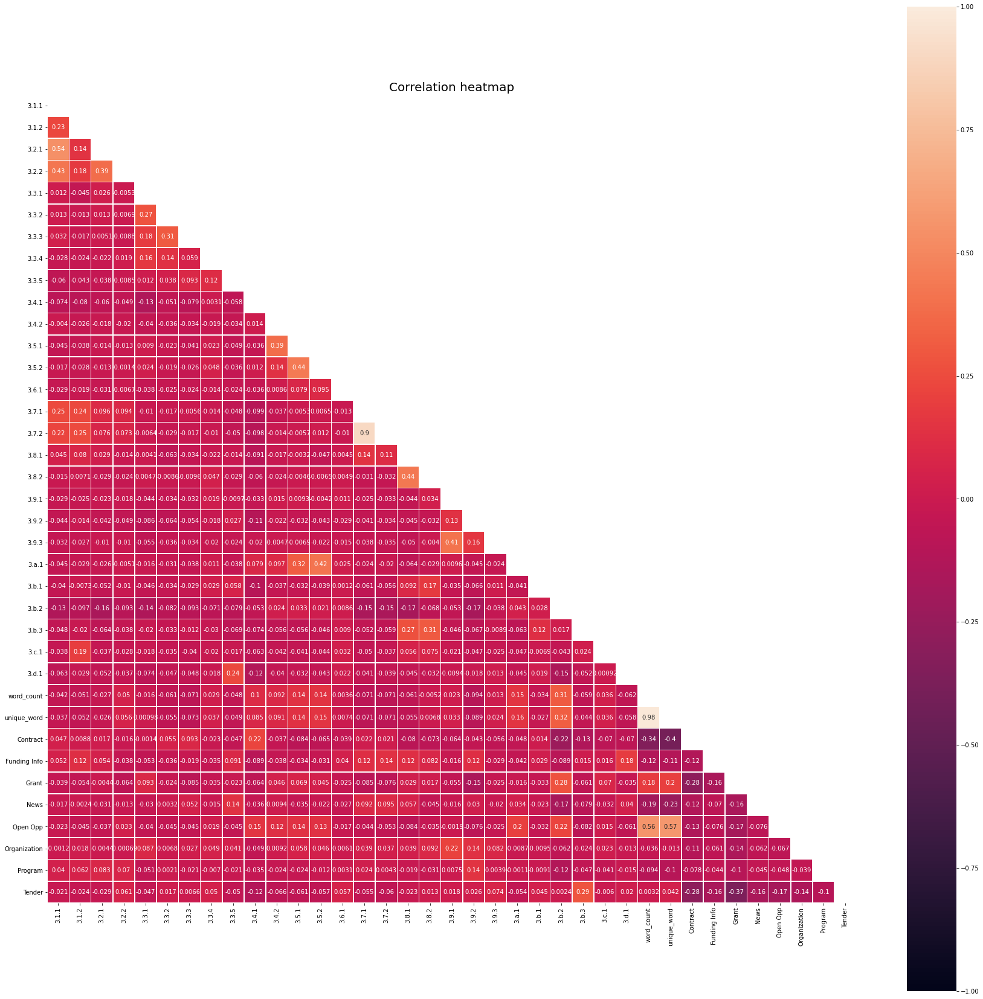

In [472]:
fig, ax = plt.subplots(figsize=(30,30))

mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True

sns.heatmap(corr,mask=mask, square = True, annot = True, vmin = -1, vmax = 1, linewidths = .5)
ax.set_title("Correlation heatmap",fontsize=20)

From the correlation map it shows that there is no correlation between the labels and word count or the type of contenders. Here we can conclude that the type of contenders and word count would not be a good predicting features.

### Word Cloud
The word that are showed the most in the text

In [473]:
from wordcloud import WordCloud, STOPWORDS
stopwords = set(STOPWORDS)

def draw_wordcloud(data, plot_title=None):
    wordcloud = WordCloud(
        scale=7,
        max_words=500,
        stopwords=stopwords,
        width = 800,
        height = 800,
        background_color='white',
        colormap='Greens',
        contour_width=3,
        contour_color='green').generate(''.join(data))
    
    plt.figure(figsize=(16,10), facecolor='white')
    plt.imshow(wordcloud)
    plt.title(plot_title, fontsize=20, pad=50)
    plt.axis("off")
    plt.show()

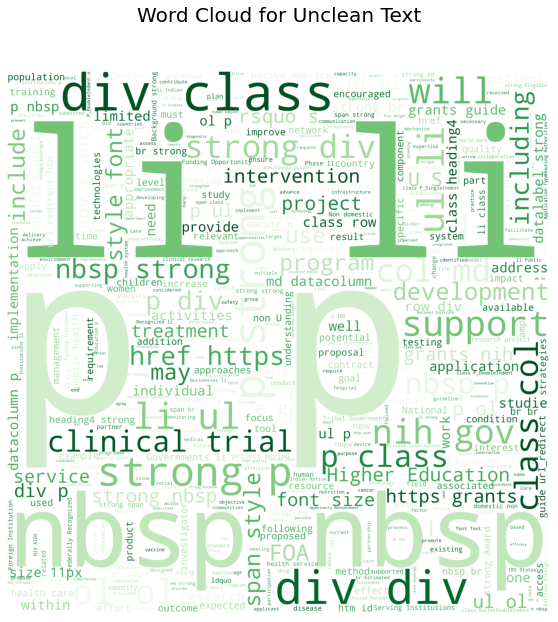

In [474]:
#word cloud for unclean text
draw_wordcloud(train.Text,'Word Cloud for Unclean Text')

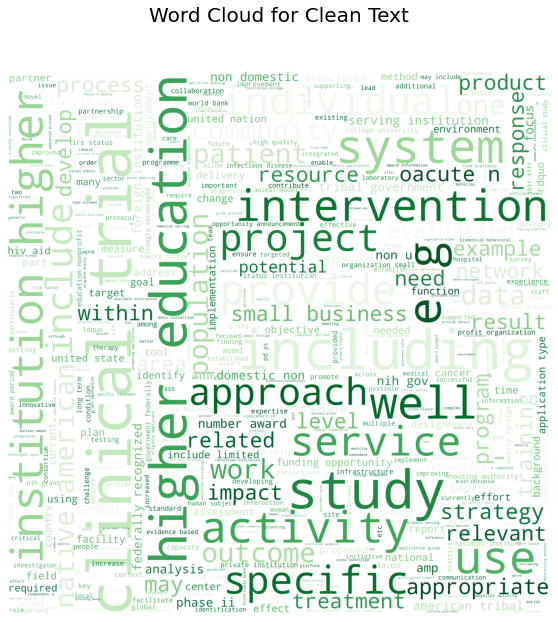

In [475]:
#word cloud for clean text
draw_wordcloud(feature_train.clean_text,'Word Cloud for Clean Text')

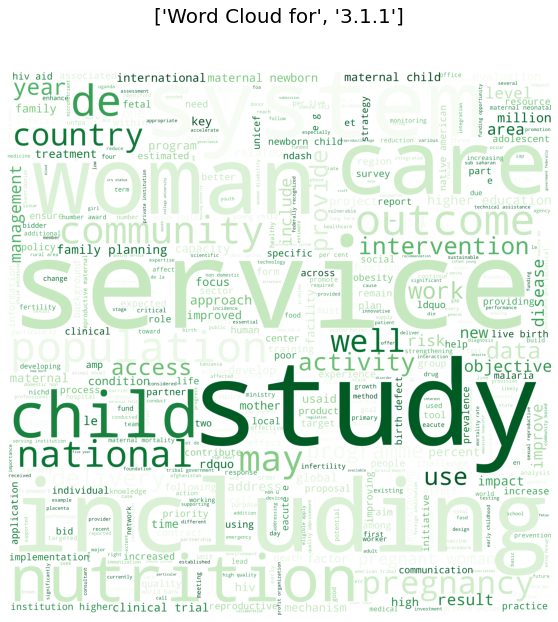

None


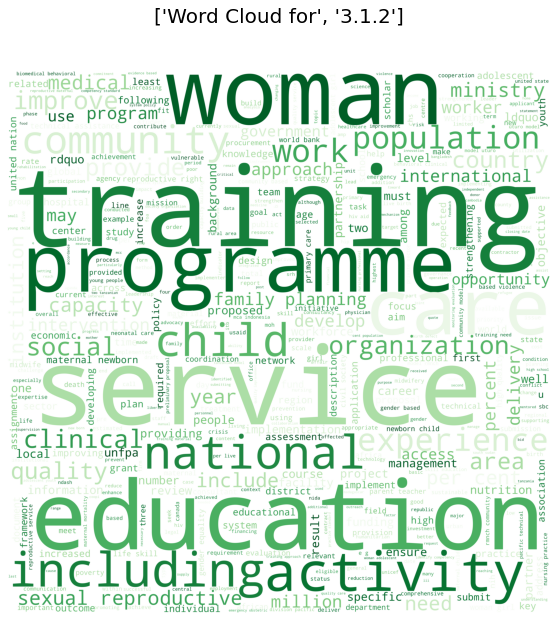

None


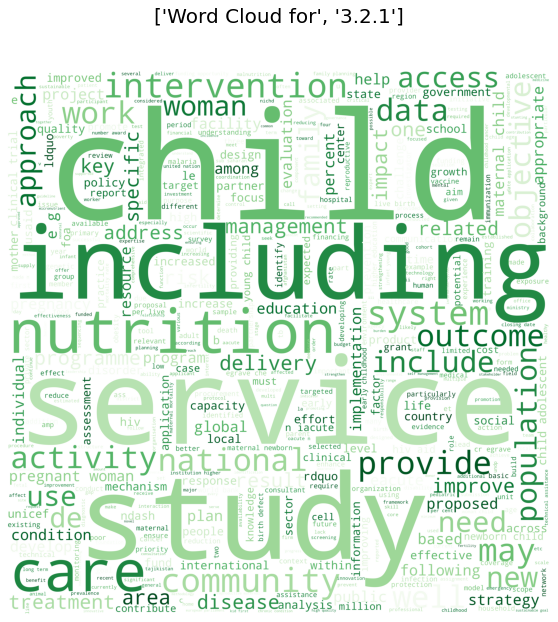

None


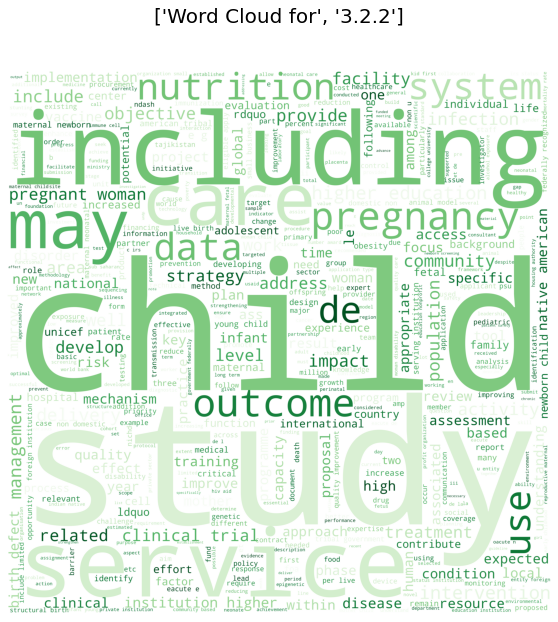

None


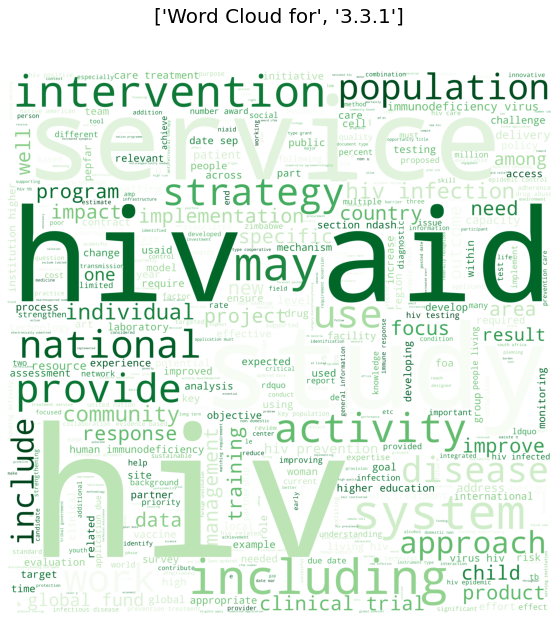

None


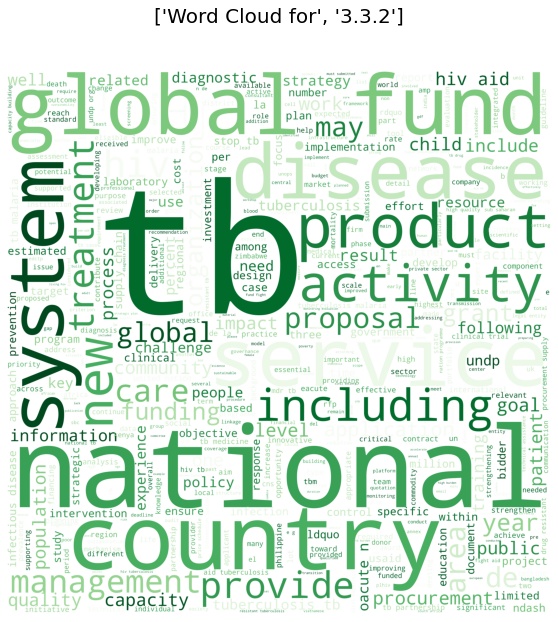

None


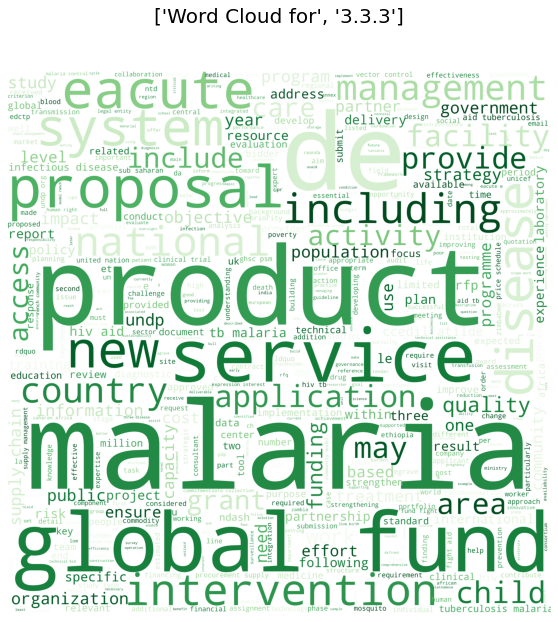

None


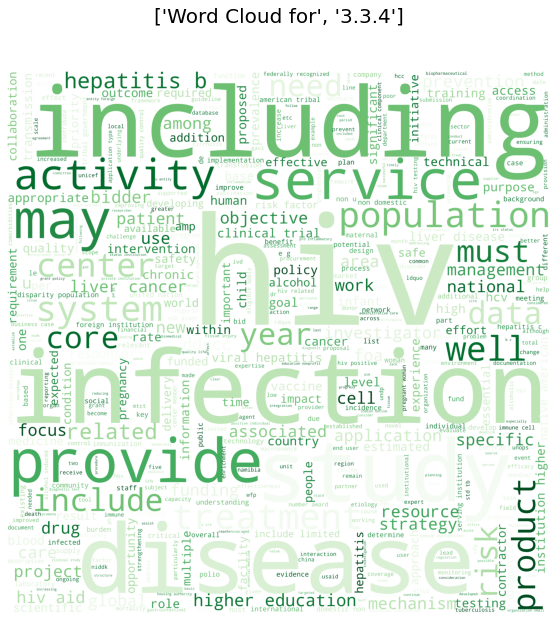

None


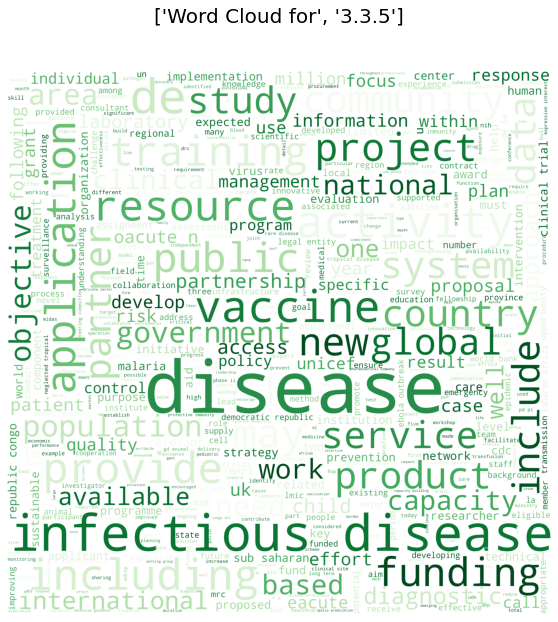

None


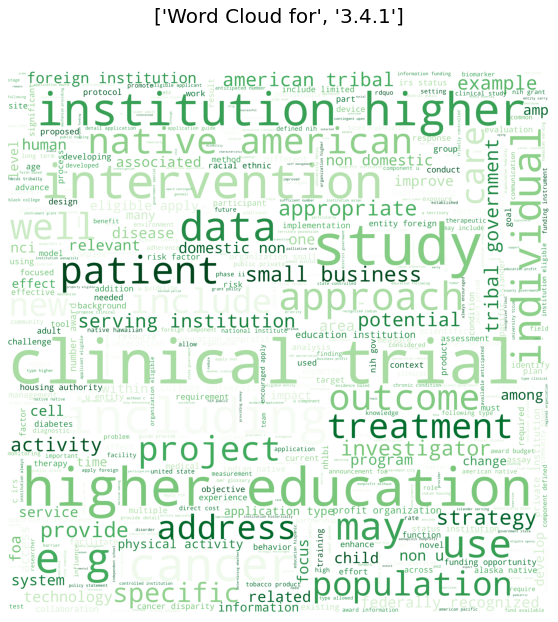

None


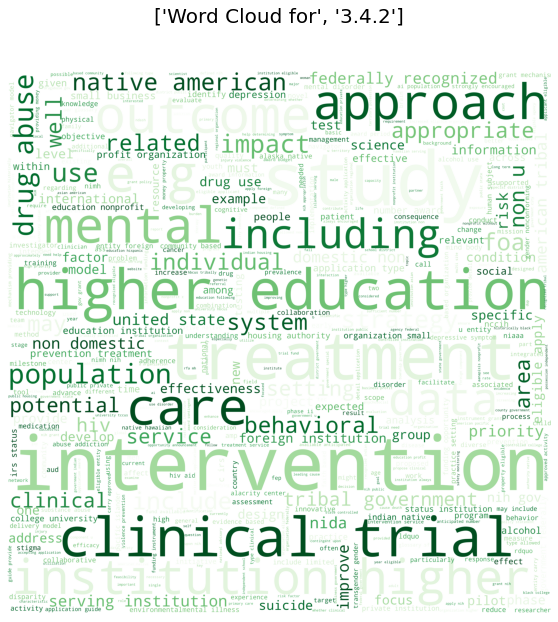

None


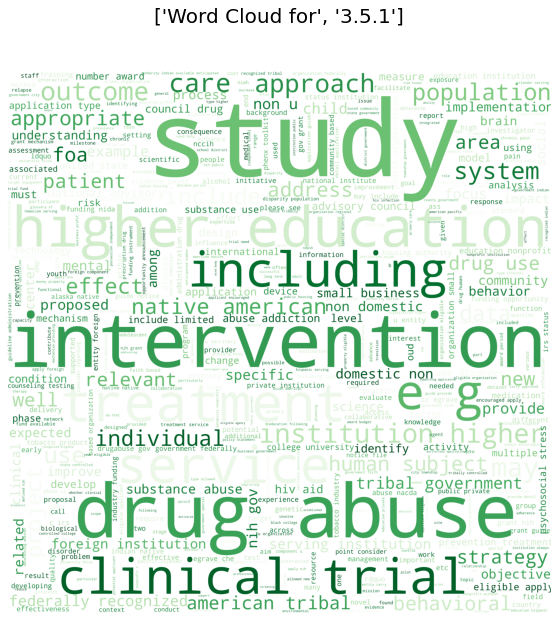

None


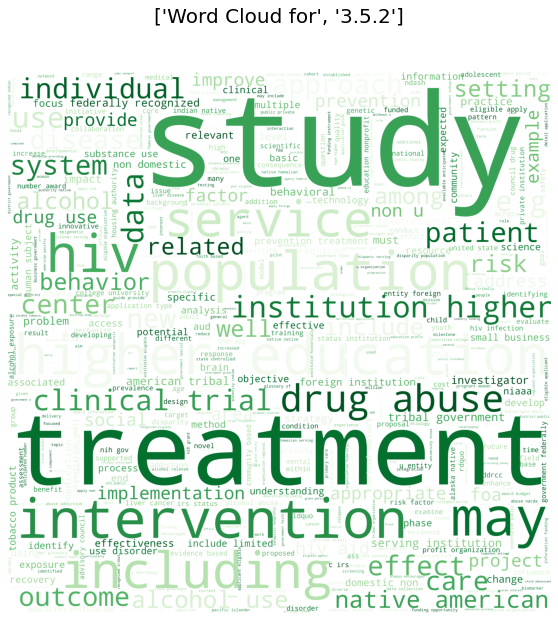

None


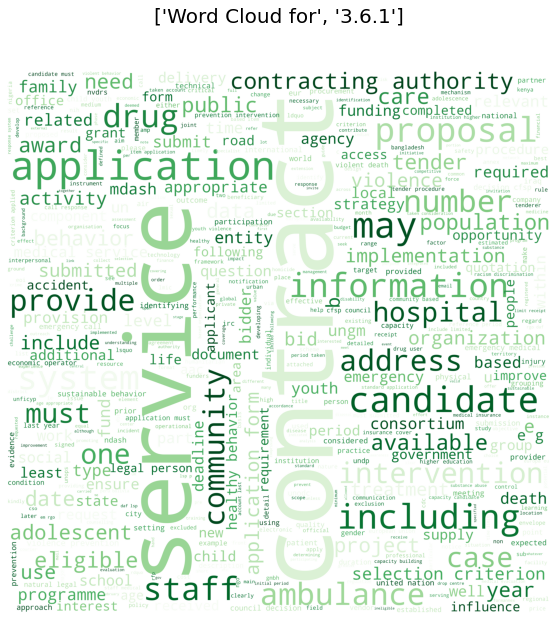

None


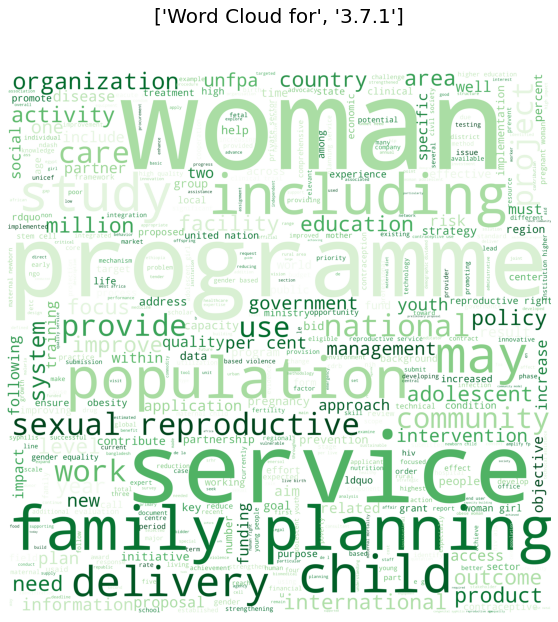

None


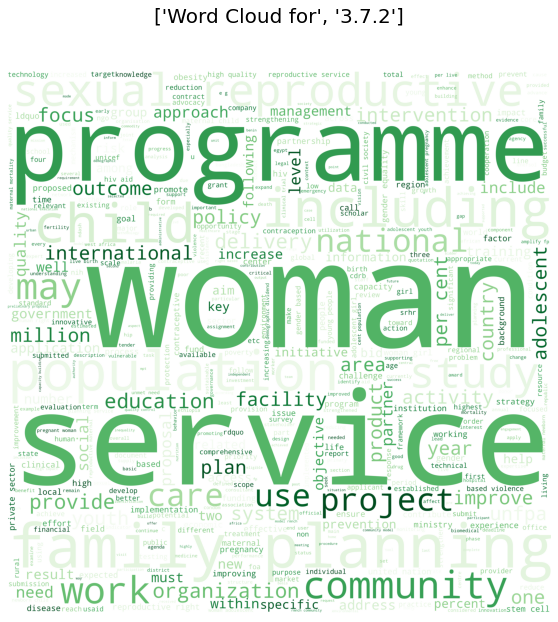

None


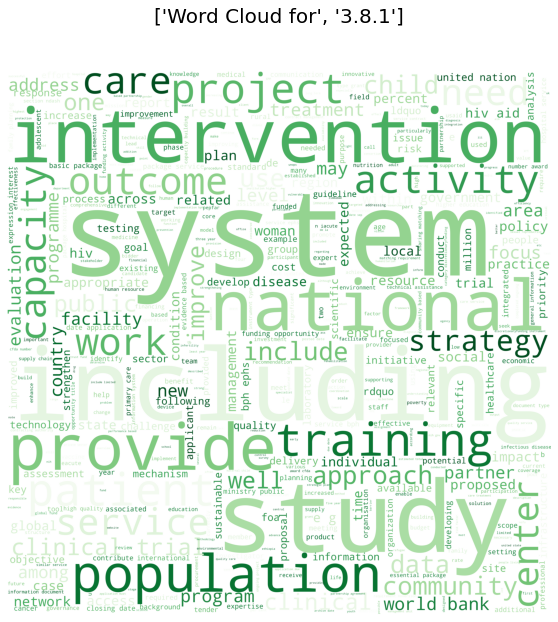

None


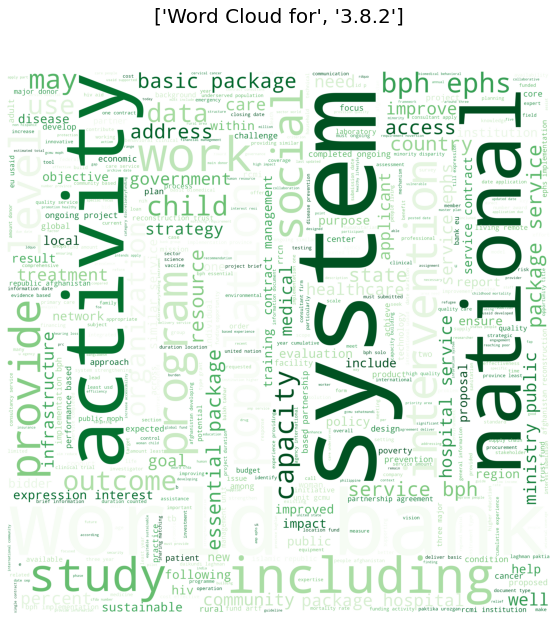

None


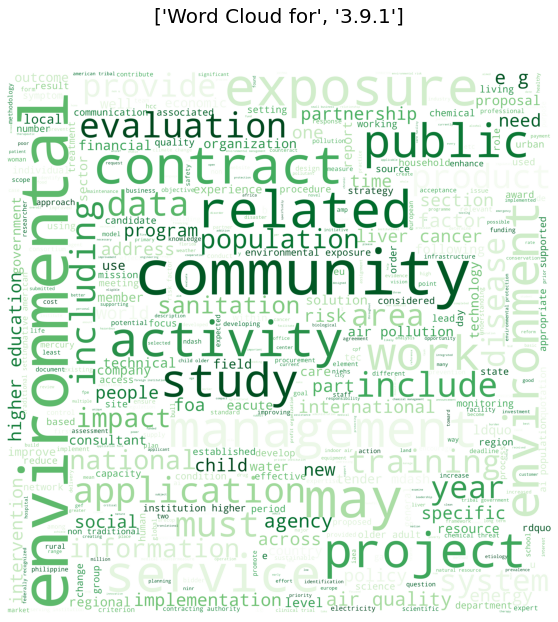

None


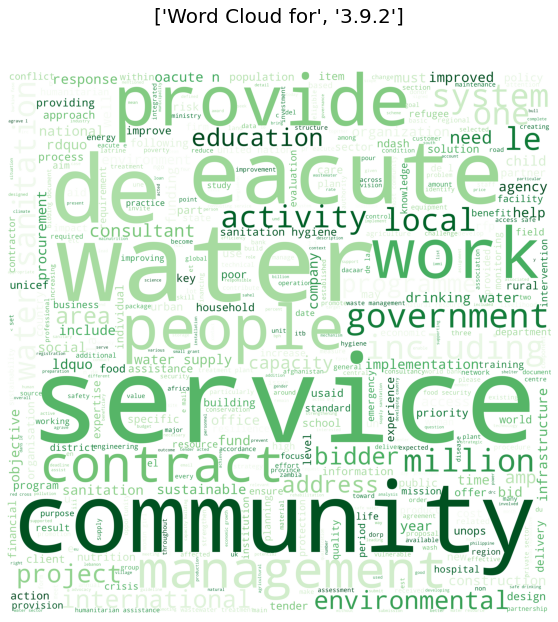

None


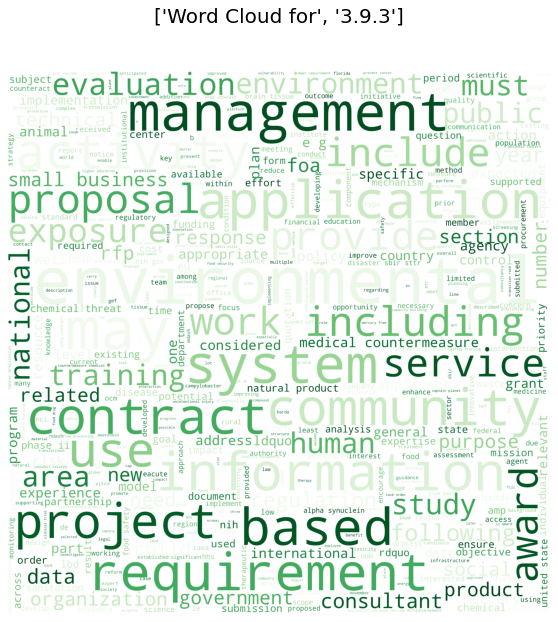

None


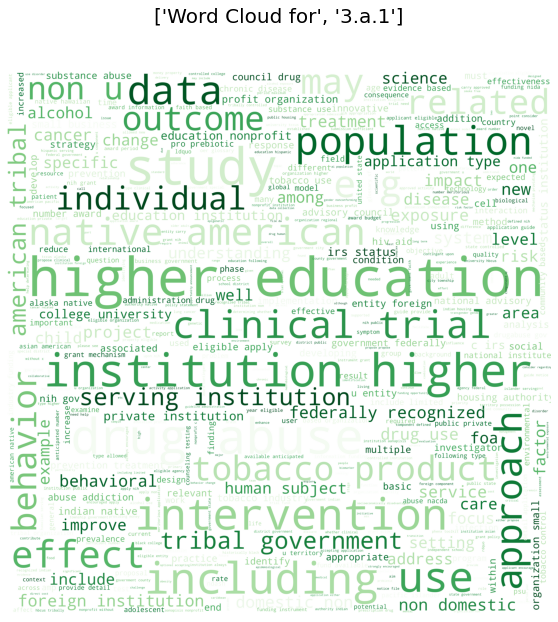

None


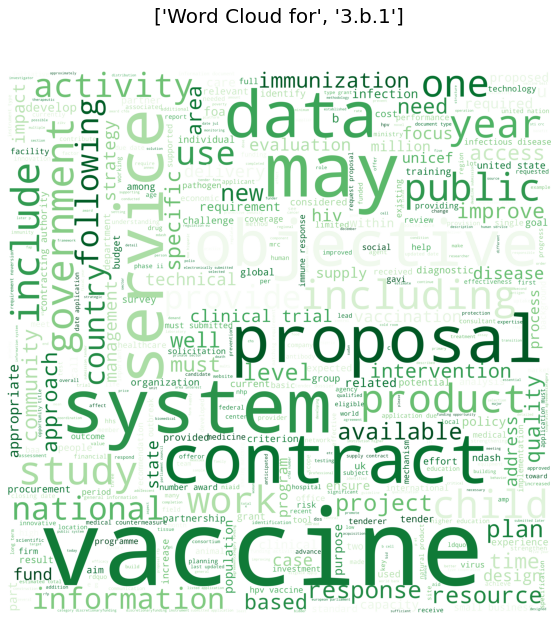

None


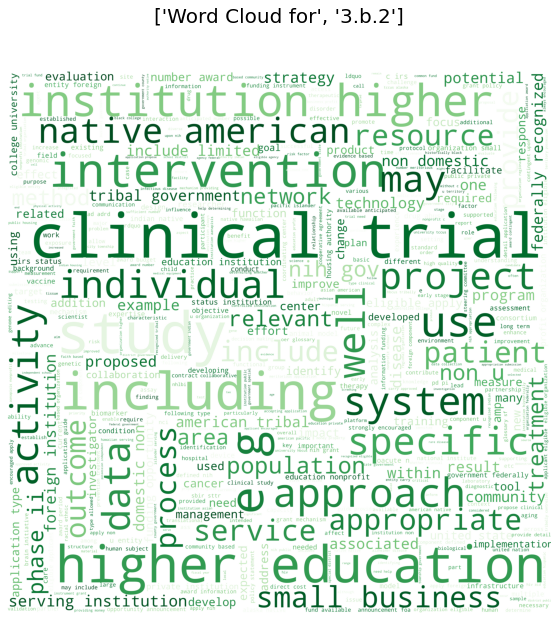

None


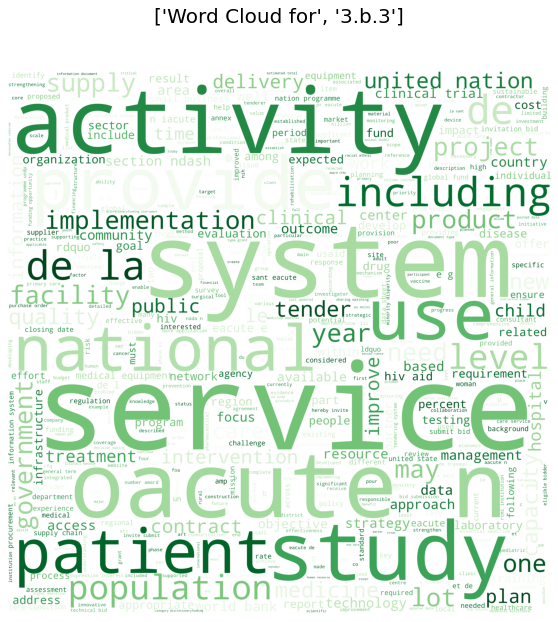

None


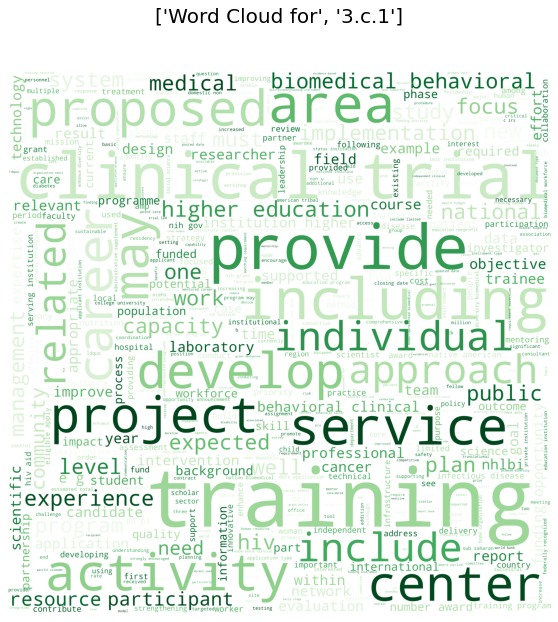

None


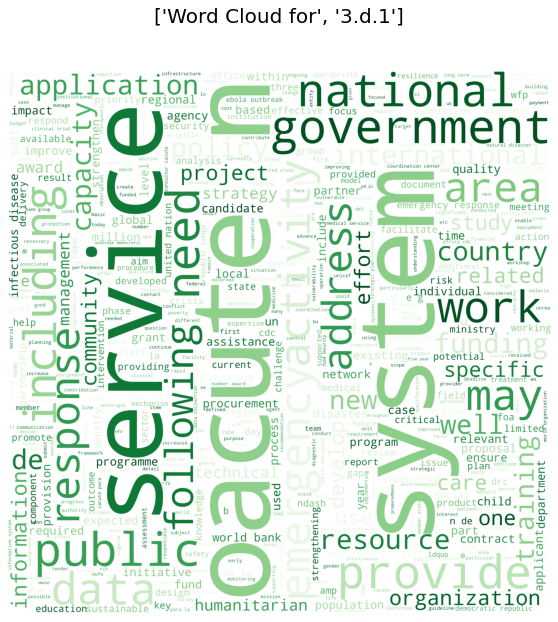

None


In [476]:
#word cloud for individual SDG3 27 indicators
for i in clean_train.columns[3:]:
    graph = clean_train[clean_train[i] == 1]
    print(draw_wordcloud(graph.clean_text,['Word Cloud for',i]))

### Word Counts

In the word count we can see the most repeated words in the text documents and how it spread between each 27 indicators.

In [477]:
def plot_hist(dataframe,columns,title,xaxis,colors):
    fig, axs = plt.subplots(1,len(columns),figsize=(15,5))
    for i, column in enumerate(columns): 
        axs[i].hist(dataframe[column],color=colors)
        axs[i].set_title(title[i])
        axs[i].set_xlabel(xaxis)
        
    plt.tight_layout()

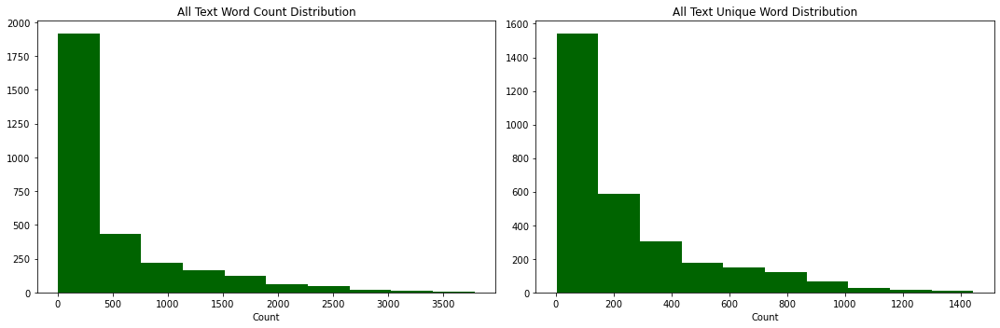

In [478]:
col = ['word_count','unique_word']
titles = ['All Text Word Count Distribution','All Text Unique Word Distribution']
xaxis = 'Count'

plot_hist(feature_train,col,titles,xaxis,'darkgreen')

In [479]:
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

cvec = CountVectorizer(stop_words='english')

tvec = TfidfVectorizer(stop_words='english')

In [480]:
#cvec count
cvec_text = cvec.fit_transform(feature_train.clean_text)
cvec_df = pd.DataFrame(cvec_text.todense(),columns=cvec.get_feature_names())
cvec_text_count = cvec_df.sum(axis=0).sort_values(ascending=False)
cvec_text_count.head(10)

clinical       5205
study          4657
application    4565
data           3845
institution    3558
disease        3422
trial          3257
service        3179
care           3057
award          3044
dtype: int64

In [481]:
#exploring word count in all 27 indicators
for i in clean_train.columns[3:]:
    text = clean_train[clean_train[i] == 1]
    cvec_text = cvec.fit_transform(text.clean_text)
    cvec_df = pd.DataFrame(cvec_text.todense(),columns=cvec.get_feature_names())
    cvec_text_count = cvec_df.sum(axis=0)
    print("-----------",i,"Word Count----------\n",cvec_text_count.sort_values(ascending=False).head(10))

----------- 3.1.1 Word Count----------
 child         468
woman         397
maternal      385
eacute        340
service       258
care          207
community     189
including     173
population    169
quality       168
dtype: int64
----------- 3.1.2 Word Count----------
 training     150
service      138
education    118
woman        110
care         107
community    105
child         97
quality       88
national      83
programme     79
dtype: int64
----------- 3.2.1 Word Count----------
 child        998
service      364
maternal     332
care         280
study        277
woman        268
community    240
eacute       231
nutrition    225
year         212
dtype: int64
----------- 3.2.2 Word Count----------
 child          481
eacute         330
maternal       311
care           299
woman          271
service        219
institution    210
study          209
including      194
clinical       191
dtype: int64
----------- 3.3.1 Word Count----------
 hiv            2226
aid             58

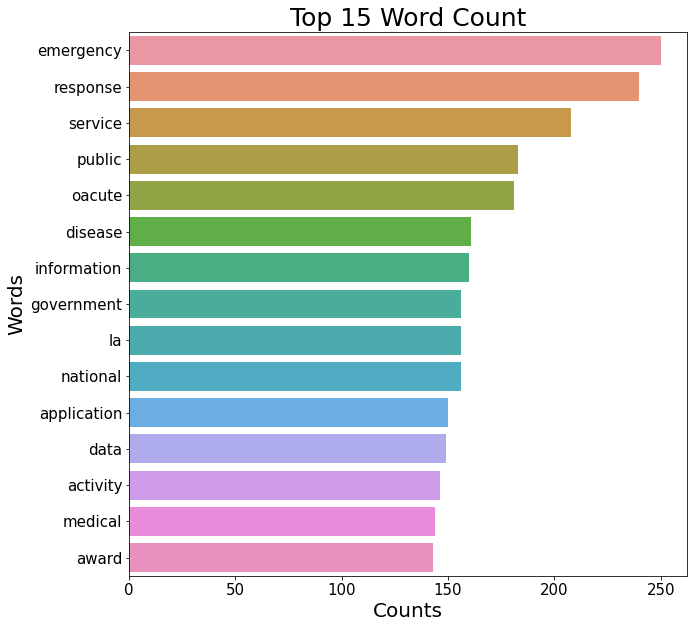

In [482]:
#making new dataframe for wordcount
cvec_data = pd.DataFrame(cvec_text_count)
cvec_data.reset_index(inplace=True)
cvec_data.columns = 'Words','Counts'

#graphing the word count in bar chart
plt.figure(figsize=(10,10))
plt.title('Top 15 Word Count',fontsize=25)

sns.barplot(data=cvec_data.sort_values(by='Counts',ascending=False).head(15),x='Counts',y='Words',orient='h')

plt.xlabel('Counts', fontsize=20)
plt.ylabel('Words', fontsize=20)
plt.tick_params(labelsize=15)

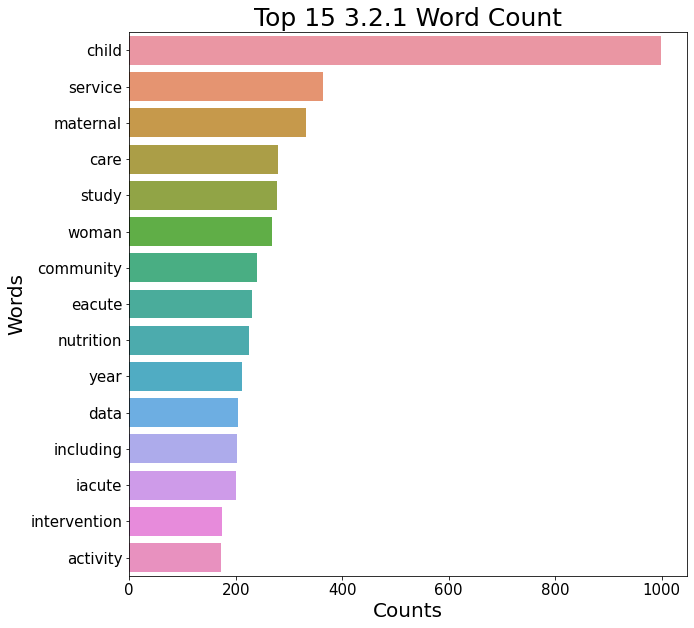

In [483]:
#sample 3.2.1
text = clean_train[clean_train['3.2.1'] == 1]['clean_text']
cvec_text = cvec.fit_transform(text)
cvec_df = pd.DataFrame(cvec_text.todense(),columns=cvec.get_feature_names())
cvec_text_count = cvec_df.sum(axis=0).sort_values(ascending=False)

#making new dataframe for 3.2.1 wordcount
cvec_data = pd.DataFrame(cvec_text_count)
cvec_data.reset_index(inplace=True)
cvec_data.columns = 'Words','Counts'

#graphing the word count in bar chart
plt.figure(figsize=(10,10))
plt.title('Top 15 3.2.1 Word Count',fontsize=25)

sns.barplot(data=cvec_data.sort_values(by='Counts',ascending=False).head(15),x='Counts',y='Words',orient='h')

plt.xlabel('Counts', fontsize=20)
plt.ylabel('Words', fontsize=20)
plt.tick_params(labelsize=15)

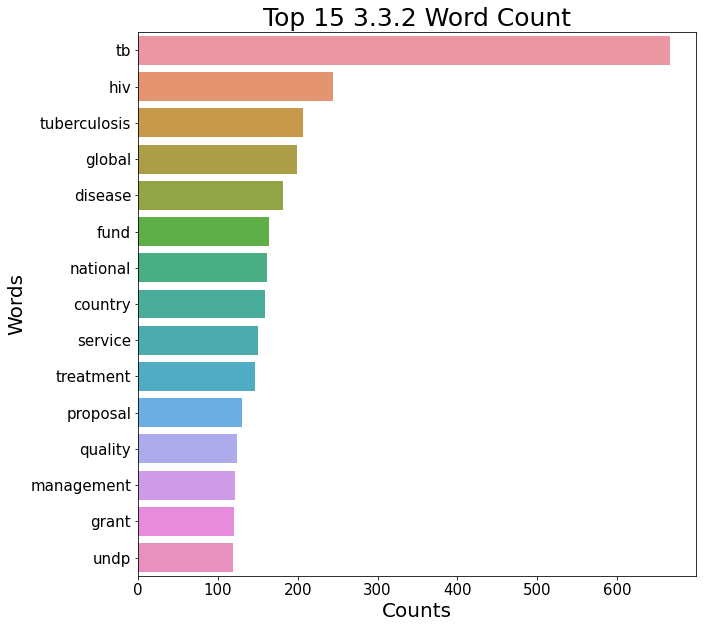

In [484]:
#sample 3.3.2
text = clean_train[clean_train['3.3.2'] == 1]['clean_text']
cvec_text = cvec.fit_transform(text)
cvec_df = pd.DataFrame(cvec_text.todense(),columns=cvec.get_feature_names())
cvec_text_count = cvec_df.sum(axis=0).sort_values(ascending=False)

#making new dataframe for 3.3.2 wordcount
cvec_data = pd.DataFrame(cvec_text_count)
cvec_data.reset_index(inplace=True)
cvec_data.columns = 'Words','Counts'

#graphing the word count in bar chart
plt.figure(figsize=(10,10))
plt.title('Top 15 3.3.2 Word Count',fontsize=25)

sns.barplot(data=cvec_data.sort_values(by='Counts',ascending=False).head(15),x='Counts',y='Words',orient='h')

plt.xlabel('Counts', fontsize=20)
plt.ylabel('Words', fontsize=20)
plt.tick_params(labelsize=15)

### Word Weights

In [485]:
#tvec count
tvec_text = tvec.fit_transform(feature_train.clean_text)
tvec_df = pd.DataFrame(tvec_text.todense(),columns=tvec.get_feature_names())
tvec_text_count = tvec_df.sum(axis=0)
tvec_text_count.sort_values(ascending=False).head(10)

diabetes       87.190276
care           70.771612
date           68.173209
hiv            67.731755
service        62.545134
application    58.225893
clinical       53.406834
study          52.421746
child          50.233654
disease        49.019283
dtype: float64

In [486]:
#exploring word weight in all 27 indicators
for i in clean_train.columns[3:]:
    text = clean_train[clean_train[i] == 1]
    tvec_text = tvec.fit_transform(text.clean_text)
    tvec_df = pd.DataFrame(tvec_text.todense(),columns=tvec.get_feature_names())
    tvec_text_count = tvec_df.sum(axis=0)
    print("-----------",i,"Word Weight Count----------\n",tvec_text_count.sort_values(ascending=False).head(10))

----------- 3.1.1 Word Weight Count----------
 maternal        12.806045
child           11.013473
service          7.938503
woman            7.788383
newborn          7.650454
reproductive     5.088804
care             5.001364
mortality        4.927232
diabetes         4.893062
gestational      4.844538
dtype: float64
----------- 3.1.2 Word Weight Count----------
 child           4.117302
maternal        4.018345
service         3.731106
programme       3.486504
care            3.427526
woman           3.392062
newborn         3.389919
reproductive    3.127263
quality         2.964802
training        2.848367
dtype: float64
----------- 3.2.1 Word Weight Count----------
 child        17.809752
maternal     10.803605
newborn       8.495705
service       7.290401
date          7.020206
nutrition     6.316780
woman         6.171270
care          5.689863
hiv           5.297806
community     4.912951
dtype: float64
----------- 3.2.2 Word Weight Count----------
 child        8.348452
mater

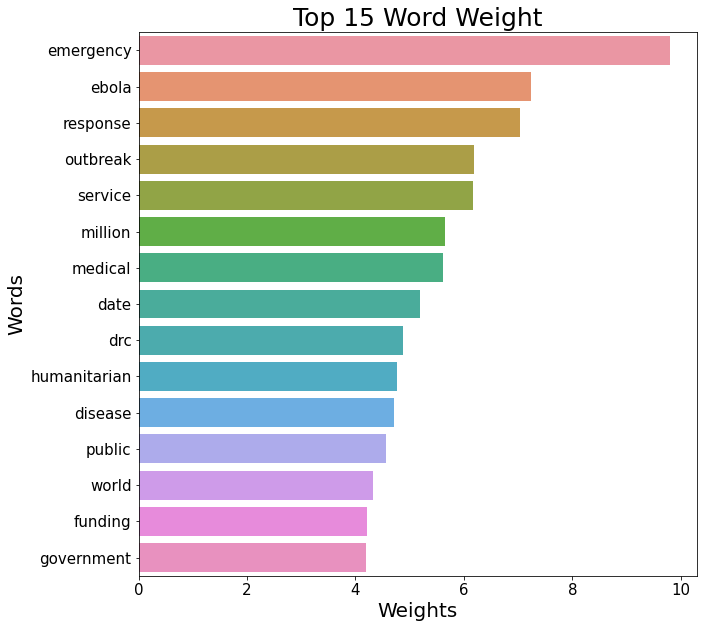

In [487]:
#make dataframe for graphing
tvec_data = pd.DataFrame(tvec_text_count)
tvec_data.reset_index(inplace=True)
tvec_data.columns = 'Words','Weights'

#graphing bar chart for word weight
plt.figure(figsize=(10,10))
plt.title('Top 15 Word Weight',fontsize=25)

sns.barplot(data=tvec_data.sort_values(by='Weights',ascending=False).head(15),x='Weights',y='Words',orient='h')

plt.xlabel('Weights', fontsize=20)
plt.ylabel('Words', fontsize=20)
plt.tick_params(labelsize=15)

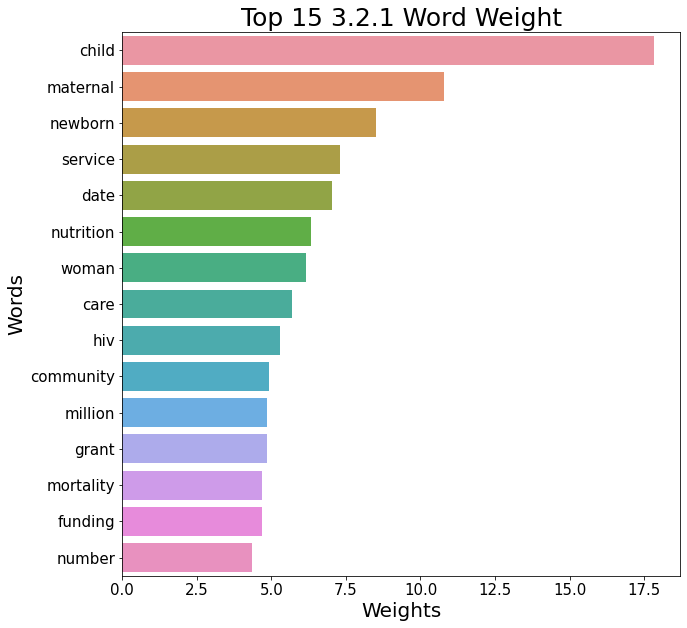

In [488]:
#sample 3.2.1
text = clean_train[clean_train['3.2.1'] == 1]['clean_text']
tvec_text = tvec.fit_transform(text)
tvec_df = pd.DataFrame(tvec_text.todense(),columns=tvec.get_feature_names())
tvec_text_count = tvec_df.sum(axis=0)
tvec_data = pd.DataFrame(tvec_text_count)
tvec_data.reset_index(inplace=True)
tvec_data.columns = 'Words','Weights'

#graphing bar chart for 3.2.1 word weight
plt.figure(figsize=(10,10))
plt.title('Top 15 3.2.1 Word Weight',fontsize=25)

sns.barplot(data=tvec_data.sort_values(by='Weights',ascending=False).head(15),x='Weights',y='Words',orient='h')

plt.xlabel('Weights', fontsize=20)
plt.ylabel('Words', fontsize=20)
plt.tick_params(labelsize=15)

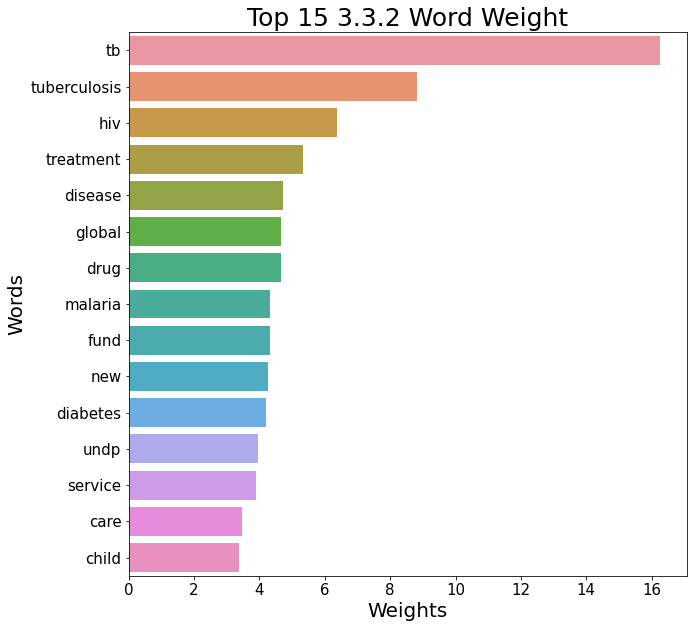

In [489]:
#sample 3.2.1
text = clean_train[clean_train['3.3.2'] == 1]['clean_text']
tvec_text = tvec.fit_transform(text)
tvec_df = pd.DataFrame(tvec_text.todense(),columns=tvec.get_feature_names())
tvec_text_count = tvec_df.sum(axis=0)
tvec_data = pd.DataFrame(tvec_text_count)
tvec_data.reset_index(inplace=True)
tvec_data.columns = 'Words','Weights'

#graphing bar chart for 3.3.2 word weight
plt.figure(figsize=(10,10))
plt.title('Top 15 3.3.2 Word Weight',fontsize=25)

sns.barplot(data=tvec_data.sort_values(by='Weights',ascending=False).head(15),x='Weights',y='Words',orient='h')

plt.xlabel('Weights', fontsize=20)
plt.ylabel('Words', fontsize=20)
plt.tick_params(labelsize=15)

### Word Frequencies

The word count allow us to defined how many times a word is repeated however, it is hard to understand from just count. So I will be exploring how many time the word is repeted in proportion to the total word count shown as frequency in %:

In [490]:
cvec_data['Freq'] = cvec_data['Counts'] / len(cvec_data) * 100
cvec_data.sort_values(by='Counts',ascending=False, inplace=True)
cvec_data

,Words,Counts,Freq
0,tb,666,13.357401
1,hiv,244,4.893702
2,tuberculosis,206,4.131568
3,global,199,3.991175
4,disease,182,3.650221
...,...,...,...
3595,dignity,1,0.020056
3594,distill,1,0.020056
3593,disseminated,1,0.020056
3592,disruption,1,0.020056


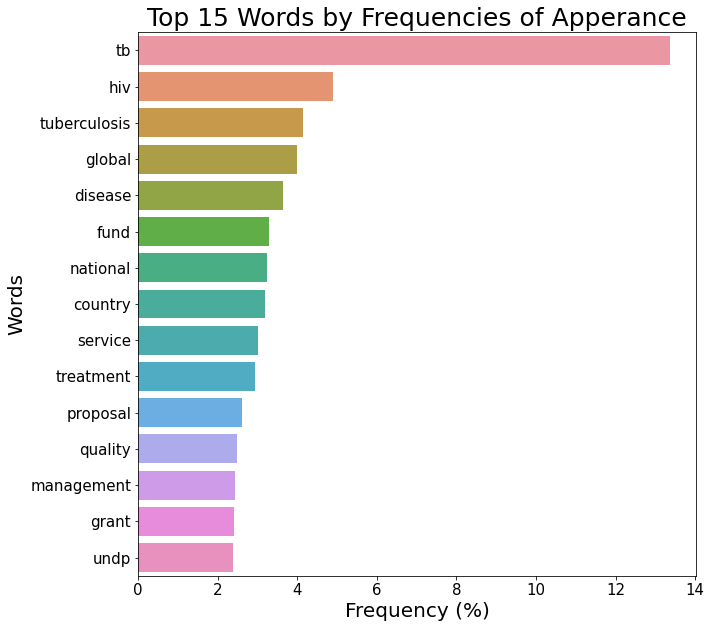

In [491]:
plt.figure(figsize=(10,10))
plt.title('Top 15 Words by Frequencies of Apperance',fontsize=25)

sns.barplot(data=cvec_data.head(15),x='Freq',y='Words',orient='h')

plt.xlabel('Frequency (%)',fontsize=20)
plt.ylabel('Words',fontsize=20)
plt.tick_params(labelsize=15)

### Word Pairs

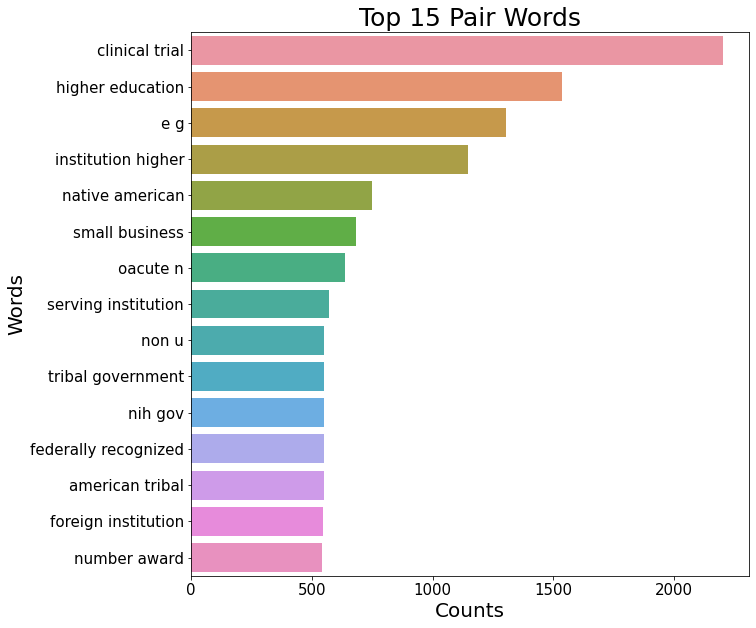

In [499]:
#graphing the word count in bar chart
plt.figure(figsize=(10,10))
plt.title('Top 15 Pair Words',fontsize=25)

sns.barplot(data=word_pair.head(15),x=1,y=0,orient='h')

plt.xlabel('Counts', fontsize=20)
plt.ylabel('Words', fontsize=20)
plt.tick_params(labelsize=15)

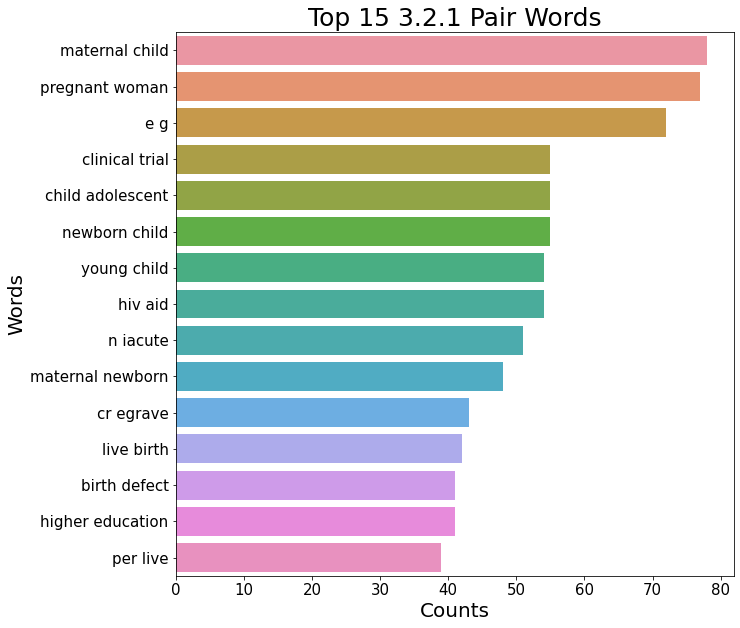

In [495]:
#graphing the word count in bar chart
plt.figure(figsize=(10,10))
plt.title('Top 15 3.2.1 Pair Words',fontsize=25)

sns.barplot(data=word_pair_321.head(15),x=1,y=0,orient='h')

plt.xlabel('Counts', fontsize=20)
plt.ylabel('Words', fontsize=20)
plt.tick_params(labelsize=15)

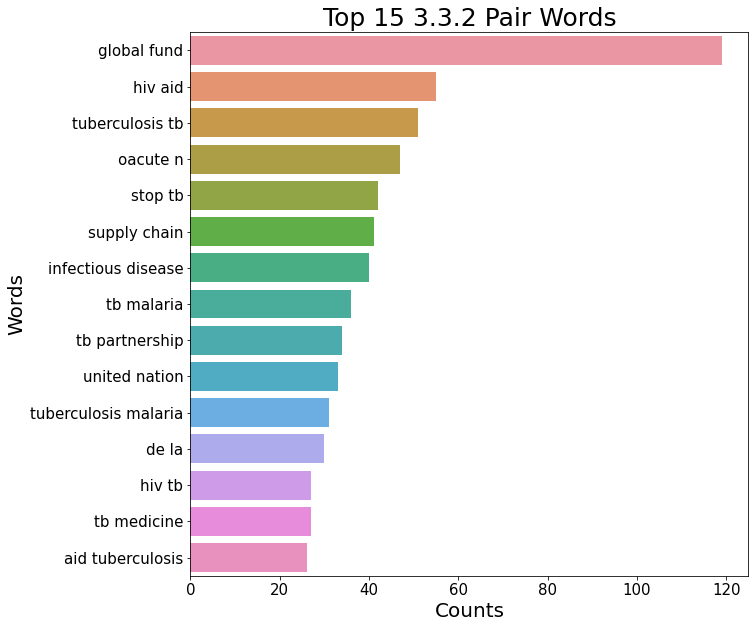

In [496]:
#graphing the word count in bar chart
plt.figure(figsize=(10,10))
plt.title('Top 15 3.3.2 Pair Words',fontsize=25)

sns.barplot(data=word_pair_332.head(15),x=1,y=0,orient='h')

plt.xlabel('Counts', fontsize=20)
plt.ylabel('Words', fontsize=20)
plt.tick_params(labelsize=15)

### Indicators

Now I will explore how different feature interact with the text type:

- How the word count distributes by indicator
- How the word count distributes by indicator and text type in boxplot
- How the many text type is in an indicator

But first we will see how the indicators are distributed in SDG 3:

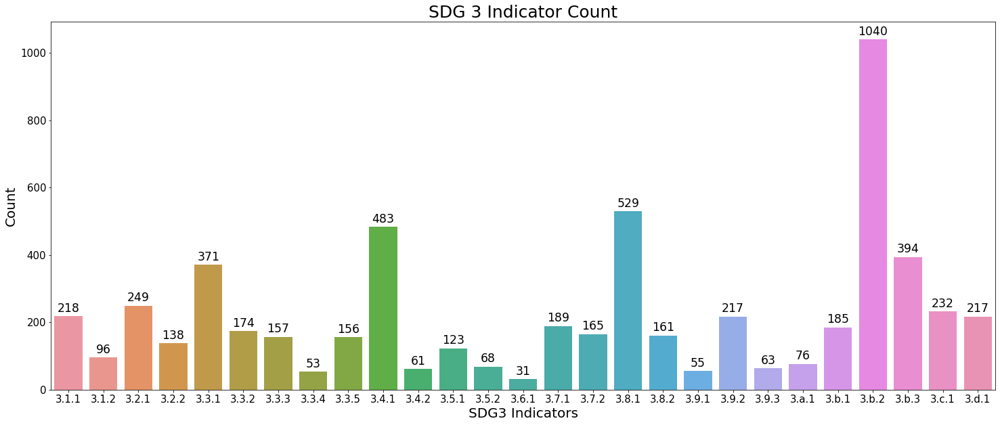

In [500]:
#total number of indicators
indi = pd.DataFrame(clean_train.iloc[:,3:30].sum())
indi.reset_index(inplace=True)

plt.figure(figsize=(25,10))
plt.title('SDG 3 Indicator Count',fontsize=25)

ax = sns.barplot(data=indi,x='index',y=0)

plt.xlabel('SDG3 Indicators',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.tick_params(labelsize=15)

#adding the text labels
rects = ax.patches
labels = clean_train.iloc[:,3:30].sum().values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va='bottom',fontsize='xx-large')

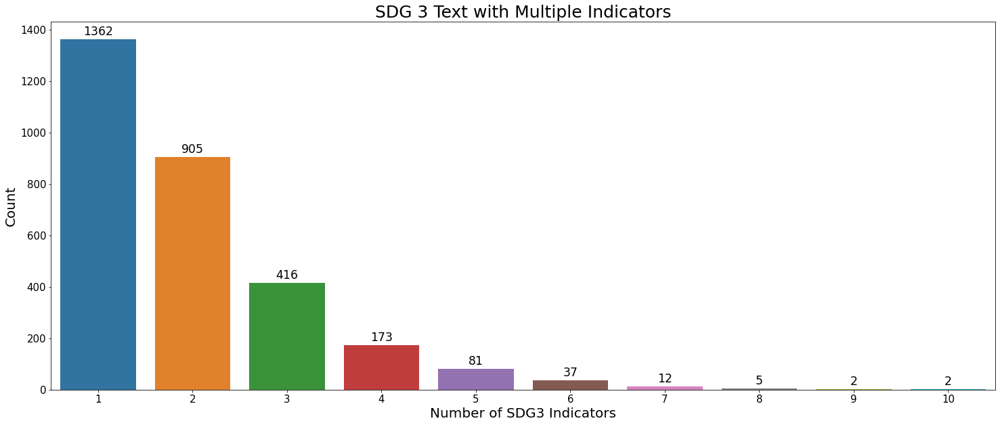

In [501]:
#number of text with multiple indicators
rowtotal = clean_train.iloc[:,3:30].sum(axis=1)
rowtotal_df = pd.DataFrame(rowtotal.value_counts())
rowtotal_df.reset_index(inplace=True)

plt.figure(figsize=(25,10))
plt.title('SDG 3 Text with Multiple Indicators',fontsize=25)

ax = sns.barplot(data=rowtotal_df,x='index',y=0)

plt.xlabel('Number of SDG3 Indicators',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.tick_params(labelsize=15)

#adding the text labels
rects = ax.patches
labels = rowtotal.value_counts().values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va='bottom', fontsize='xx-large')

##### 3.1.1

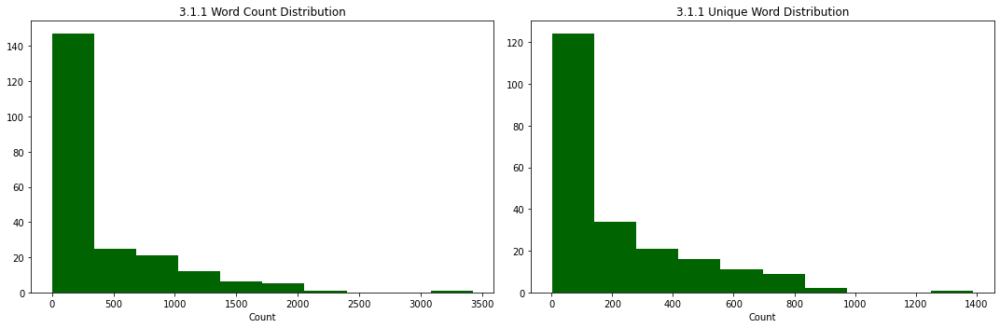

In [502]:
col = ['word_count','unique_word']
titles = ['3.1.1 Word Count Distribution','3.1.1 Unique Word Distribution']
xaxis = 'Count'

plot_hist(indi1,col,titles,xaxis,'darkgreen')

<AxesSubplot:xlabel='Type', ylabel='word_count'>

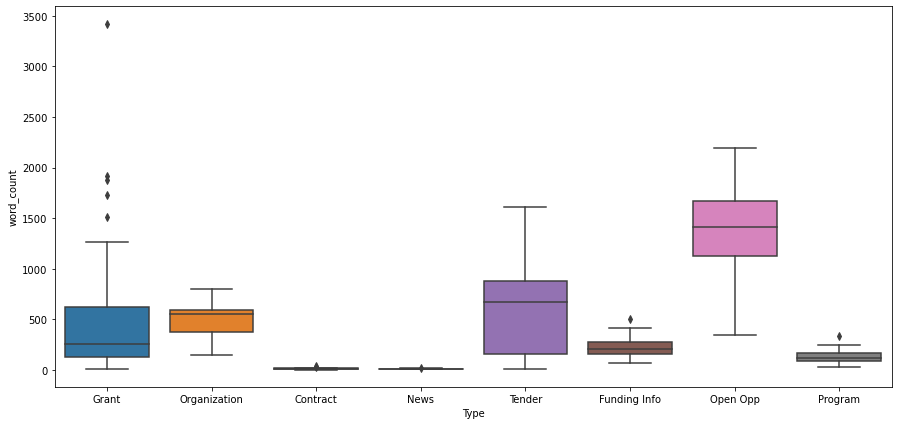

In [503]:
fig,ax = plt.subplots(figsize=(15,7))
sns.boxplot(x='Type',y='word_count',data=indi1)

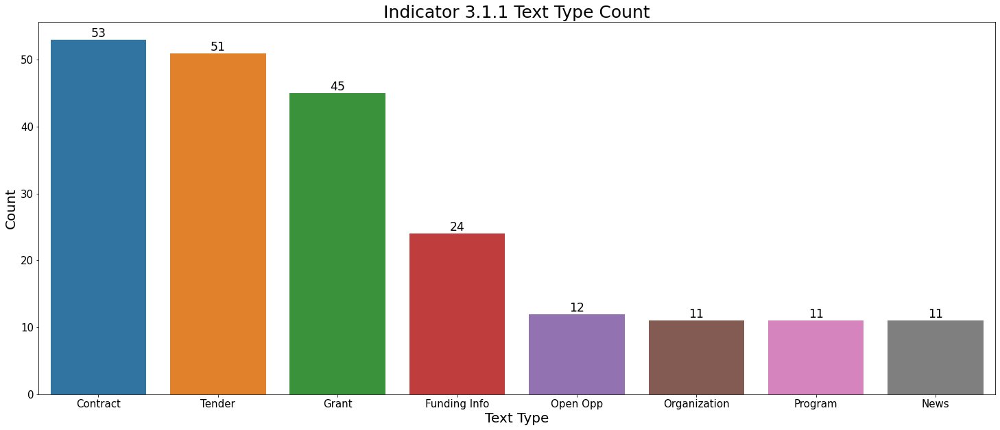

In [504]:
indi = pd.DataFrame(indi1.Type.value_counts())
indi.reset_index(inplace=True)

plt.figure(figsize=(25,10))
plt.title('Indicator 3.1.1 Text Type Count',fontsize=25)

ax = sns.barplot(data=indi,x='index',y='Type')

plt.xlabel('Text Type',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.tick_params(labelsize=15)

#adding the text labels
rects = ax.patches
labels = indi1.Type.value_counts().values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height, label, ha='center', va='bottom',fontsize='xx-large')

#### 3.1.2 

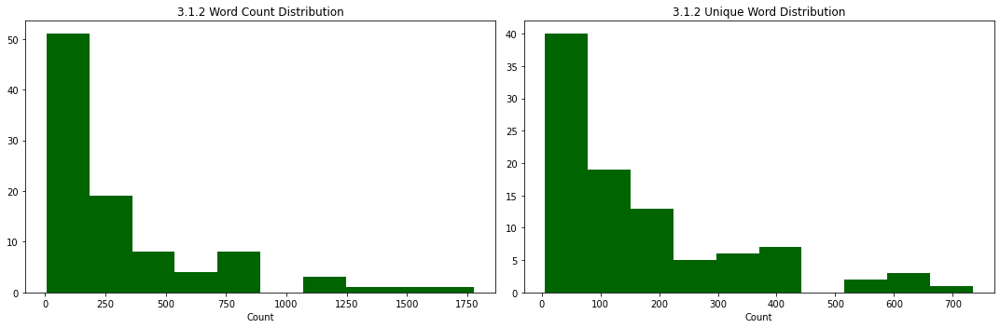

In [505]:
col = ['word_count','unique_word']
titles = ['3.1.2 Word Count Distribution','3.1.2 Unique Word Distribution']
xaxis = 'Count'

plot_hist(indi2,col,titles,xaxis,'darkgreen')

<AxesSubplot:xlabel='Type', ylabel='word_count'>

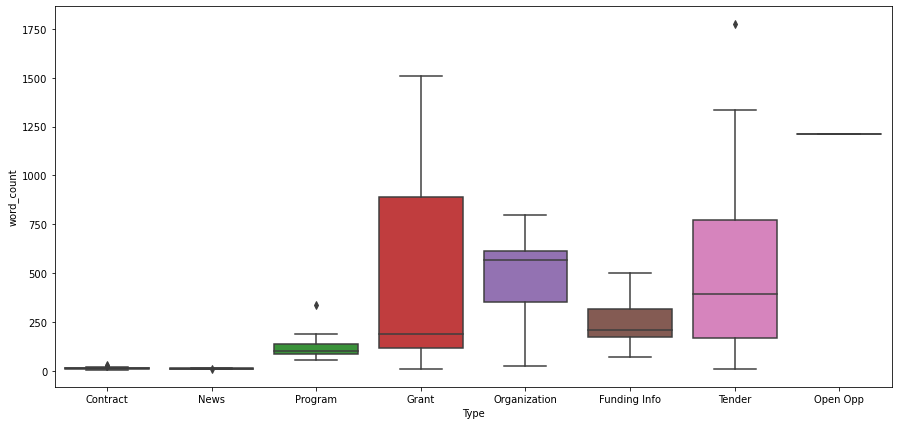

In [506]:
fig,ax = plt.subplots(figsize=(15,7))
sns.boxplot(x='Type',y='word_count',data=indi2)

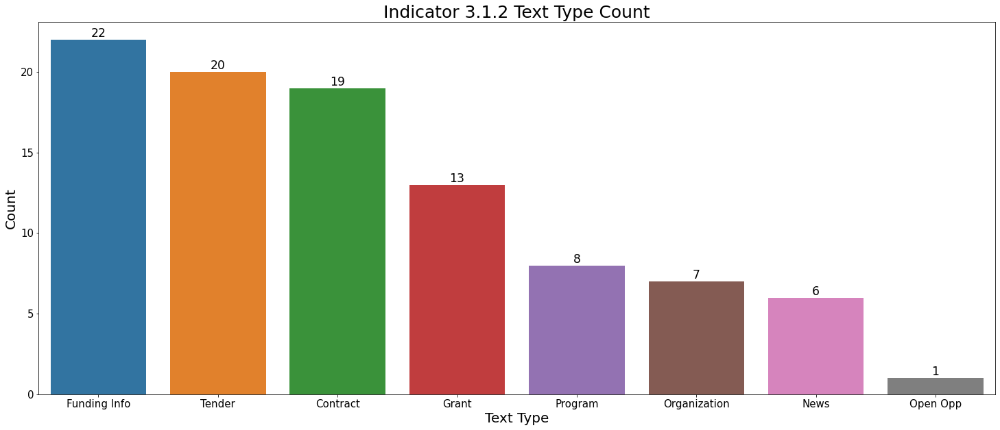

In [507]:
indi = pd.DataFrame(indi2.Type.value_counts())
indi.reset_index(inplace=True)

plt.figure(figsize=(25,10))
plt.title('Indicator 3.1.2 Text Type Count',fontsize=25)

ax = sns.barplot(data=indi,x='index',y='Type')

plt.xlabel('Text Type',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.tick_params(labelsize=15)

#adding the text labels
rects = ax.patches
labels = indi2.Type.value_counts().values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height, label, ha='center', va='bottom',fontsize='xx-large')

#### 3.2.1

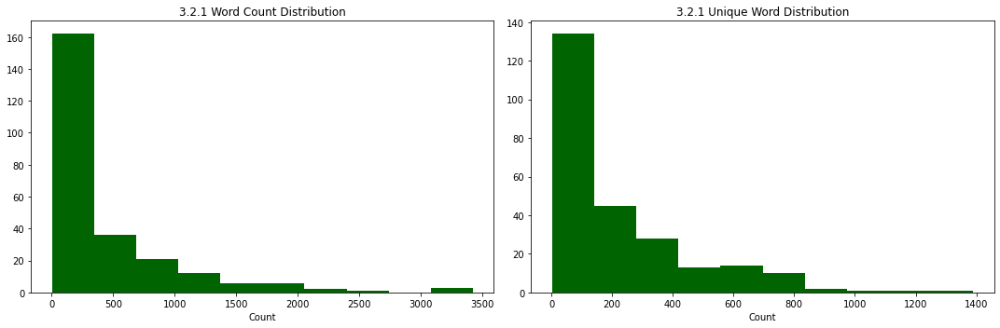

In [508]:
col = ['word_count','unique_word']
titles = ['3.2.1 Word Count Distribution','3.2.1 Unique Word Distribution']
xaxis = 'Count'

plot_hist(indi3,col,titles,xaxis,'darkgreen')

<AxesSubplot:xlabel='Type', ylabel='word_count'>

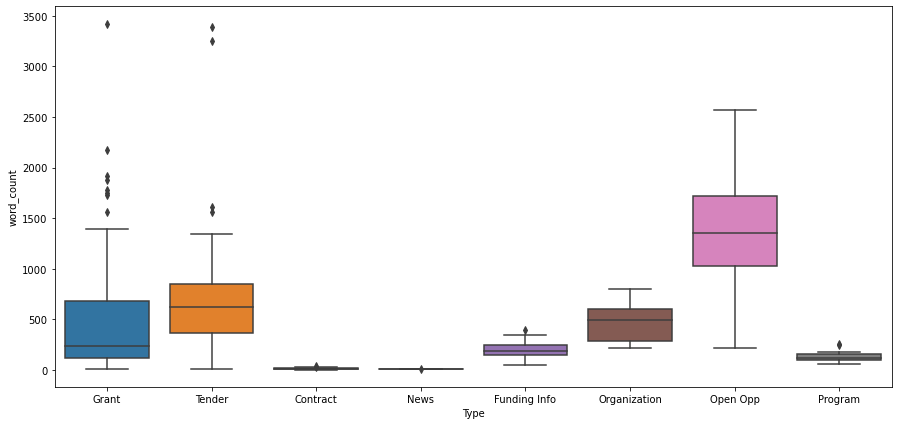

In [509]:
fig,ax = plt.subplots(figsize=(15,7))
sns.boxplot(x='Type',y='word_count',data=indi3)

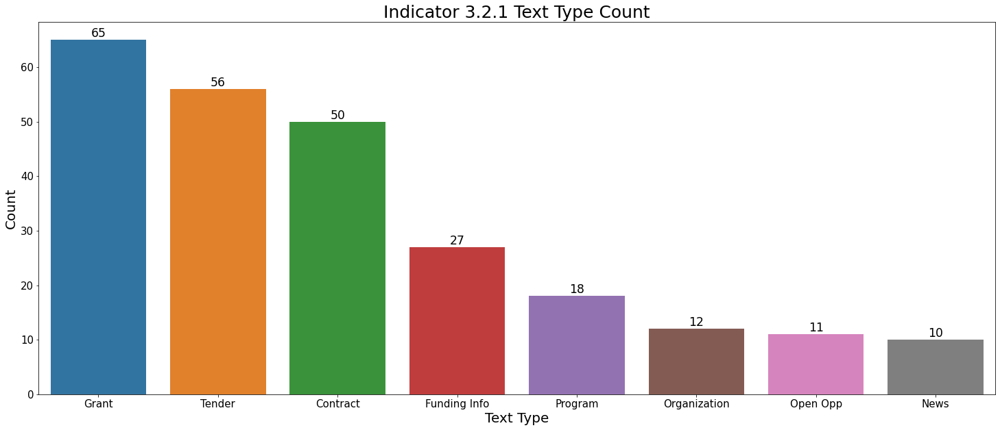

In [510]:
indi = pd.DataFrame(indi3.Type.value_counts())
indi.reset_index(inplace=True)

plt.figure(figsize=(25,10))
plt.title('Indicator 3.2.1 Text Type Count',fontsize=25)

ax = sns.barplot(data=indi,x='index',y='Type')

plt.xlabel('Text Type',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.tick_params(labelsize=15)

#adding the text labels
rects = ax.patches
labels = indi3.Type.value_counts().values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height, label, ha='center', va='bottom',fontsize='xx-large')

#### 3.2.2

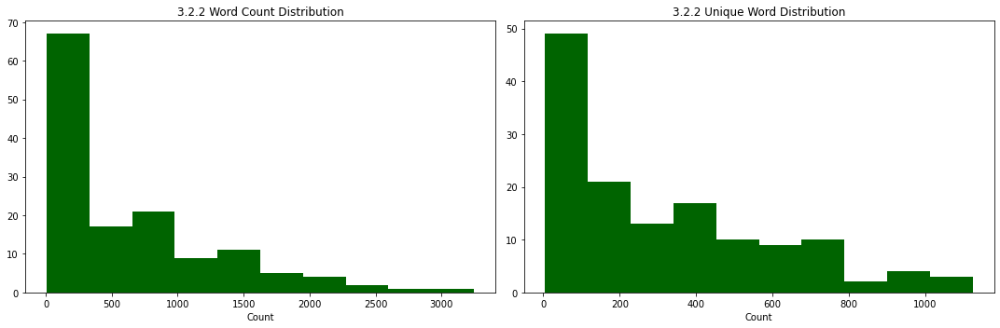

In [511]:
col = ['word_count','unique_word']
titles = ['3.2.2 Word Count Distribution','3.2.2 Unique Word Distribution']
xaxis = 'Count'

plot_hist(indi4,col,titles,xaxis,'darkgreen')

<AxesSubplot:xlabel='Type', ylabel='word_count'>

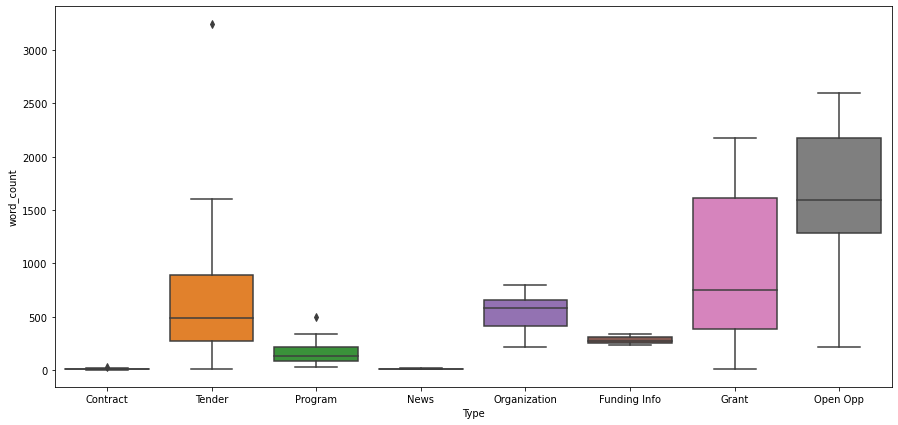

In [512]:
fig,ax = plt.subplots(figsize=(15,7))
sns.boxplot(x='Type',y='word_count',data=indi4)

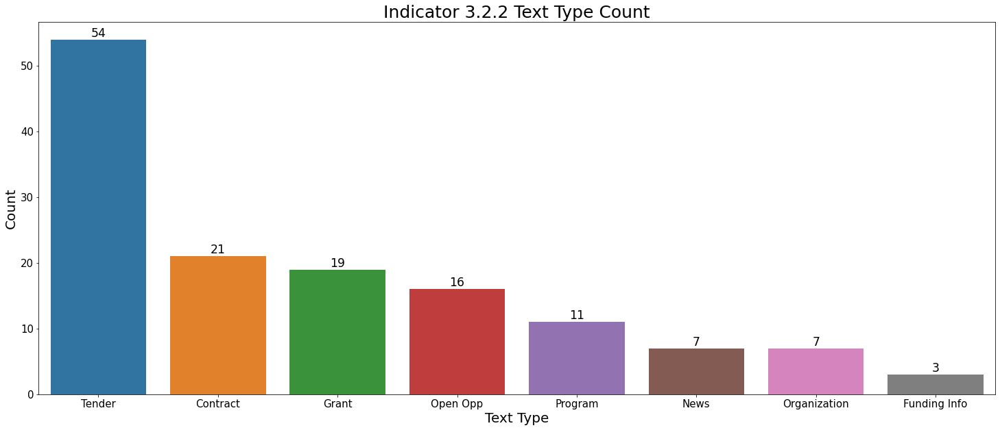

In [513]:
indi = pd.DataFrame(indi4.Type.value_counts())
indi.reset_index(inplace=True)

plt.figure(figsize=(25,10))
plt.title('Indicator 3.2.2 Text Type Count',fontsize=25)

ax = sns.barplot(data=indi,x='index',y='Type')

plt.xlabel('Text Type',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.tick_params(labelsize=15)

#adding the text labels
rects = ax.patches
labels = indi4.Type.value_counts().values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height, label, ha='center', va='bottom',fontsize='xx-large')

#### 3.3.1

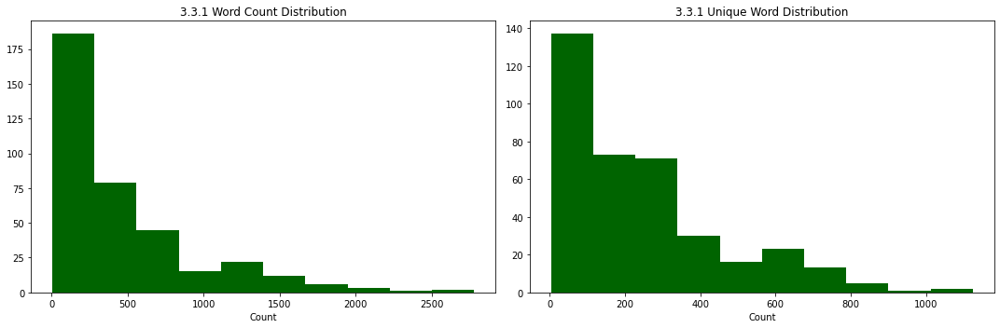

In [514]:
col = ['word_count','unique_word']
titles = ['3.3.1 Word Count Distribution','3.3.1 Unique Word Distribution']
xaxis = 'Count'

plot_hist(indi5,col,titles,xaxis,'darkgreen')

<AxesSubplot:xlabel='Type', ylabel='word_count'>

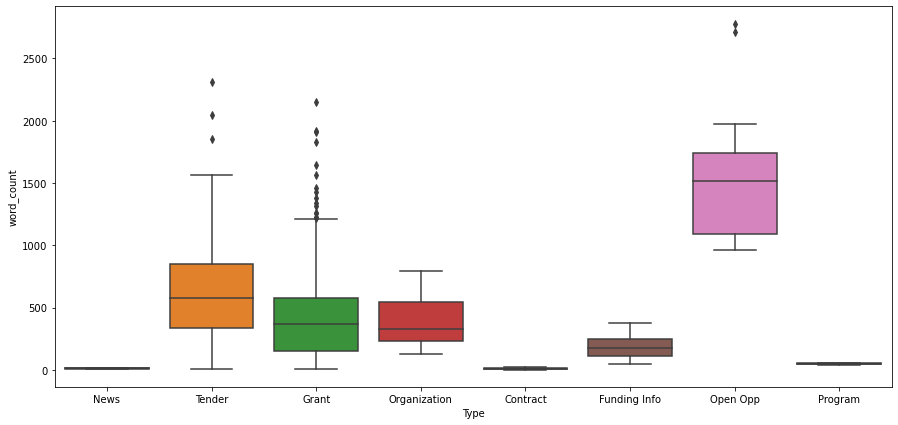

In [515]:
fig,ax = plt.subplots(figsize=(15,7))
sns.boxplot(x='Type',y='word_count',data=indi5)

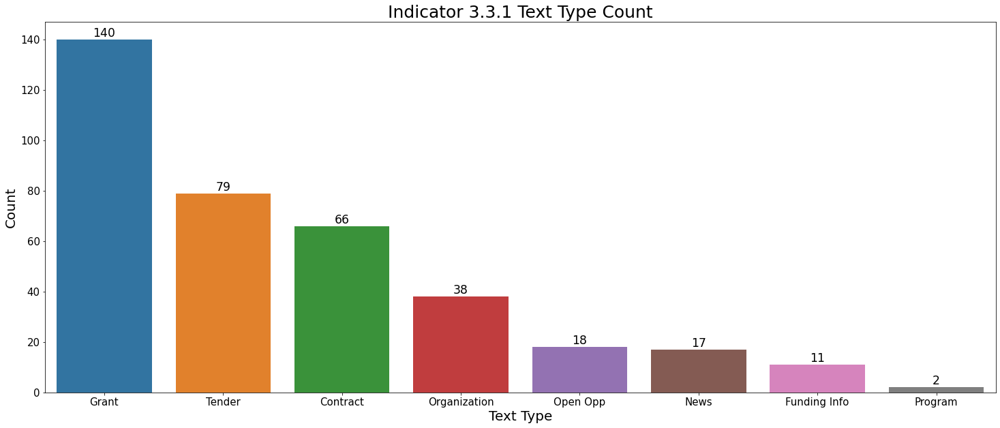

In [516]:
indi = pd.DataFrame(indi5.Type.value_counts())
indi.reset_index(inplace=True)

plt.figure(figsize=(25,10))
plt.title('Indicator 3.3.1 Text Type Count',fontsize=25)

ax = sns.barplot(data=indi,x='index',y='Type')

plt.xlabel('Text Type',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.tick_params(labelsize=15)

#adding the text labels
rects = ax.patches
labels = indi5.Type.value_counts().values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height, label, ha='center', va='bottom',fontsize='xx-large')

#### 3.3.2

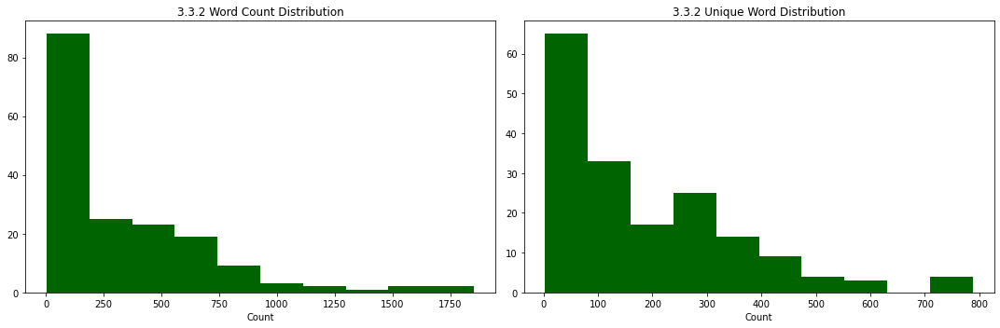

In [517]:
col = ['word_count','unique_word']
titles = ['3.3.2 Word Count Distribution','3.3.2 Unique Word Distribution']
xaxis = 'Count'

plot_hist(indi6,col,titles,xaxis,'darkgreen')

<AxesSubplot:xlabel='Type', ylabel='word_count'>

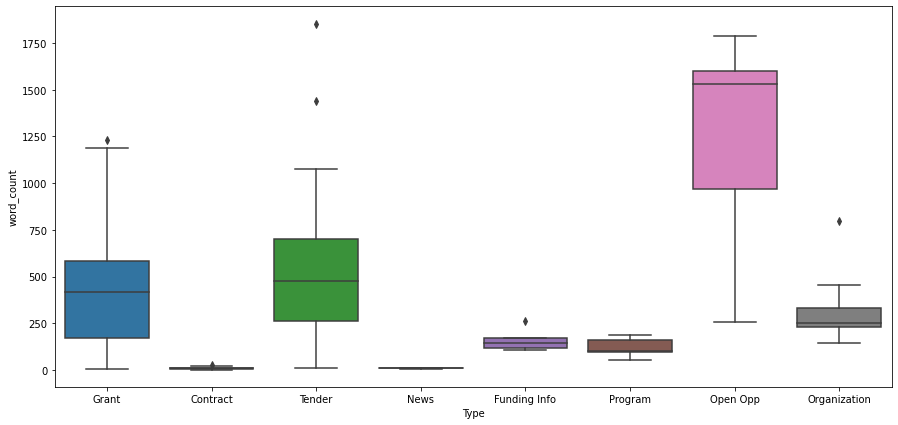

In [518]:
fig,ax = plt.subplots(figsize=(15,7))
sns.boxplot(x='Type',y='word_count',data=indi6)

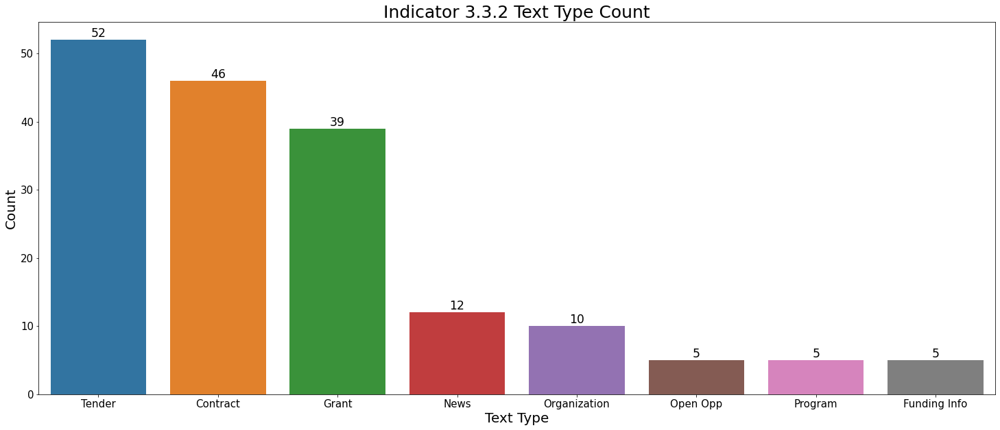

In [519]:
indi = pd.DataFrame(indi6.Type.value_counts())
indi.reset_index(inplace=True)

plt.figure(figsize=(25,10))
plt.title('Indicator 3.3.2 Text Type Count',fontsize=25)

ax = sns.barplot(data=indi,x='index',y='Type')

plt.xlabel('Text Type',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.tick_params(labelsize=15)

#adding the text labels
rects = ax.patches
labels = indi6.Type.value_counts().values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height, label, ha='center', va='bottom',fontsize='xx-large')

#### 3.3.3

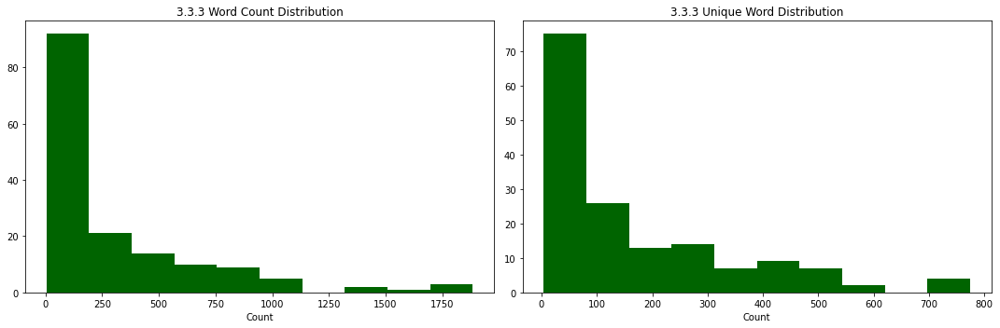

In [520]:
col = ['word_count','unique_word']
titles = ['3.3.3 Word Count Distribution','3.3.3 Unique Word Distribution']
xaxis = 'Count'

plot_hist(indi7,col,titles,xaxis,'darkgreen')

<AxesSubplot:xlabel='Type', ylabel='word_count'>

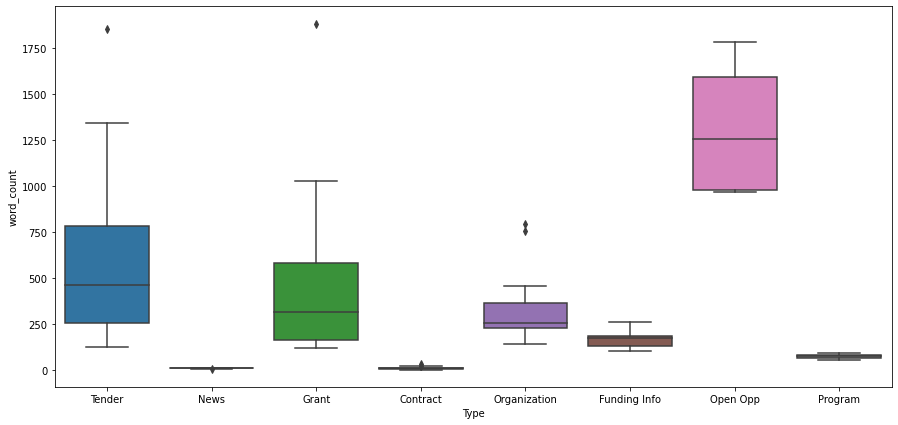

In [521]:
fig,ax = plt.subplots(figsize=(15,7))
sns.boxplot(x='Type',y='word_count',data=indi7)

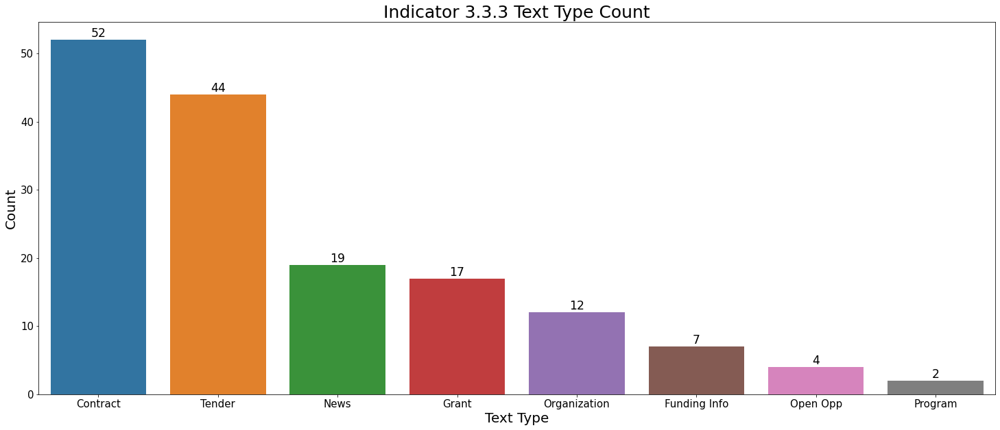

In [522]:
indi = pd.DataFrame(indi7.Type.value_counts())
indi.reset_index(inplace=True)

plt.figure(figsize=(25,10))
plt.title('Indicator 3.3.3 Text Type Count',fontsize=25)

ax = sns.barplot(data=indi,x='index',y='Type')

plt.xlabel('Text Type',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.tick_params(labelsize=15)

#adding the text labels
rects = ax.patches
labels = indi7.Type.value_counts().values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height, label, ha='center', va='bottom',fontsize='xx-large')

#### 3.3.4

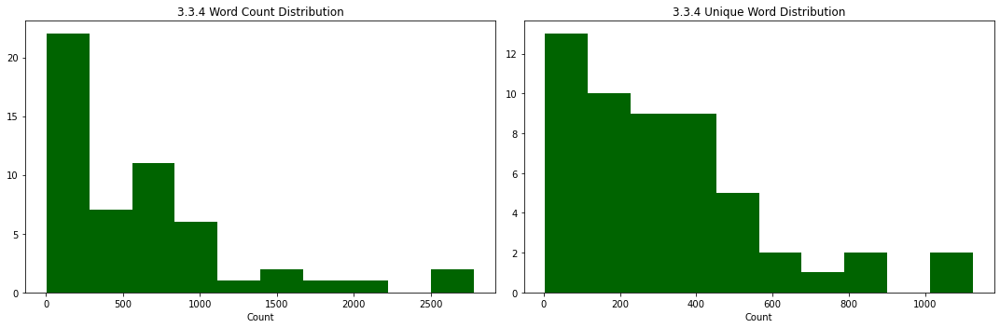

In [523]:
col = ['word_count','unique_word']
titles = ['3.3.4 Word Count Distribution','3.3.4 Unique Word Distribution']
xaxis = 'Count'

plot_hist(indi8,col,titles,xaxis,'darkgreen')

<AxesSubplot:xlabel='Type', ylabel='word_count'>

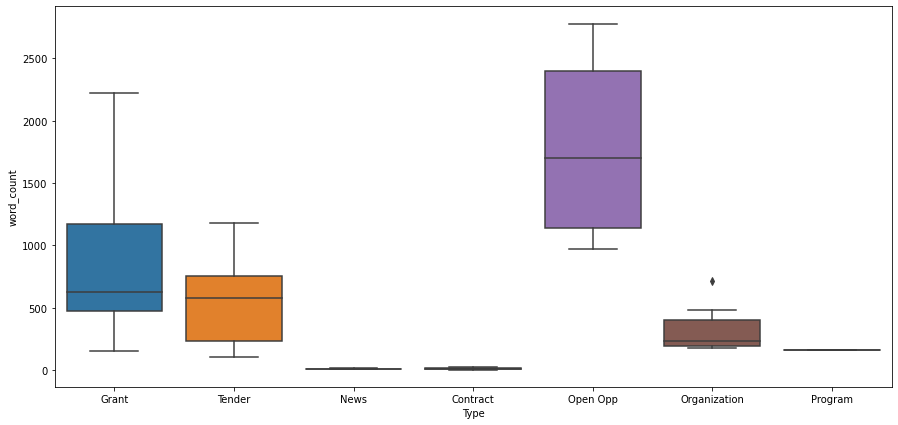

In [524]:
fig,ax = plt.subplots(figsize=(15,7))
sns.boxplot(x='Type',y='word_count',data=indi8)

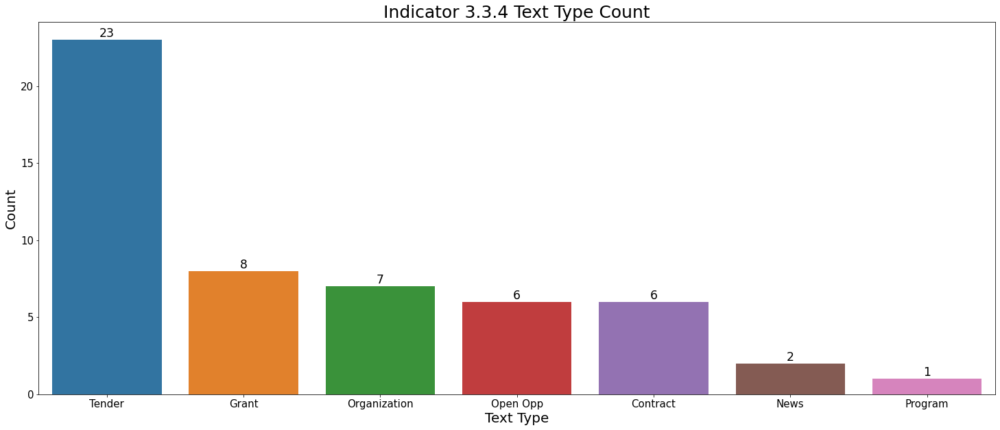

In [525]:
indi = pd.DataFrame(indi8.Type.value_counts())
indi.reset_index(inplace=True)

plt.figure(figsize=(25,10))
plt.title('Indicator 3.3.4 Text Type Count',fontsize=25)

ax = sns.barplot(data=indi,x='index',y='Type')

plt.xlabel('Text Type',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.tick_params(labelsize=15)

#adding the text labels
rects = ax.patches
labels = indi8.Type.value_counts().values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height, label, ha='center', va='bottom',fontsize='xx-large')

#### 3.3.5

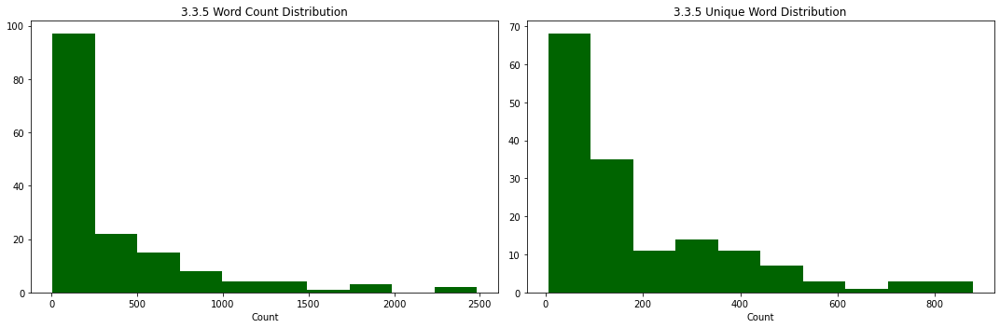

In [526]:
col = ['word_count','unique_word']
titles = ['3.3.5 Word Count Distribution','3.3.5 Unique Word Distribution']
xaxis = 'Count'

plot_hist(indi9,col,titles,xaxis,'darkgreen')

<AxesSubplot:xlabel='Type', ylabel='word_count'>

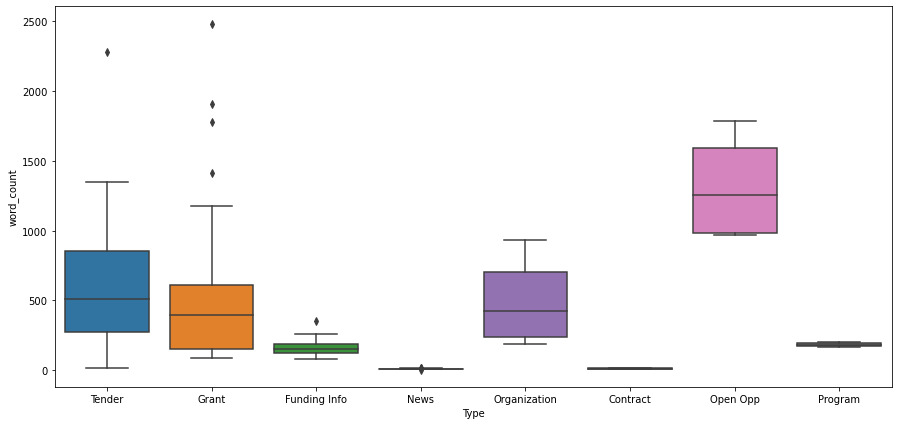

In [527]:
fig,ax = plt.subplots(figsize=(15,7))
sns.boxplot(x='Type',y='word_count',data=indi9)

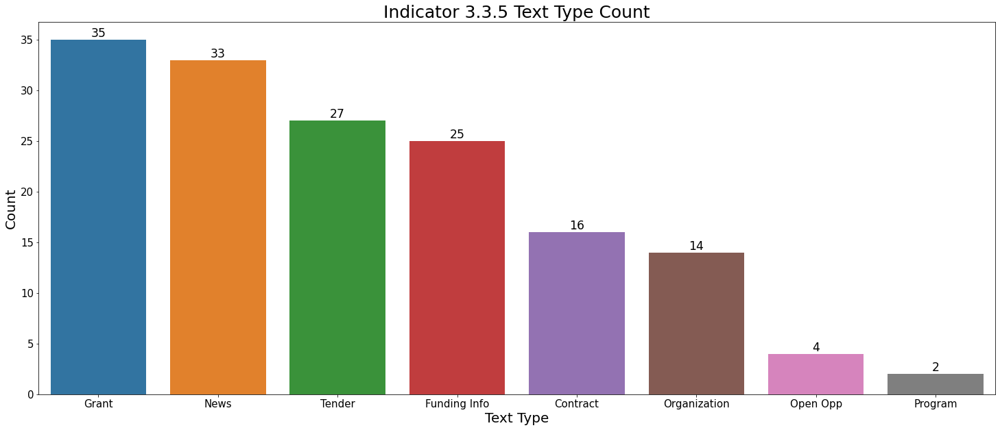

In [528]:
indi = pd.DataFrame(indi9.Type.value_counts())
indi.reset_index(inplace=True)

plt.figure(figsize=(25,10))
plt.title('Indicator 3.3.5 Text Type Count',fontsize=25)

ax = sns.barplot(data=indi,x='index',y='Type')

plt.xlabel('Text Type',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.tick_params(labelsize=15)

#adding the text labels
rects = ax.patches
labels = indi9.Type.value_counts().values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height, label, ha='center', va='bottom',fontsize='xx-large')

#### 3.4.1

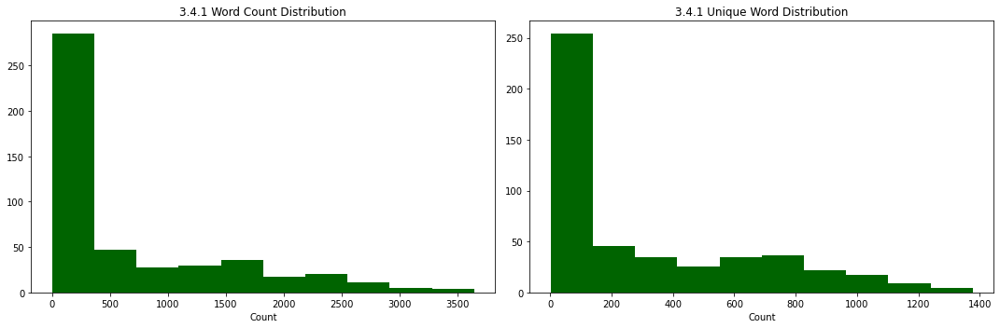

In [529]:
col = ['word_count','unique_word']
titles = ['3.4.1 Word Count Distribution','3.4.1 Unique Word Distribution']
xaxis = 'Count'

plot_hist(indi10,col,titles,xaxis,'darkgreen')

<AxesSubplot:xlabel='Type', ylabel='word_count'>

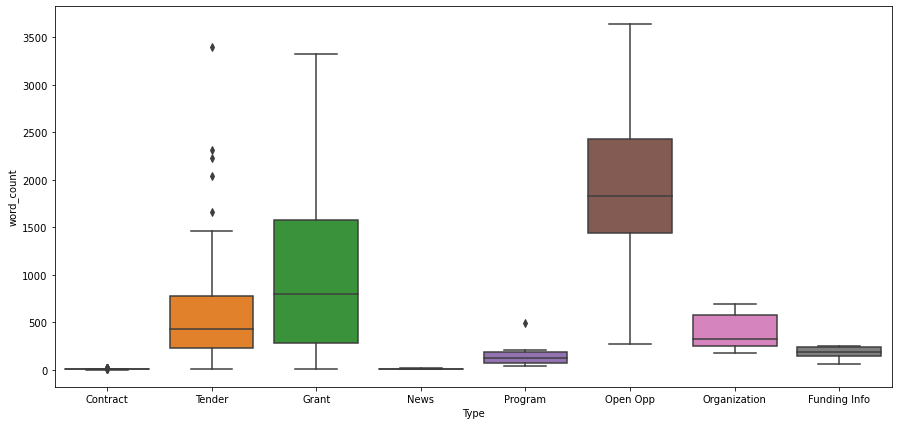

In [530]:
fig,ax = plt.subplots(figsize=(15,7))
sns.boxplot(x='Type',y='word_count',data=indi10)

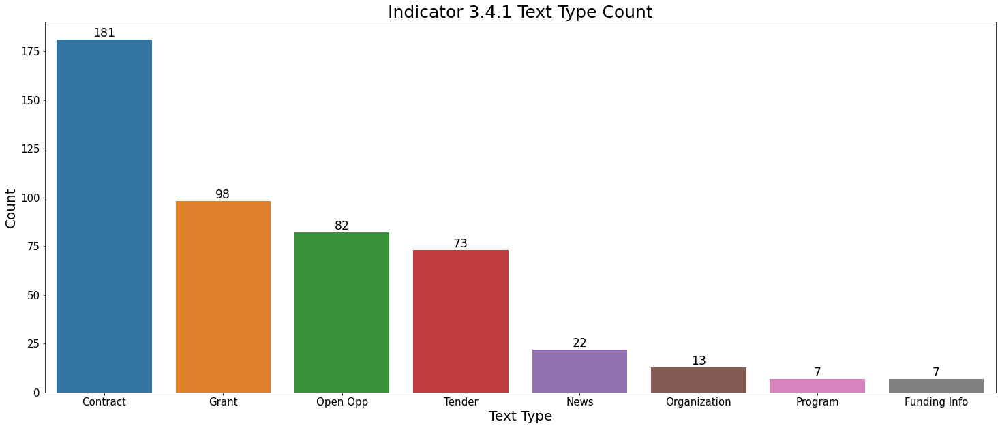

In [531]:
indi = pd.DataFrame(indi10.Type.value_counts())
indi.reset_index(inplace=True)

plt.figure(figsize=(25,10))
plt.title('Indicator 3.4.1 Text Type Count',fontsize=25)

ax = sns.barplot(data=indi,x='index',y='Type')

plt.xlabel('Text Type',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.tick_params(labelsize=15)

#adding the text labels
rects = ax.patches
labels = indi10.Type.value_counts().values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height, label, ha='center', va='bottom',fontsize='xx-large')

#### 3.4.2

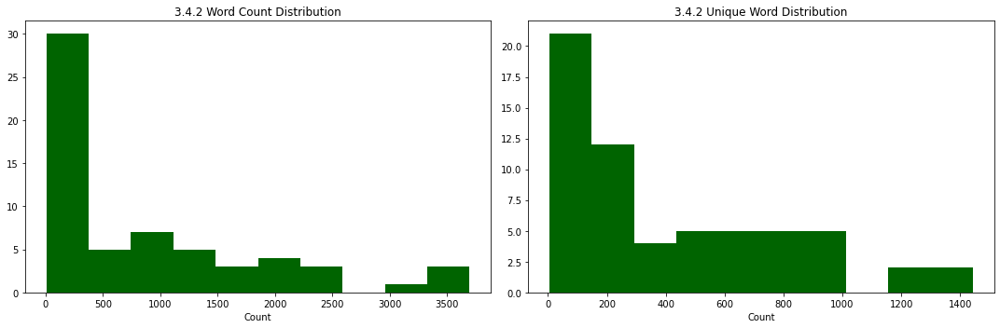

In [532]:
col = ['word_count','unique_word']
titles = ['3.4.2 Word Count Distribution','3.4.2 Unique Word Distribution']
xaxis = 'Count'

plot_hist(indi11,col,titles,xaxis,'darkgreen')

<AxesSubplot:xlabel='Type', ylabel='word_count'>

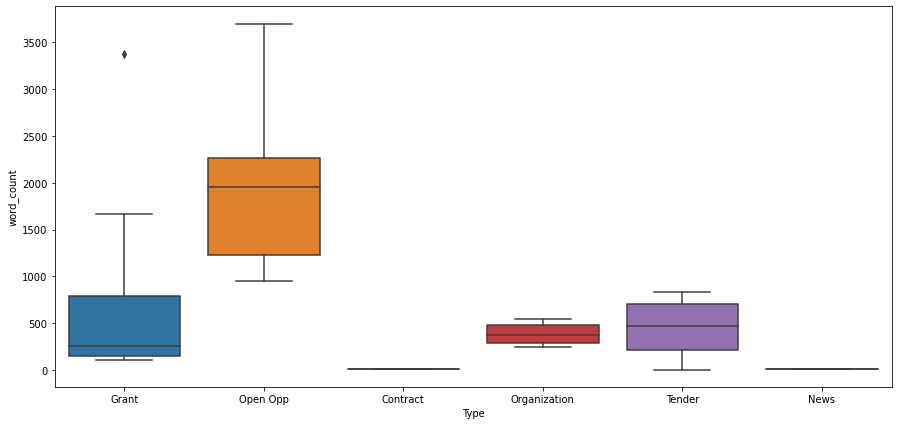

In [533]:
fig,ax = plt.subplots(figsize=(15,7))
sns.boxplot(x='Type',y='word_count',data=indi11)

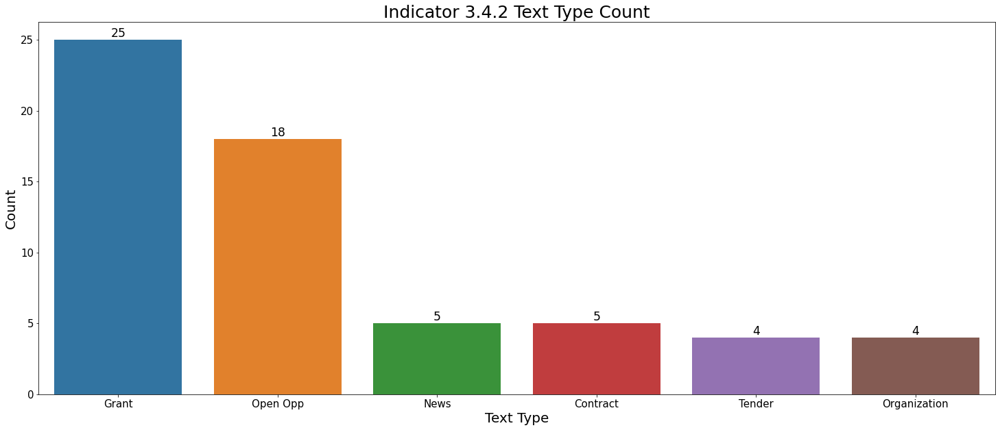

In [534]:
indi = pd.DataFrame(indi11.Type.value_counts())
indi.reset_index(inplace=True)

plt.figure(figsize=(25,10))
plt.title('Indicator 3.4.2 Text Type Count',fontsize=25)

ax = sns.barplot(data=indi,x='index',y='Type')

plt.xlabel('Text Type',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.tick_params(labelsize=15)

#adding the text labels
rects = ax.patches
labels = indi11.Type.value_counts().values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height, label, ha='center', va='bottom',fontsize='xx-large')

#### 3.5.1

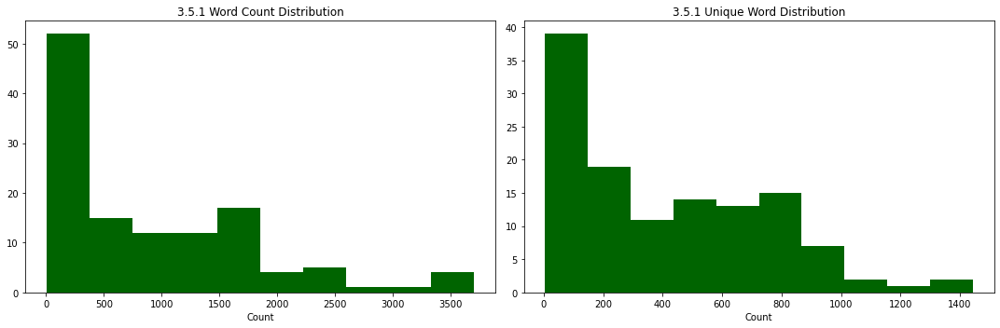

In [535]:
col = ['word_count','unique_word']
titles = ['3.5.1 Word Count Distribution','3.5.1 Unique Word Distribution']
xaxis = 'Count'

plot_hist(indi12,col,titles,xaxis,'darkgreen')

<AxesSubplot:xlabel='Type', ylabel='word_count'>

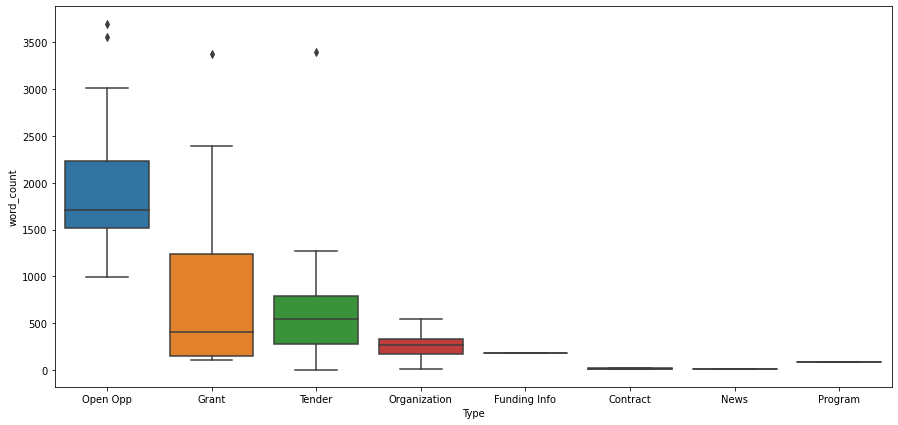

In [536]:
fig,ax = plt.subplots(figsize=(15,7))
sns.boxplot(x='Type',y='word_count',data=indi12)

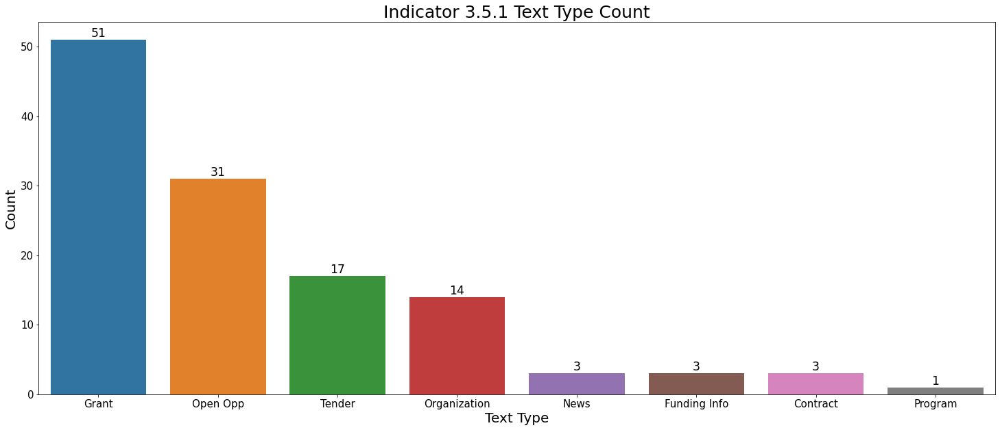

In [537]:
indi = pd.DataFrame(indi12.Type.value_counts())
indi.reset_index(inplace=True)

plt.figure(figsize=(25,10))
plt.title('Indicator 3.5.1 Text Type Count',fontsize=25)

ax = sns.barplot(data=indi,x='index',y='Type')

plt.xlabel('Text Type',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.tick_params(labelsize=15)

#adding the text labels
rects = ax.patches
labels = indi12.Type.value_counts().values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height, label, ha='center', va='bottom',fontsize='xx-large')

#### 3.5.2

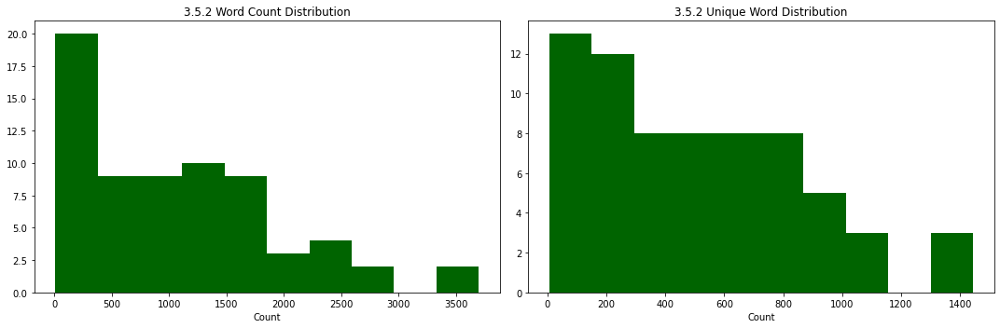

In [538]:
col = ['word_count','unique_word']
titles = ['3.5.2 Word Count Distribution','3.5.2 Unique Word Distribution']
xaxis = 'Count'

plot_hist(indi13,col,titles,xaxis,'darkgreen')

<AxesSubplot:xlabel='Type', ylabel='word_count'>

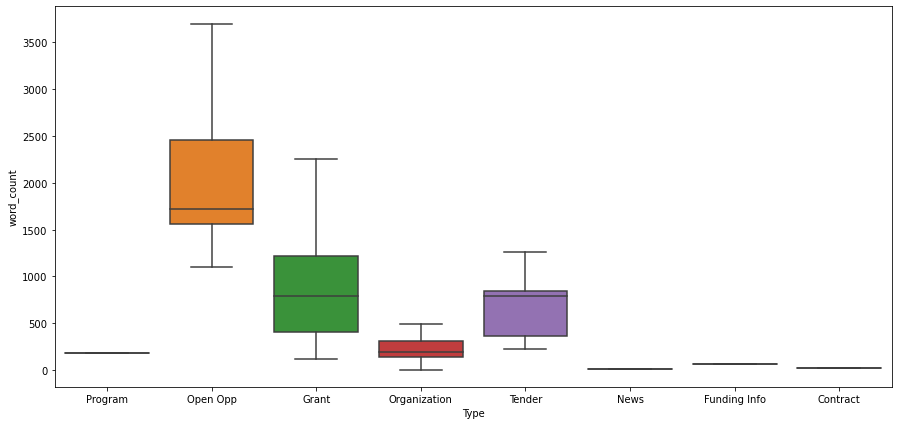

In [539]:
fig,ax = plt.subplots(figsize=(15,7))
sns.boxplot(x='Type',y='word_count',data=indi13)

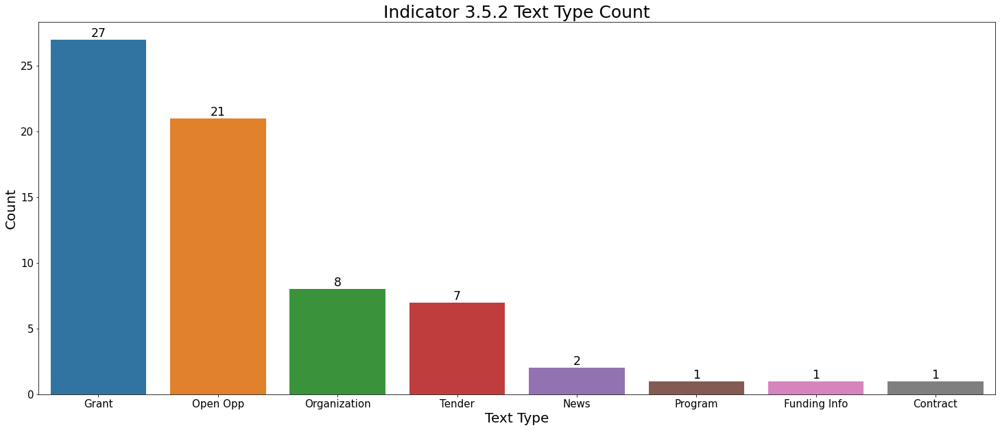

In [540]:
indi = pd.DataFrame(indi13.Type.value_counts())
indi.reset_index(inplace=True)

plt.figure(figsize=(25,10))
plt.title('Indicator 3.5.2 Text Type Count',fontsize=25)

ax = sns.barplot(data=indi,x='index',y='Type')

plt.xlabel('Text Type',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.tick_params(labelsize=15)

#adding the text labels
rects = ax.patches
labels = indi13.Type.value_counts().values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height, label, ha='center', va='bottom',fontsize='xx-large')

#### 3.6.1

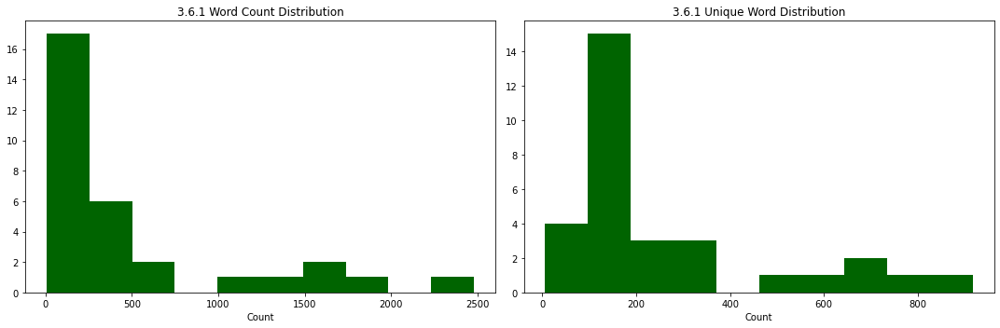

In [541]:
col = ['word_count','unique_word']
titles = ['3.6.1 Word Count Distribution','3.6.1 Unique Word Distribution']
xaxis = 'Count'

plot_hist(indi14,col,titles,xaxis,'darkgreen')

<AxesSubplot:xlabel='Type', ylabel='word_count'>

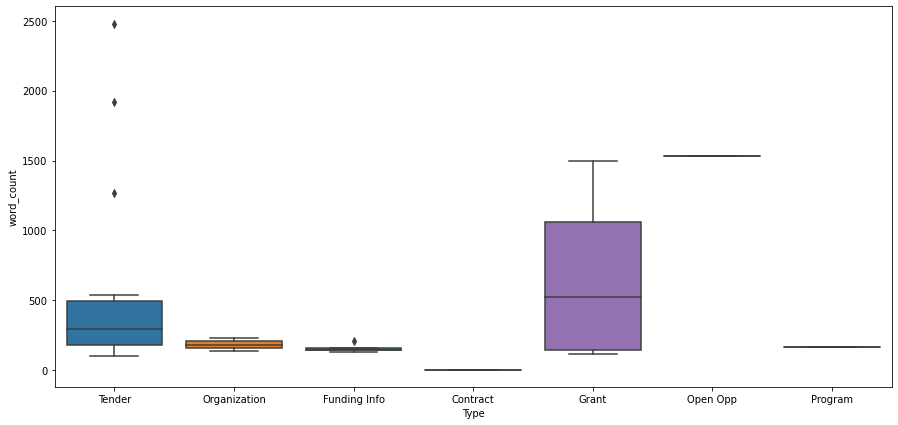

In [542]:
fig,ax = plt.subplots(figsize=(15,7))
sns.boxplot(x='Type',y='word_count',data=indi14)

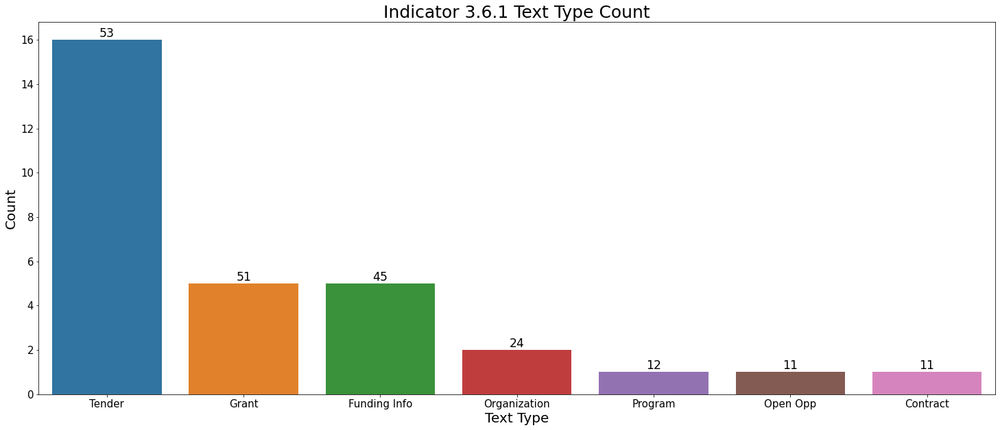

In [543]:
indi = pd.DataFrame(indi14.Type.value_counts())
indi.reset_index(inplace=True)

plt.figure(figsize=(25,10))
plt.title('Indicator 3.6.1 Text Type Count',fontsize=25)

ax = sns.barplot(data=indi,x='index',y='Type')

plt.xlabel('Text Type',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.tick_params(labelsize=15)

#adding the text labels
rects = ax.patches
labels = indi1.Type.value_counts().values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height, label, ha='center', va='bottom',fontsize='xx-large')

#### 3.7.1

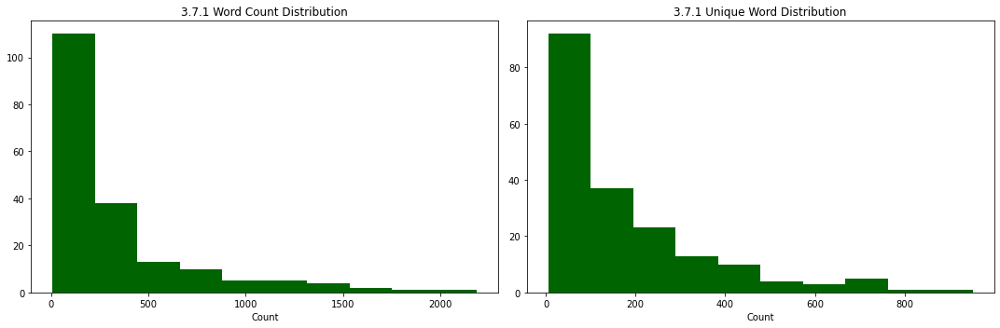

In [544]:
col = ['word_count','unique_word']
titles = ['3.7.1 Word Count Distribution','3.7.1 Unique Word Distribution']
xaxis = 'Count'

plot_hist(indi15,col,titles,xaxis,'darkgreen')

<AxesSubplot:xlabel='Type', ylabel='word_count'>

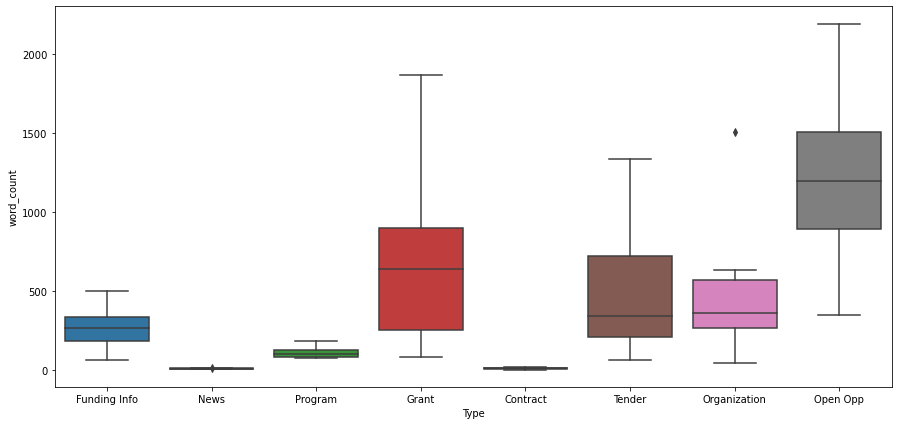

In [545]:
fig,ax = plt.subplots(figsize=(15,7))
sns.boxplot(x='Type',y='word_count',data=indi15)

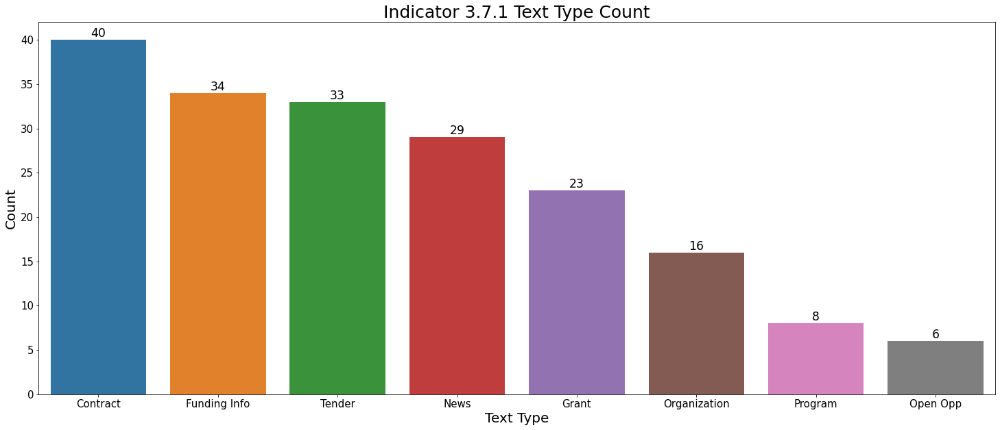

In [546]:
indi = pd.DataFrame(indi15.Type.value_counts())
indi.reset_index(inplace=True)

plt.figure(figsize=(25,10))
plt.title('Indicator 3.7.1 Text Type Count',fontsize=25)

ax = sns.barplot(data=indi,x='index',y='Type')

plt.xlabel('Text Type',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.tick_params(labelsize=15)

#adding the text labels
rects = ax.patches
labels = indi15.Type.value_counts().values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height, label, ha='center', va='bottom',fontsize='xx-large')

#### 3.7.2

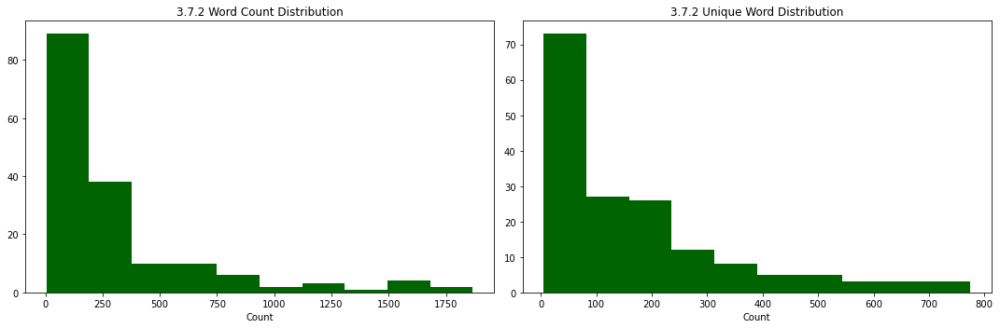

In [547]:
col = ['word_count','unique_word']
titles = ['3.7.2 Word Count Distribution','3.7.2 Unique Word Distribution']
xaxis = 'Count'

plot_hist(indi16,col,titles,xaxis,'darkgreen')

<AxesSubplot:xlabel='Type', ylabel='word_count'>

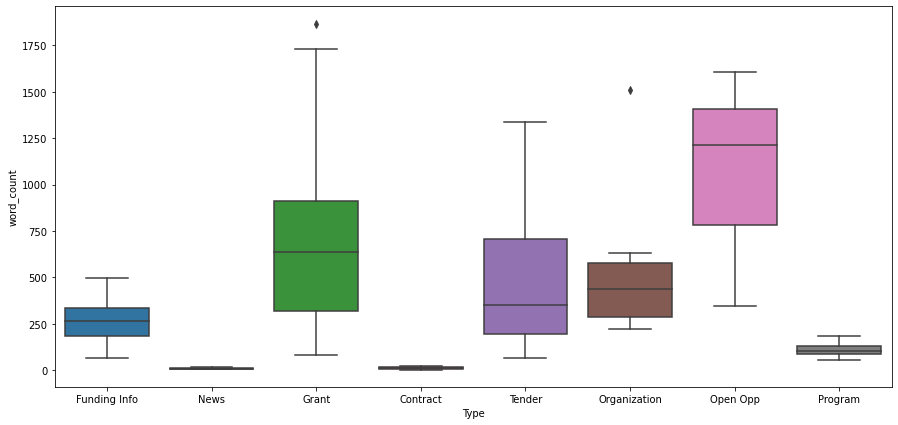

In [548]:
fig,ax = plt.subplots(figsize=(15,7))
sns.boxplot(x='Type',y='word_count',data=indi16)

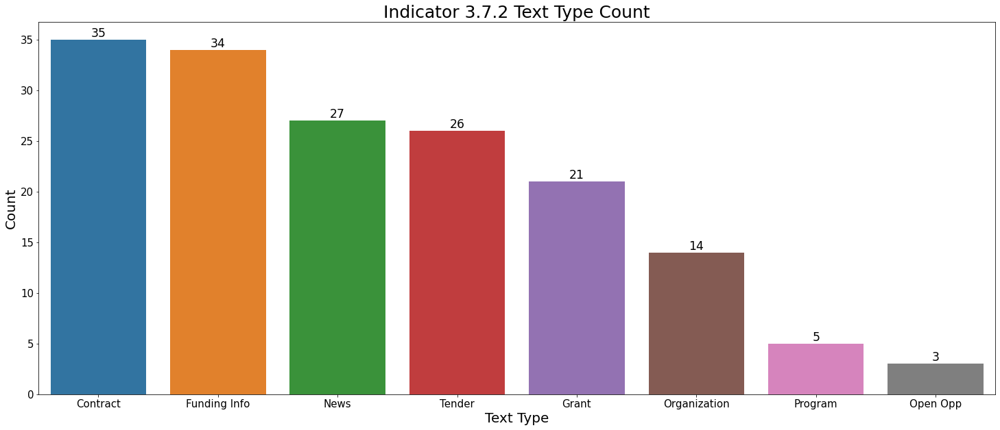

In [549]:
indi = pd.DataFrame(indi16.Type.value_counts())
indi.reset_index(inplace=True)

plt.figure(figsize=(25,10))
plt.title('Indicator 3.7.2 Text Type Count',fontsize=25)

ax = sns.barplot(data=indi,x='index',y='Type')

plt.xlabel('Text Type',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.tick_params(labelsize=15)

#adding the text labels
rects = ax.patches
labels = indi16.Type.value_counts().values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height, label, ha='center', va='bottom',fontsize='xx-large')

#### 3.8.1

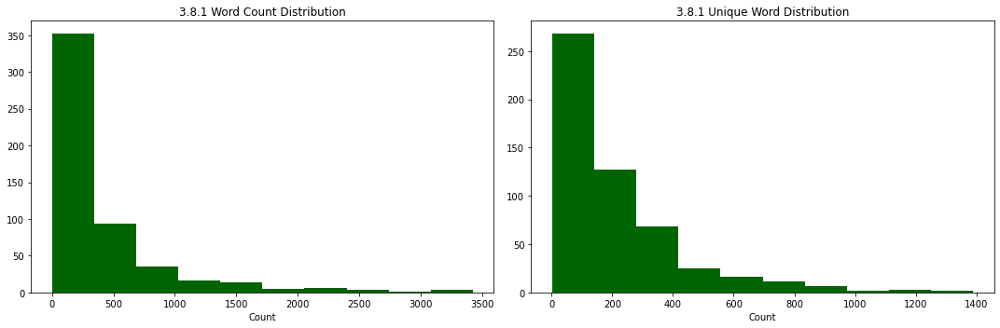

In [550]:
col = ['word_count','unique_word']
titles = ['3.8.1 Word Count Distribution','3.8.1 Unique Word Distribution']
xaxis = 'Count'

plot_hist(indi17,col,titles,xaxis,'darkgreen')

<AxesSubplot:xlabel='Type', ylabel='word_count'>

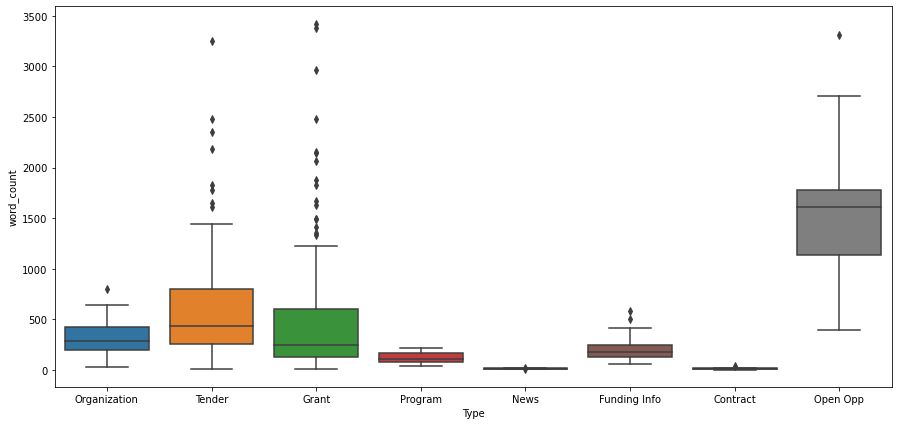

In [551]:
fig,ax = plt.subplots(figsize=(15,7))
sns.boxplot(x='Type',y='word_count',data=indi17)

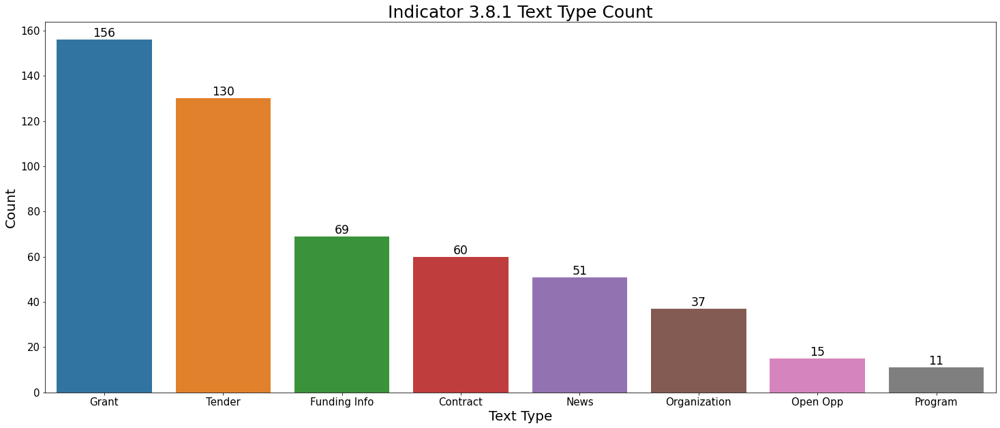

In [552]:
indi = pd.DataFrame(indi17.Type.value_counts())
indi.reset_index(inplace=True)

plt.figure(figsize=(25,10))
plt.title('Indicator 3.8.1 Text Type Count',fontsize=25)

ax = sns.barplot(data=indi,x='index',y='Type')

plt.xlabel('Text Type',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.tick_params(labelsize=15)

#adding the text labels
rects = ax.patches
labels = indi17.Type.value_counts().values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height, label, ha='center', va='bottom',fontsize='xx-large')

#### 3.8.2

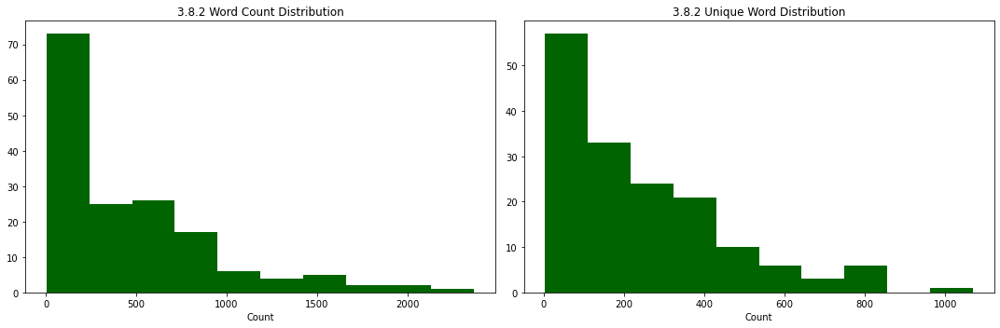

In [553]:
col = ['word_count','unique_word']
titles = ['3.8.2 Word Count Distribution','3.8.2 Unique Word Distribution']
xaxis = 'Count'

plot_hist(indi18,col,titles,xaxis,'darkgreen')

<AxesSubplot:xlabel='Type', ylabel='word_count'>

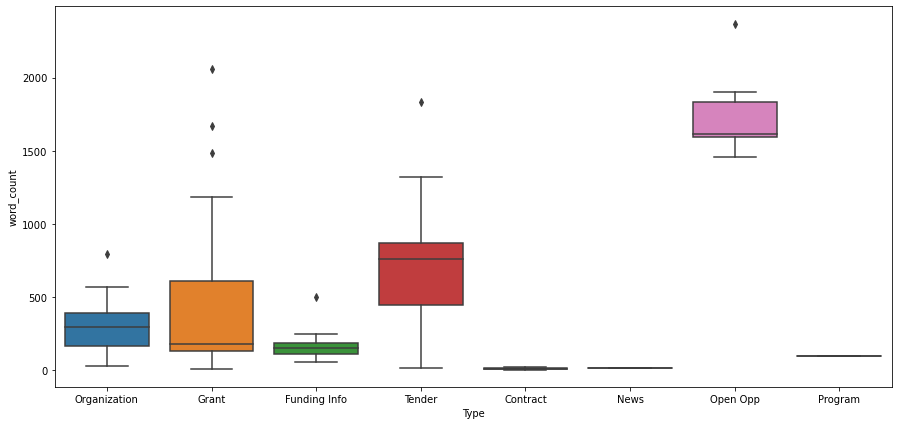

In [554]:
fig,ax = plt.subplots(figsize=(15,7))
sns.boxplot(x='Type',y='word_count',data=indi18)

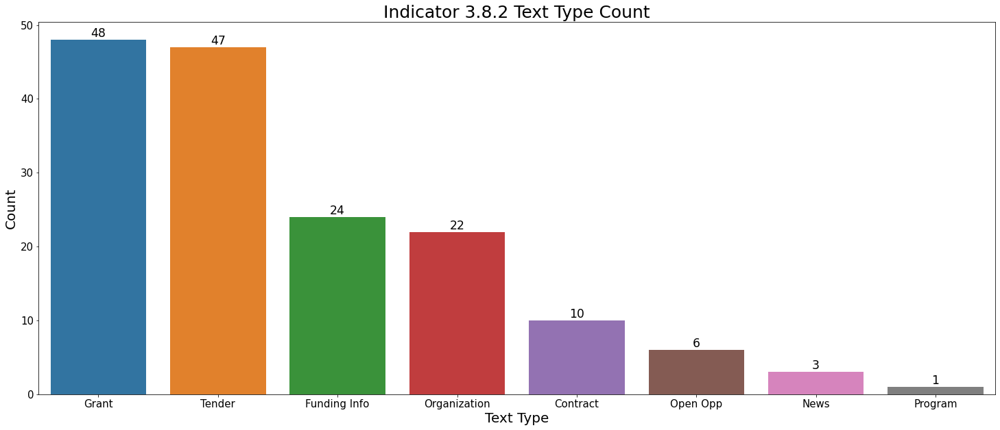

In [555]:
indi = pd.DataFrame(indi18.Type.value_counts())
indi.reset_index(inplace=True)

plt.figure(figsize=(25,10))
plt.title('Indicator 3.8.2 Text Type Count',fontsize=25)

ax = sns.barplot(data=indi,x='index',y='Type')

plt.xlabel('Text Type',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.tick_params(labelsize=15)

#adding the text labels
rects = ax.patches
labels = indi18.Type.value_counts().values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height, label, ha='center', va='bottom',fontsize='xx-large')

#### 3.9.1

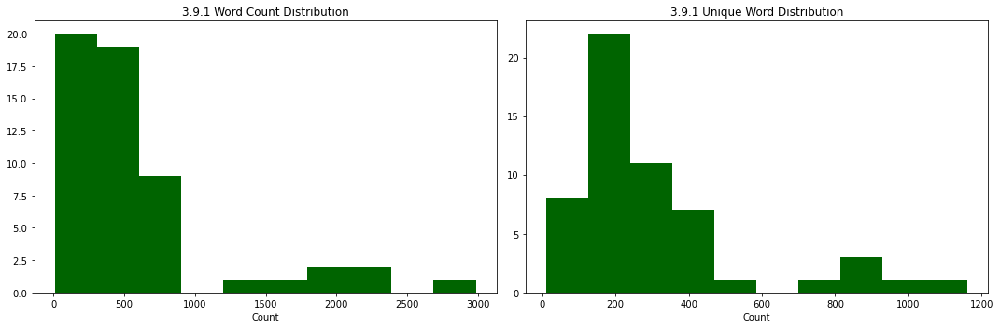

In [556]:
col = ['word_count','unique_word']
titles = ['3.9.1 Word Count Distribution','3.9.1 Unique Word Distribution']
xaxis = 'Count'

plot_hist(indi19,col,titles,xaxis,'darkgreen')

<AxesSubplot:xlabel='Type', ylabel='word_count'>

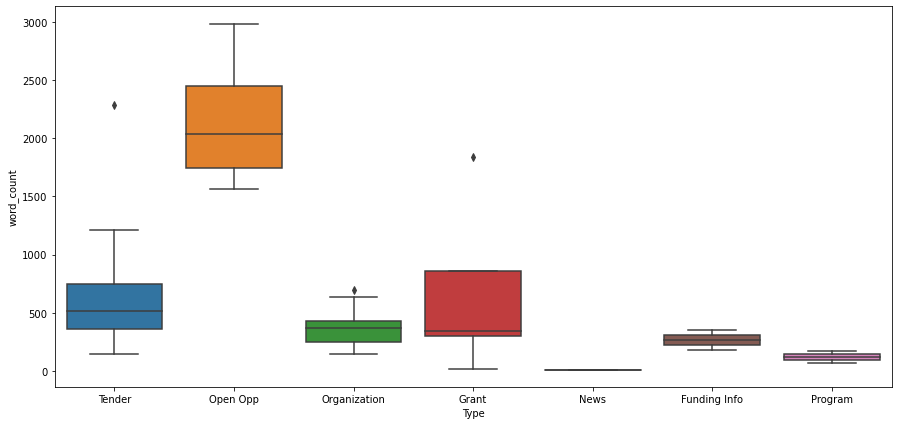

In [557]:
fig,ax = plt.subplots(figsize=(15,7))
sns.boxplot(x='Type',y='word_count',data=indi19)

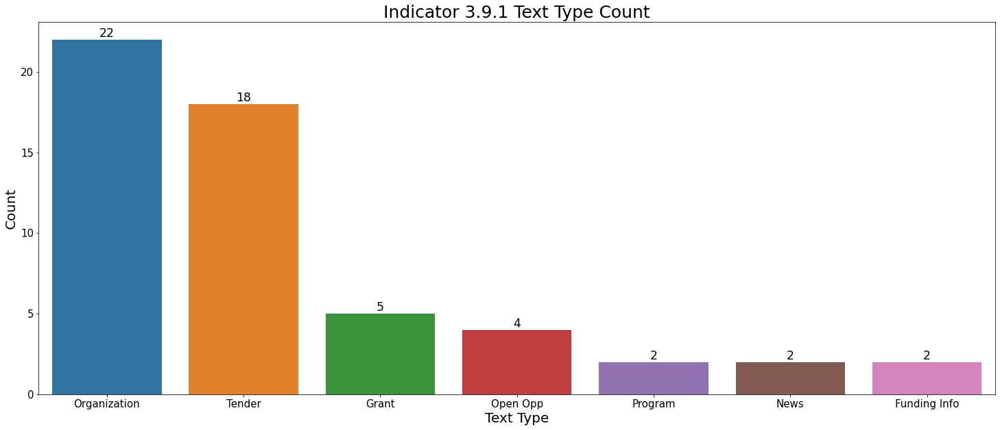

In [558]:
indi = pd.DataFrame(indi19.Type.value_counts())
indi.reset_index(inplace=True)

plt.figure(figsize=(25,10))
plt.title('Indicator 3.9.1 Text Type Count',fontsize=25)

ax = sns.barplot(data=indi,x='index',y='Type')

plt.xlabel('Text Type',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.tick_params(labelsize=15)

#adding the text labels
rects = ax.patches
labels = indi19.Type.value_counts().values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height, label, ha='center', va='bottom',fontsize='xx-large')

#### 3.9.2

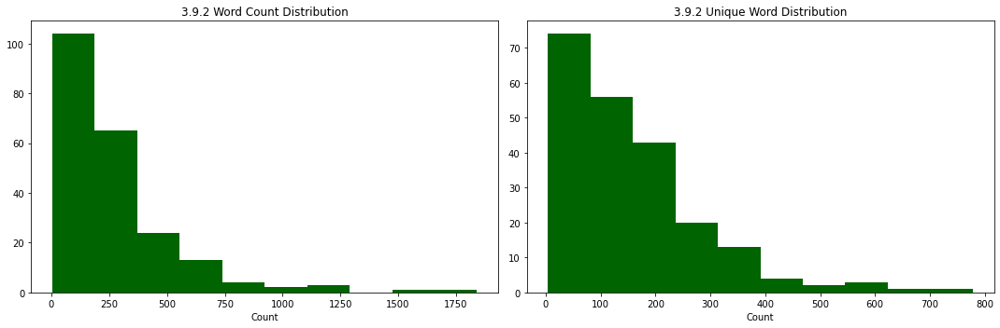

In [559]:
col = ['word_count','unique_word']
titles = ['3.9.2 Word Count Distribution','3.9.2 Unique Word Distribution']
xaxis = 'Count'

plot_hist(indi20,col,titles,xaxis,'darkgreen')

<AxesSubplot:xlabel='Type', ylabel='word_count'>

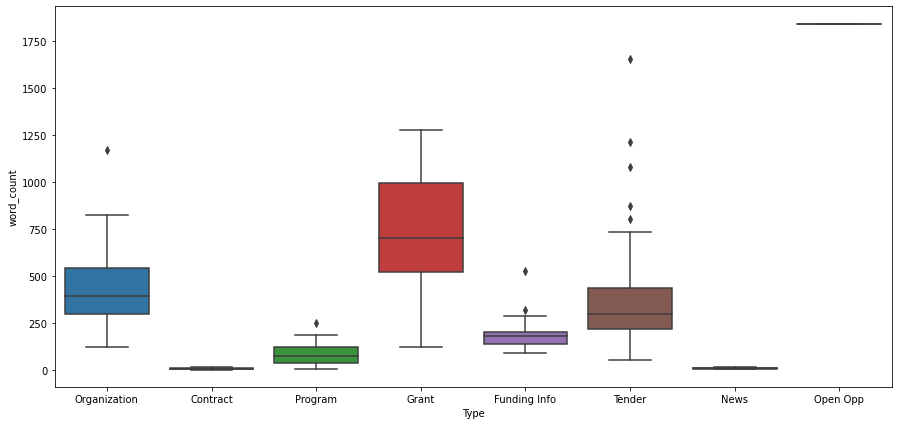

In [560]:
fig,ax = plt.subplots(figsize=(15,7))
sns.boxplot(x='Type',y='word_count',data=indi20)

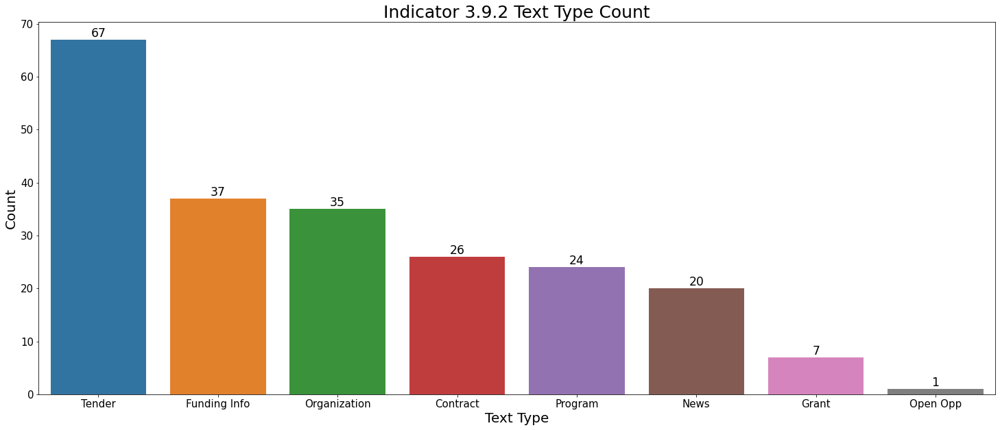

In [561]:
indi = pd.DataFrame(indi20.Type.value_counts())
indi.reset_index(inplace=True)

plt.figure(figsize=(25,10))
plt.title('Indicator 3.9.2 Text Type Count',fontsize=25)

ax = sns.barplot(data=indi,x='index',y='Type')

plt.xlabel('Text Type',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.tick_params(labelsize=15)

#adding the text labels
rects = ax.patches
labels = indi20.Type.value_counts().values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height, label, ha='center', va='bottom',fontsize='xx-large')

#### 3.9.3

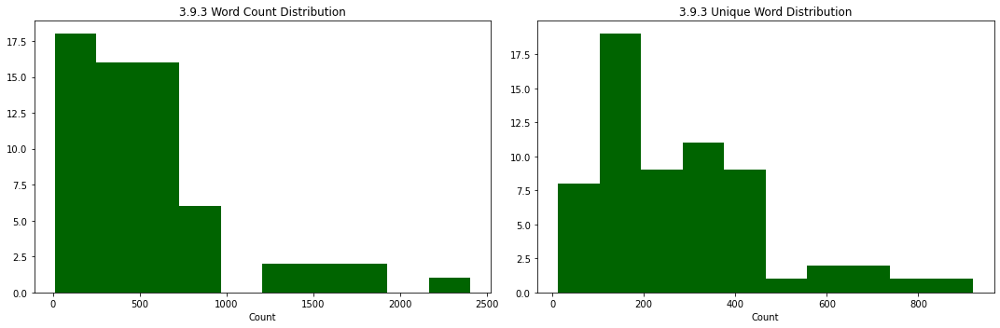

In [562]:
col = ['word_count','unique_word']
titles = ['3.9.3 Word Count Distribution','3.9.3 Unique Word Distribution']
xaxis = 'Count'

plot_hist(indi21,col,titles,xaxis,'darkgreen')

<AxesSubplot:xlabel='Type', ylabel='word_count'>

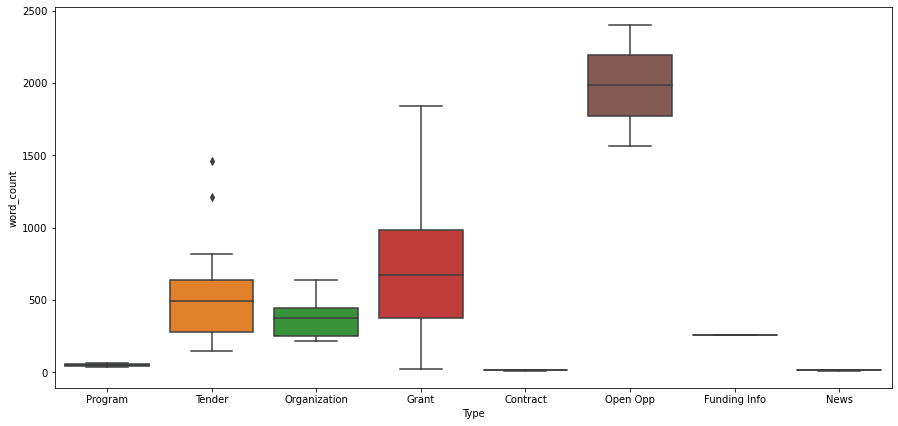

In [563]:
fig,ax = plt.subplots(figsize=(15,7))
sns.boxplot(x='Type',y='word_count',data=indi21)

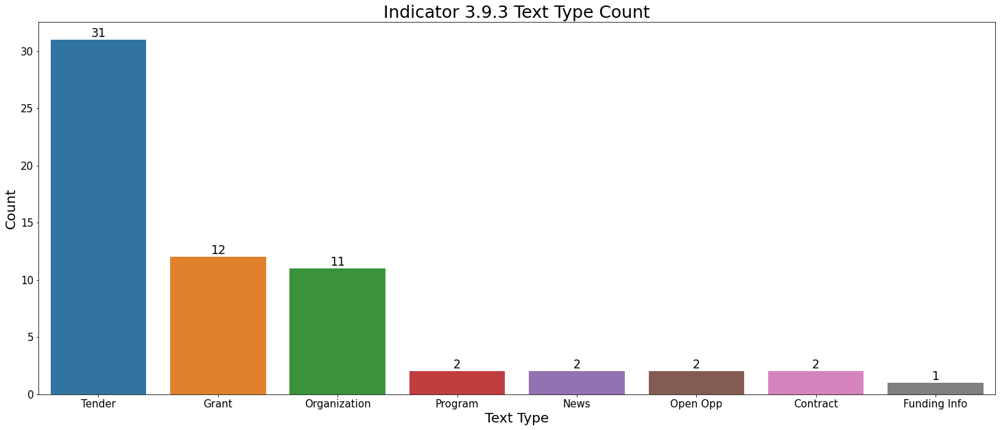

In [564]:
indi = pd.DataFrame(indi21.Type.value_counts())
indi.reset_index(inplace=True)

plt.figure(figsize=(25,10))
plt.title('Indicator 3.9.3 Text Type Count',fontsize=25)

ax = sns.barplot(data=indi,x='index',y='Type')

plt.xlabel('Text Type',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.tick_params(labelsize=15)

#adding the text labels
rects = ax.patches
labels = indi21.Type.value_counts().values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height, label, ha='center', va='bottom',fontsize='xx-large')

#### 3.a.1

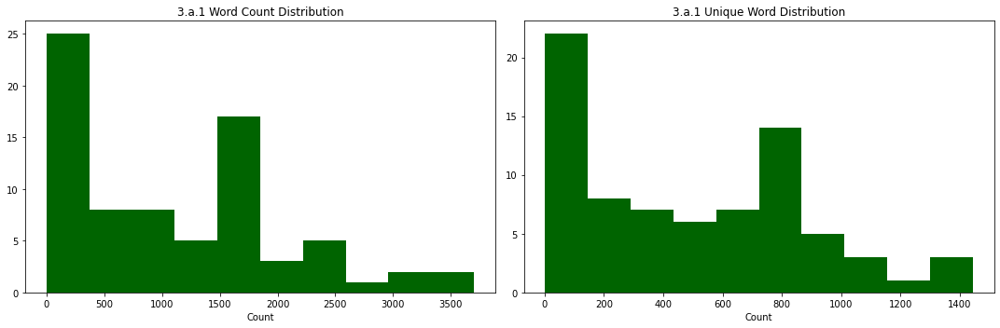

In [565]:
col = ['word_count','unique_word']
titles = ['3.a.1 Word Count Distribution','3.a.1 Unique Word Distribution']
xaxis = 'Count'

plot_hist(indi22,col,titles,xaxis,'darkgreen')

<AxesSubplot:xlabel='Type', ylabel='word_count'>

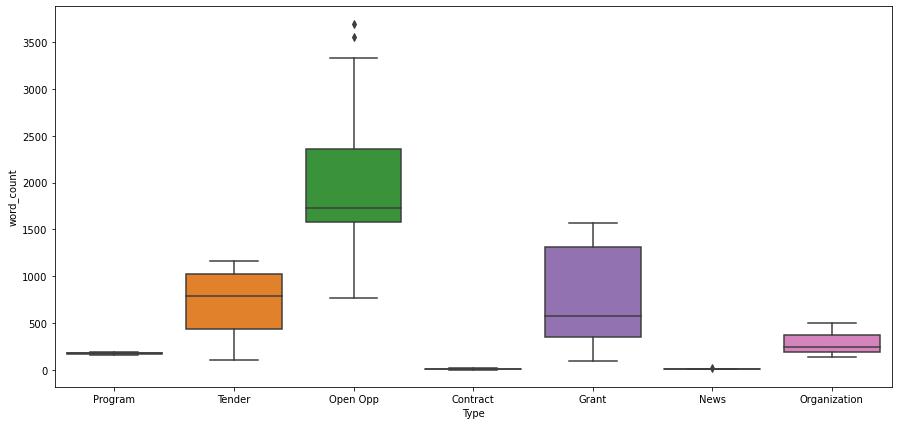

In [566]:
fig,ax = plt.subplots(figsize=(15,7))
sns.boxplot(x='Type',y='word_count',data=indi22)

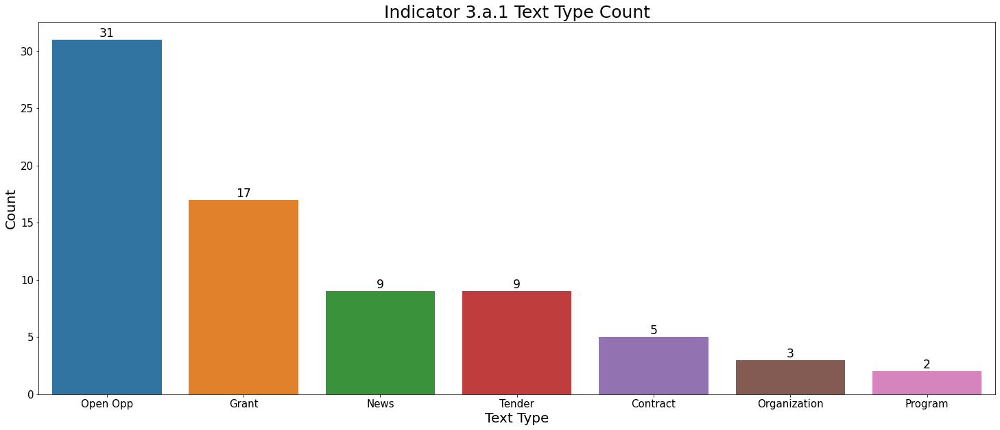

In [567]:
indi = pd.DataFrame(indi22.Type.value_counts())
indi.reset_index(inplace=True)

plt.figure(figsize=(25,10))
plt.title('Indicator 3.a.1 Text Type Count',fontsize=25)

ax = sns.barplot(data=indi,x='index',y='Type')

plt.xlabel('Text Type',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.tick_params(labelsize=15)

#adding the text labels
rects = ax.patches
labels = indi22.Type.value_counts().values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height, label, ha='center', va='bottom',fontsize='xx-large')

#### 3.b.1

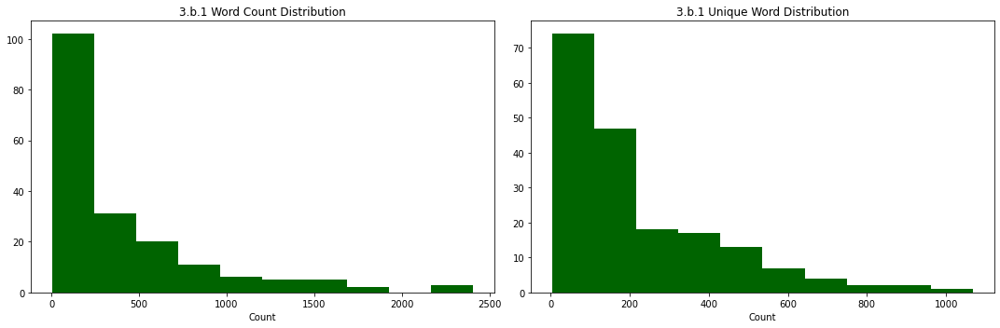

In [568]:
col = ['word_count','unique_word']
titles = ['3.b.1 Word Count Distribution','3.b.1 Unique Word Distribution']
xaxis = 'Count'

plot_hist(indi23,col,titles,xaxis,'darkgreen')

<AxesSubplot:xlabel='Type', ylabel='word_count'>

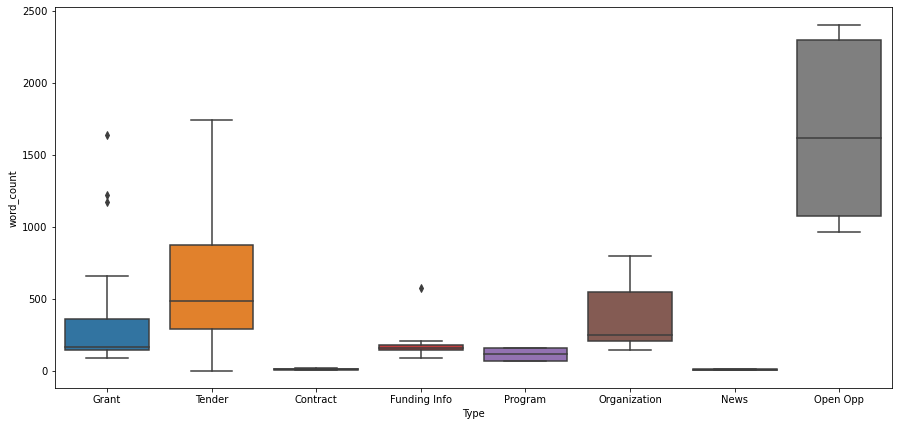

In [569]:
fig,ax = plt.subplots(figsize=(15,7))
sns.boxplot(x='Type',y='word_count',data=indi23)

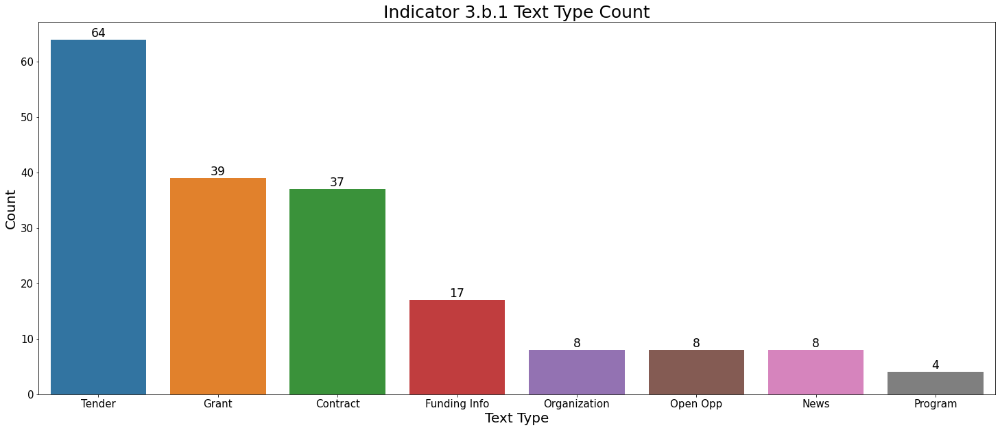

In [570]:
indi = pd.DataFrame(indi23.Type.value_counts())
indi.reset_index(inplace=True)

plt.figure(figsize=(25,10))
plt.title('Indicator 3.b.1 Text Type Count',fontsize=25)

ax = sns.barplot(data=indi,x='index',y='Type')

plt.xlabel('Text Type',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.tick_params(labelsize=15)

#adding the text labels
rects = ax.patches
labels = indi23.Type.value_counts().values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height, label, ha='center', va='bottom',fontsize='xx-large')

#### 3.b.2

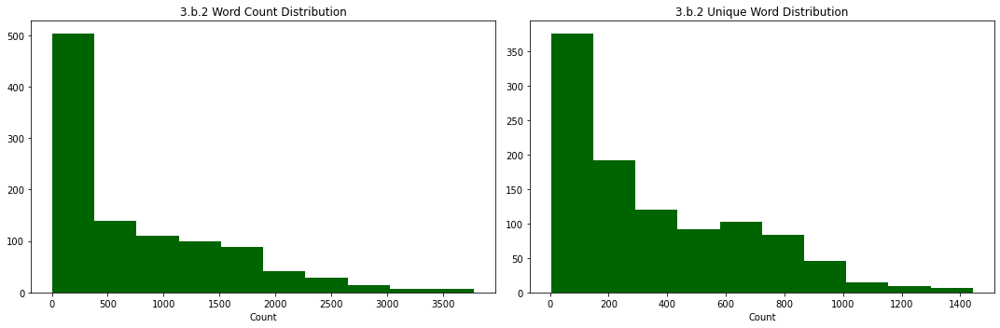

In [571]:
col = ['word_count','unique_word']
titles = ['3.b.2 Word Count Distribution','3.b.2 Unique Word Distribution']
xaxis = 'Count'

plot_hist(indi24,col,titles,xaxis,'darkgreen')

<AxesSubplot:xlabel='Type', ylabel='word_count'>

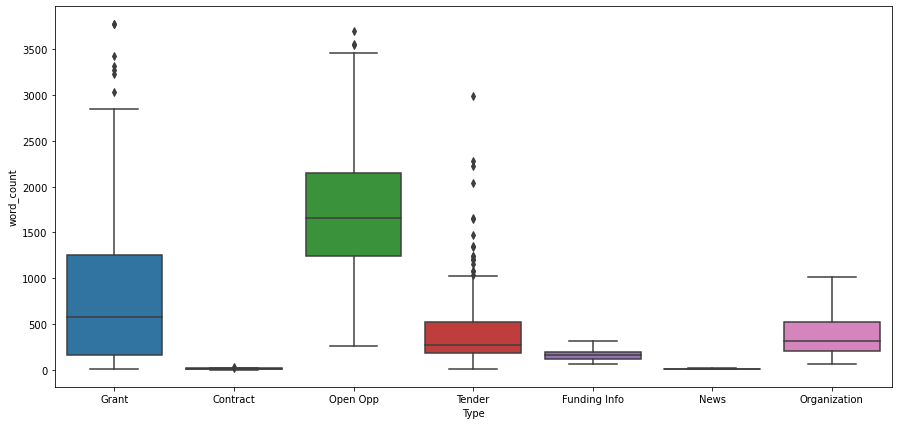

In [572]:
fig,ax = plt.subplots(figsize=(15,7))
sns.boxplot(x='Type',y='word_count',data=indi24)

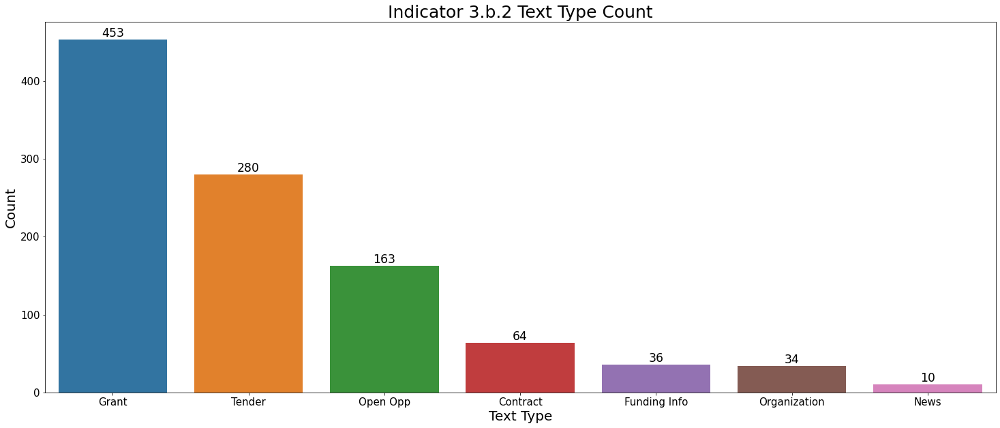

In [573]:
indi = pd.DataFrame(indi24.Type.value_counts())
indi.reset_index(inplace=True)

plt.figure(figsize=(25,10))
plt.title('Indicator 3.b.2 Text Type Count',fontsize=25)

ax = sns.barplot(data=indi,x='index',y='Type')

plt.xlabel('Text Type',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.tick_params(labelsize=15)

#adding the text labels
rects = ax.patches
labels = indi24.Type.value_counts().values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height, label, ha='center', va='bottom',fontsize='xx-large')

#### 3.b.3

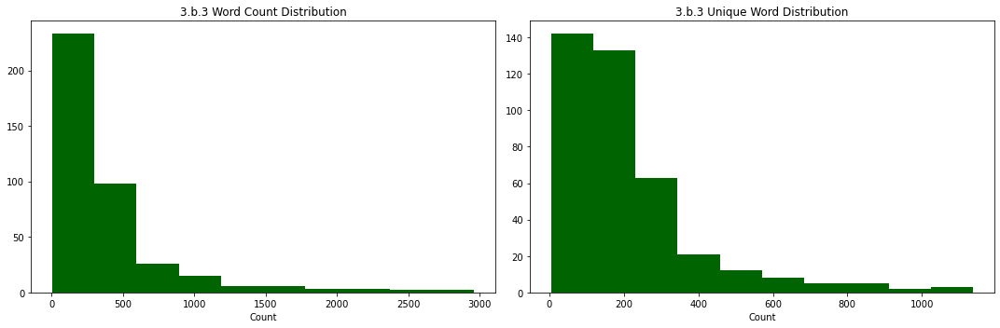

In [574]:
col = ['word_count','unique_word']
titles = ['3.b.3 Word Count Distribution','3.b.3 Unique Word Distribution']
xaxis = 'Count'

plot_hist(indi25,col,titles,xaxis,'darkgreen')

<AxesSubplot:xlabel='Type', ylabel='word_count'>

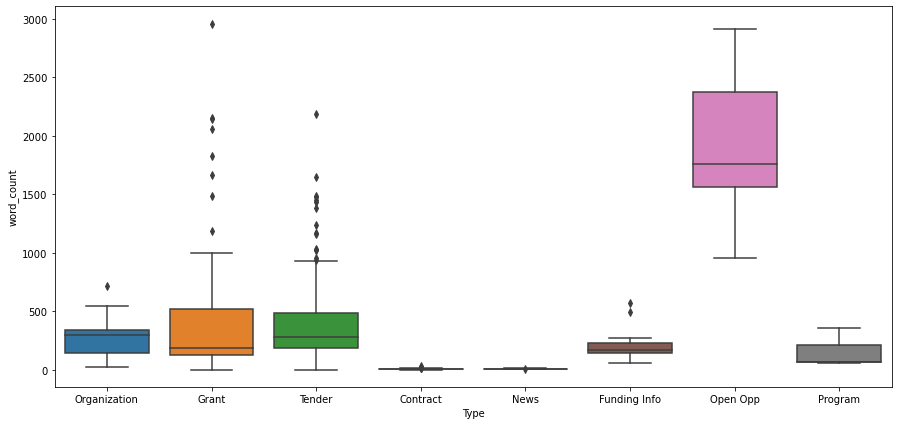

In [575]:
fig,ax = plt.subplots(figsize=(15,7))
sns.boxplot(x='Type',y='word_count',data=indi25)

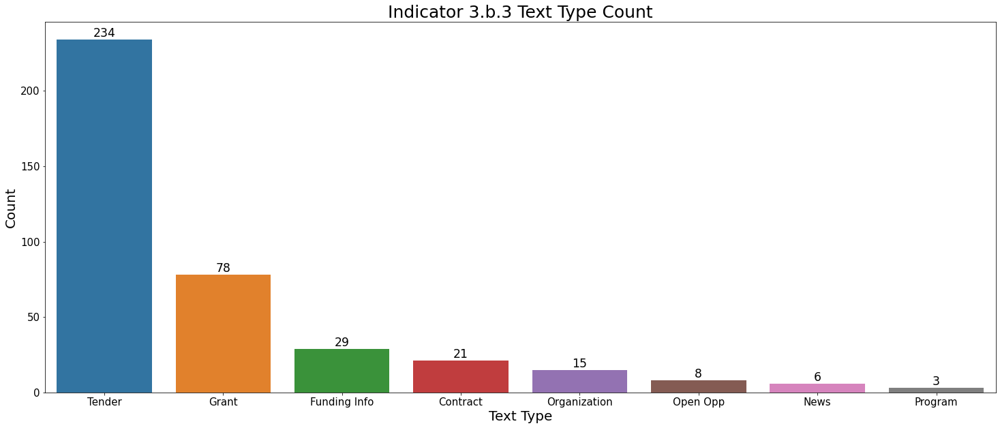

In [576]:
indi = pd.DataFrame(indi25.Type.value_counts())
indi.reset_index(inplace=True)

plt.figure(figsize=(25,10))
plt.title('Indicator 3.b.3 Text Type Count',fontsize=25)

ax = sns.barplot(data=indi,x='index',y='Type')

plt.xlabel('Text Type',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.tick_params(labelsize=15)

#adding the text labels
rects = ax.patches
labels = indi25.Type.value_counts().values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height, label, ha='center', va='bottom',fontsize='xx-large')

#### 3.c.1

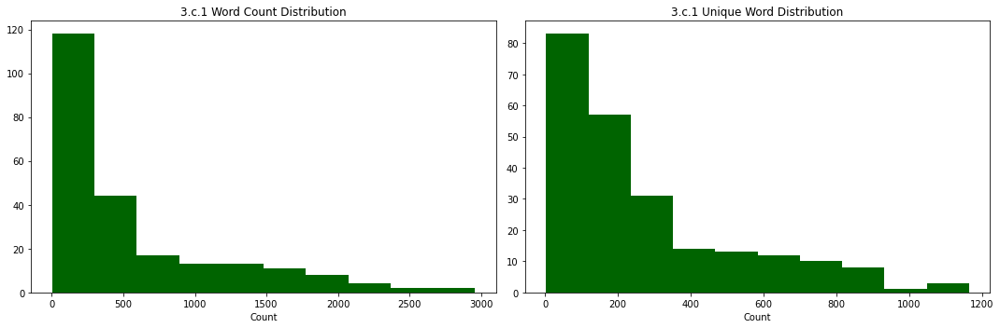

In [577]:
col = ['word_count','unique_word']
titles = ['3.c.1 Word Count Distribution','3.c.1 Unique Word Distribution']
xaxis = 'Count'

plot_hist(indi26,col,titles,xaxis,'darkgreen')

<AxesSubplot:xlabel='Type', ylabel='word_count'>

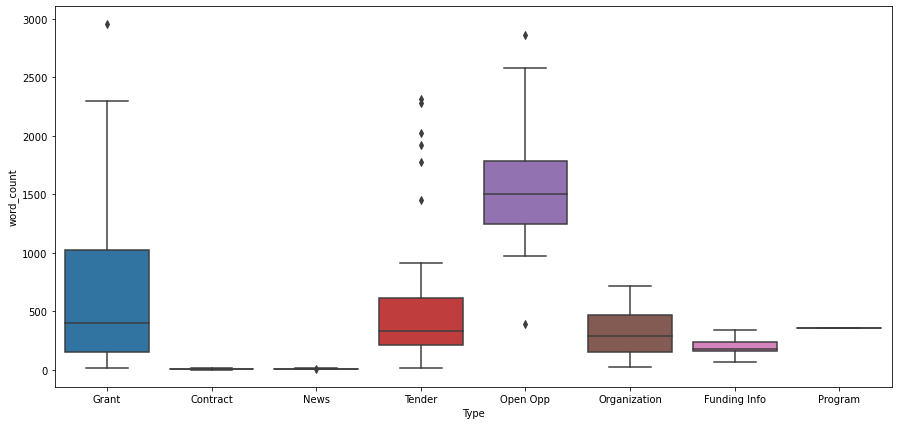

In [578]:
fig,ax = plt.subplots(figsize=(15,7))
sns.boxplot(x='Type',y='word_count',data=indi26)

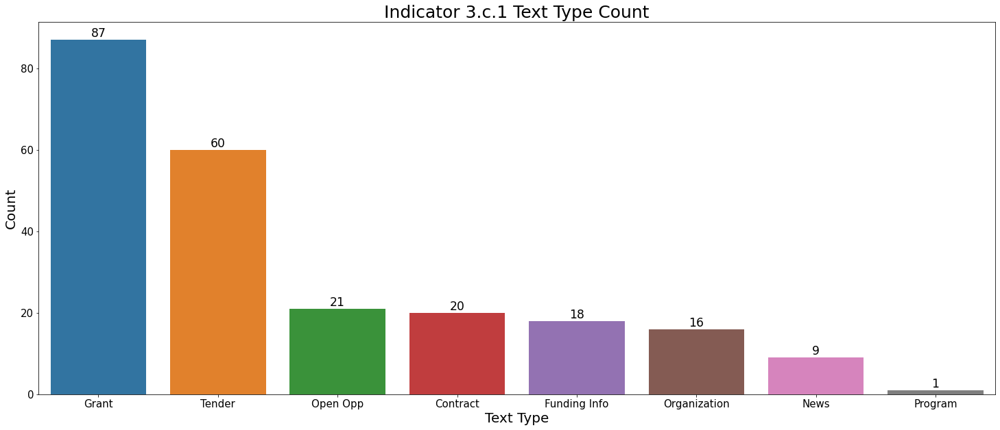

In [579]:
indi = pd.DataFrame(indi26.Type.value_counts())
indi.reset_index(inplace=True)

plt.figure(figsize=(25,10))
plt.title('Indicator 3.c.1 Text Type Count',fontsize=25)

ax = sns.barplot(data=indi,x='index',y='Type')

plt.xlabel('Text Type',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.tick_params(labelsize=15)

#adding the text labels
rects = ax.patches
labels = indi26.Type.value_counts().values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height, label, ha='center', va='bottom',fontsize='xx-large')

#### 3.d.1

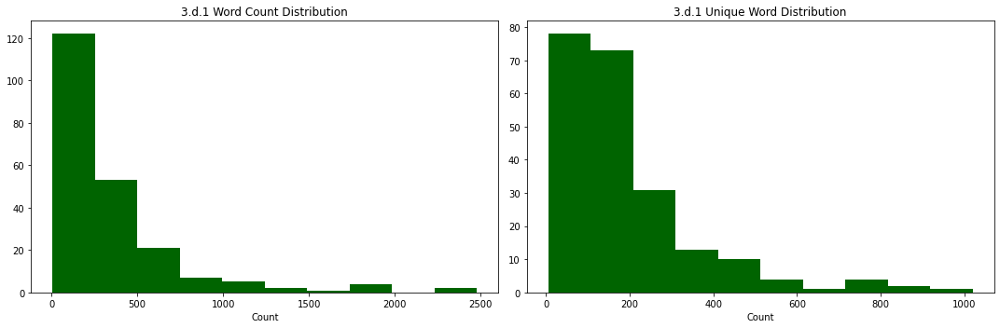

In [580]:
col = ['word_count','unique_word']
titles = ['3.d.1 Word Count Distribution','3.d.1 Unique Word Distribution']
xaxis = 'Count'

plot_hist(indi27,col,titles,xaxis,'darkgreen')

<AxesSubplot:xlabel='Type', ylabel='word_count'>

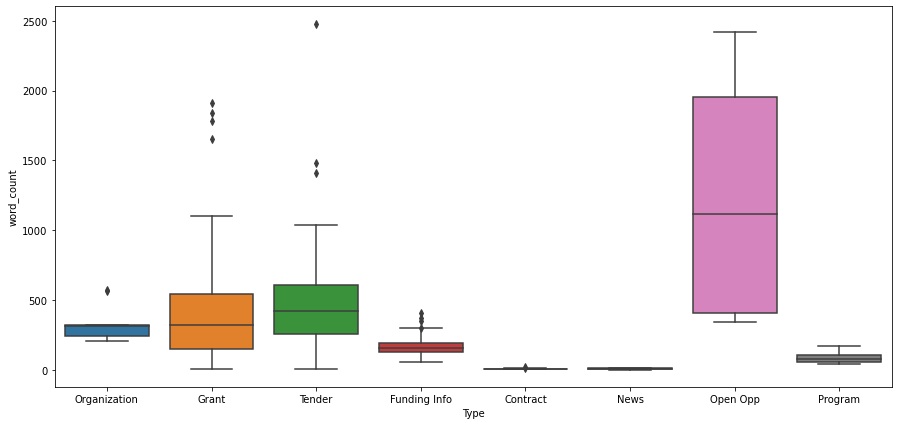

In [581]:
fig,ax = plt.subplots(figsize=(15,7))
sns.boxplot(x='Type',y='word_count',data=indi27)

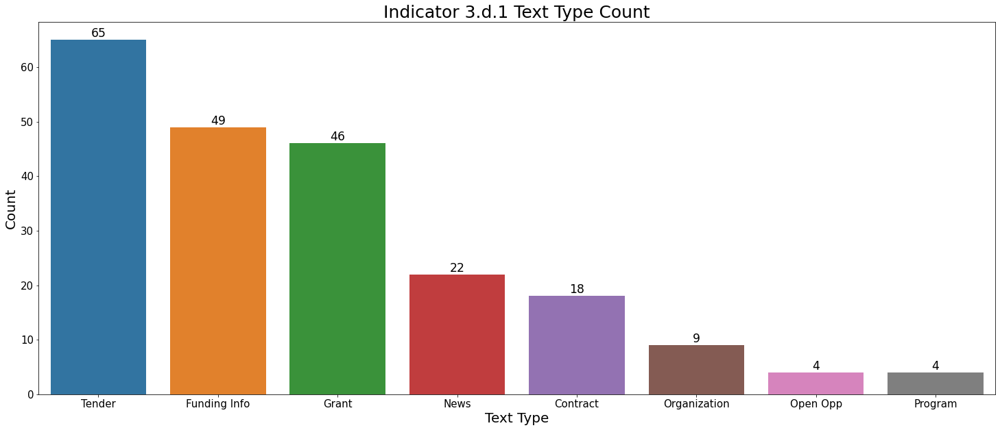

In [582]:
indi = pd.DataFrame(indi27.Type.value_counts())
indi.reset_index(inplace=True)

plt.figure(figsize=(25,10))
plt.title('Indicator 3.d.1 Text Type Count',fontsize=25)

ax = sns.barplot(data=indi,x='index',y='Type')

plt.xlabel('Text Type',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.tick_params(labelsize=15)

#adding the text labels
rects = ax.patches
labels = indi27.Type.value_counts().values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height, label, ha='center', va='bottom',fontsize='xx-large')

### Text Type

Now I will explore how different feature interact with the text type:
- How the indicator distributes by text type
- How the word count distributes by text type
- How the number of indicator distributes by text type

But first we will see how the text type is distributed in SDG 3:

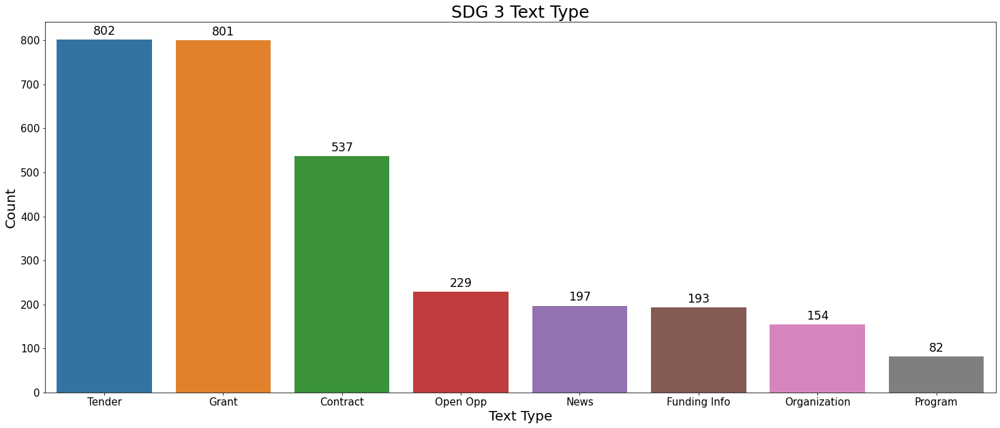

In [583]:
#number of text with multiple indicators
typecount = clean_train.Type.value_counts()
typecount_df = pd.DataFrame(typecount)
typecount_df.reset_index(inplace=True)

plt.figure(figsize=(25,10))
plt.title('SDG 3 Text Type',fontsize=25)

ax = sns.barplot(data=typecount_df,x='index',y='Type')

plt.xlabel('Text Type',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.tick_params(labelsize=15)

#adding the text labels
rects = ax.patches
labels = typecount_df.Type.values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va='bottom', fontsize='xx-large')

<AxesSubplot:xlabel='Type', ylabel='word_count'>

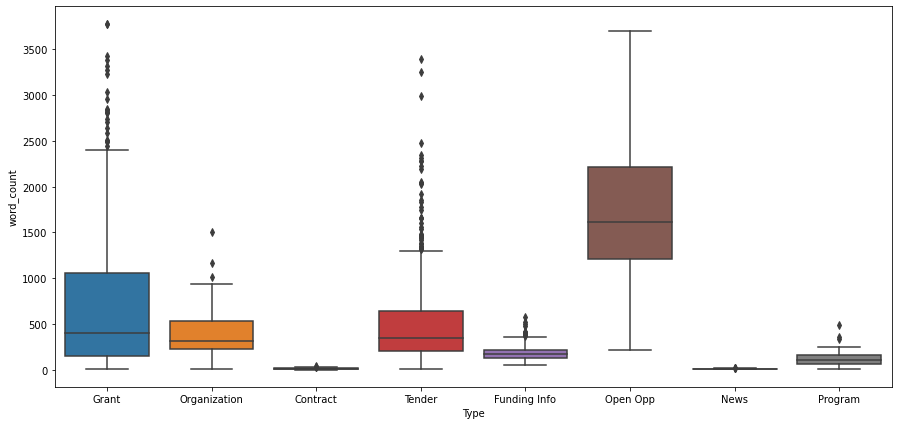

In [584]:
fig,ax = plt.subplots(figsize=(15,7))
sns.boxplot(x='Type',y='word_count',data=feature_train)

#### Tender

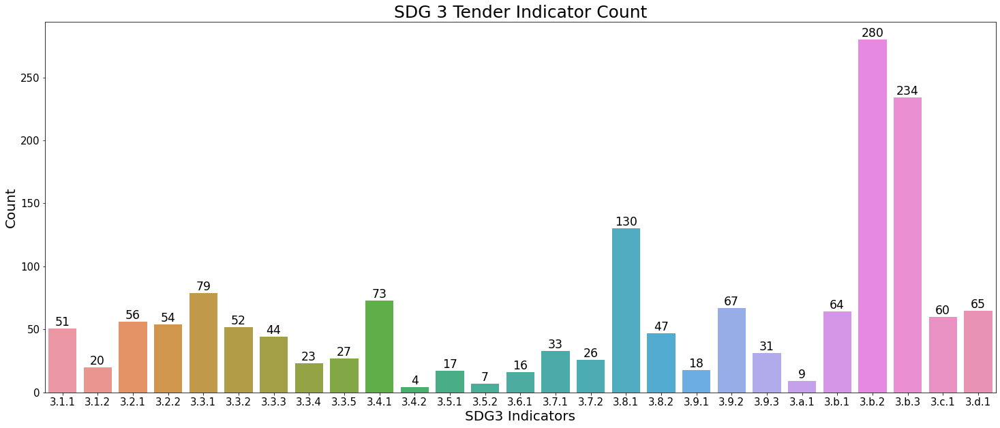

In [585]:
indi = pd.DataFrame(tender_text.iloc[:,6:33].sum())
indi.reset_index(inplace=True)

plt.figure(figsize=(25,10))
plt.title('SDG 3 Tender Indicator Count',fontsize=25)

ax = sns.barplot(data=indi,x='index',y=0)

plt.xlabel('SDG3 Indicators',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.tick_params(labelsize=15)

#adding the text labels
rects = ax.patches
labels = tender_text.iloc[:,6:33].sum().values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height, label, ha='center', va='bottom',fontsize='xx-large')

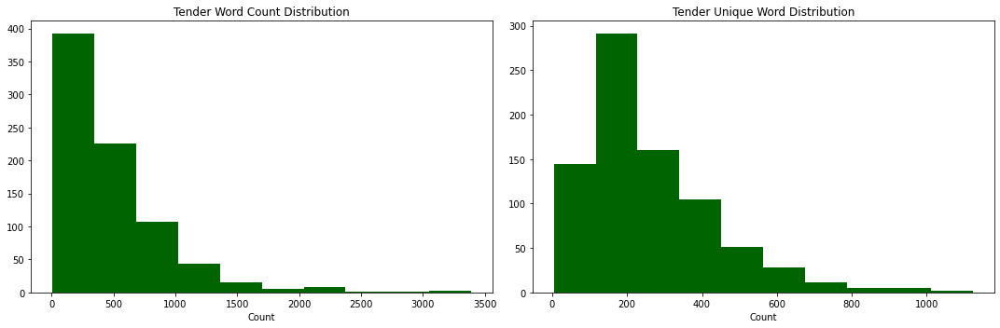

In [586]:
col = ['word_count','unique_word']
titles = ['Tender Word Count Distribution','Tender Unique Word Distribution']
xaxis = 'Count'

plot_hist(tender_text,col,titles,xaxis,'darkgreen')

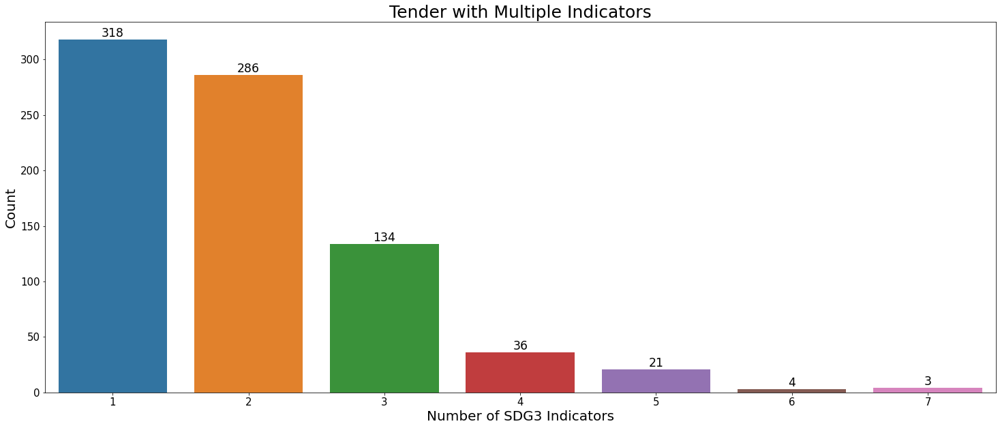

In [587]:
rowtotal = tender_text.iloc[:,6:33].sum(axis=1)
rowtotal_df = pd.DataFrame(rowtotal.value_counts())
rowtotal_df.reset_index(inplace=True)

plt.figure(figsize=(25,10))
plt.title('Tender with Multiple Indicators',fontsize=25)

ax = sns.barplot(data=rowtotal_df,x='index',y=0)

plt.xlabel('Number of SDG3 Indicators',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.tick_params(labelsize=15)

#adding the text labels
rects = ax.patches
labels = rowtotal.value_counts().values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height, label, ha='center', va='bottom', fontsize='xx-large')

#### Grants

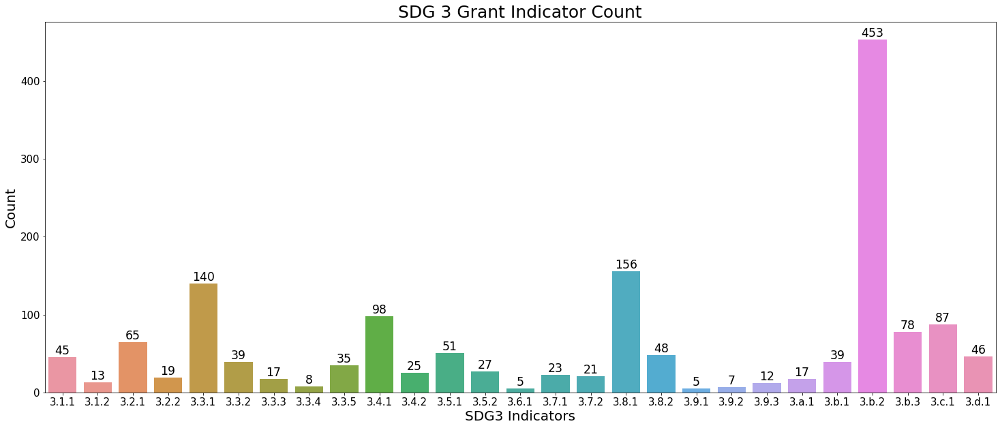

In [588]:
indi = pd.DataFrame(grant_text.iloc[:,6:33].sum())
indi.reset_index(inplace=True)

plt.figure(figsize=(25,10))
plt.title('SDG 3 Grant Indicator Count',fontsize=25)

ax = sns.barplot(data=indi,x='index',y=0)

plt.xlabel('SDG3 Indicators',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.tick_params(labelsize=15)

#adding the text labels
rects = ax.patches
labels = grant_text.iloc[:,6:33].sum().values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height, label, ha='center', va='bottom',fontsize='xx-large')

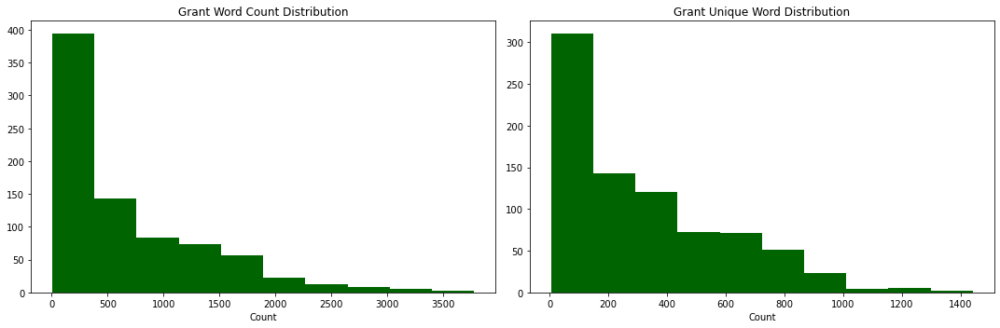

In [589]:
col = ['word_count','unique_word']
titles = ['Grant Word Count Distribution','Grant Unique Word Distribution']
xaxis = 'Count'

plot_hist(grant_text,col,titles,xaxis,'darkgreen')

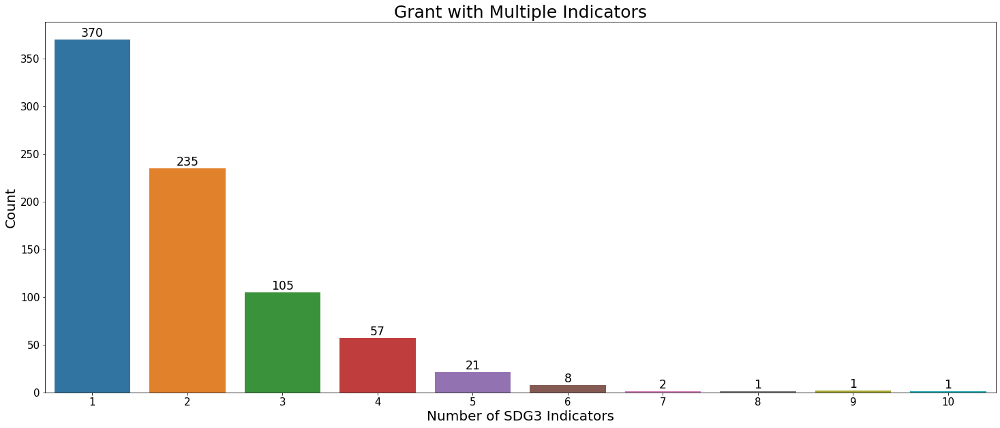

In [590]:
rowtotal = grant_text.iloc[:,6:33].sum(axis=1)
rowtotal_df = pd.DataFrame(rowtotal.value_counts())
rowtotal_df.reset_index(inplace=True)

plt.figure(figsize=(25,10))
plt.title('Grant with Multiple Indicators',fontsize=25)

ax = sns.barplot(data=rowtotal_df,x='index',y=0)

plt.xlabel('Number of SDG3 Indicators',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.tick_params(labelsize=15)

#adding the text labels
rects = ax.patches
labels = rowtotal.value_counts().values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height, label, ha='center', va='bottom', fontsize='xx-large')

#### Contract

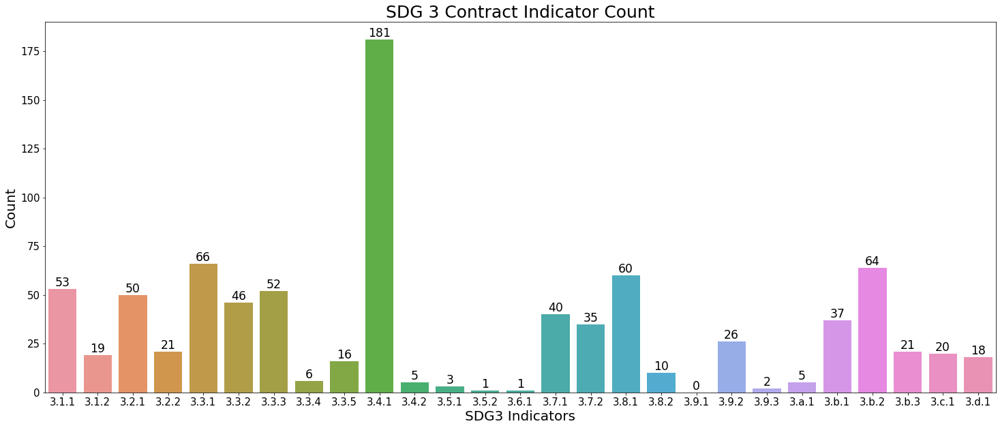

In [591]:
indi = pd.DataFrame(contract_text.iloc[:,6:33].sum())
indi.reset_index(inplace=True)

plt.figure(figsize=(25,10))
plt.title('SDG 3 Contract Indicator Count',fontsize=25)

ax = sns.barplot(data=indi,x='index',y=0)

plt.xlabel('SDG3 Indicators',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.tick_params(labelsize=15)

#adding the text labels
rects = ax.patches
labels = contract_text.iloc[:,6:33].sum().values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height, label, ha='center', va='bottom',fontsize='xx-large')

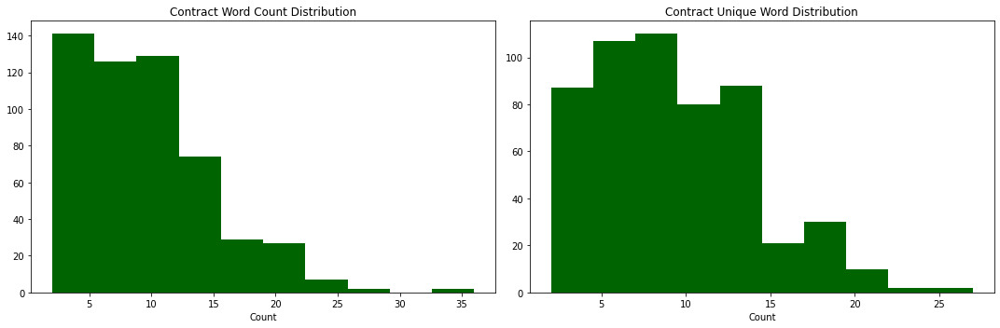

In [592]:
col = ['word_count','unique_word']
titles = ['Contract Word Count Distribution','Contract Unique Word Distribution']
xaxis = 'Count'

plot_hist(contract_text,col,titles,xaxis,'darkgreen')

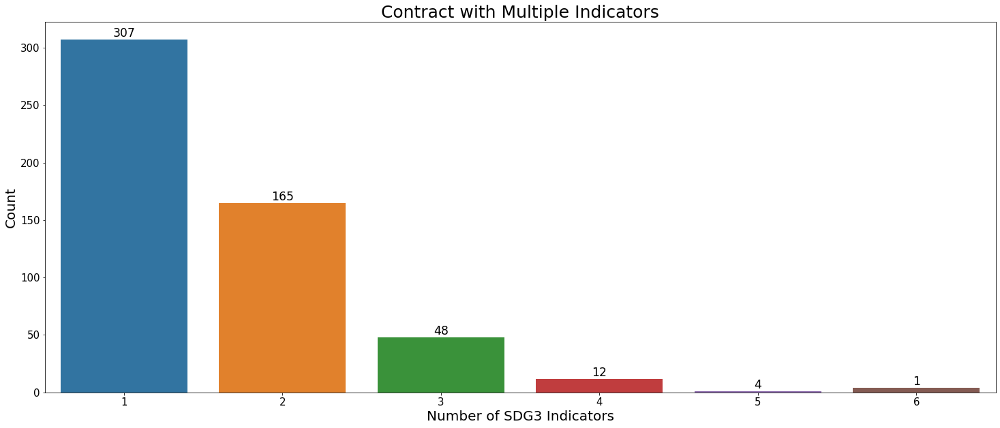

In [593]:
rowtotal = contract_text.iloc[:,6:33].sum(axis=1)
rowtotal_df = pd.DataFrame(rowtotal.value_counts())
rowtotal_df.reset_index(inplace=True)

plt.figure(figsize=(25,10))
plt.title('Contract with Multiple Indicators',fontsize=25)

ax = sns.barplot(data=rowtotal_df,x='index',y=0)

plt.xlabel('Number of SDG3 Indicators',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.tick_params(labelsize=15)

#adding the text labels
rects = ax.patches
labels = rowtotal.value_counts().values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height, label, ha='center', va='bottom', fontsize='xx-large')

#### Open Opportunity

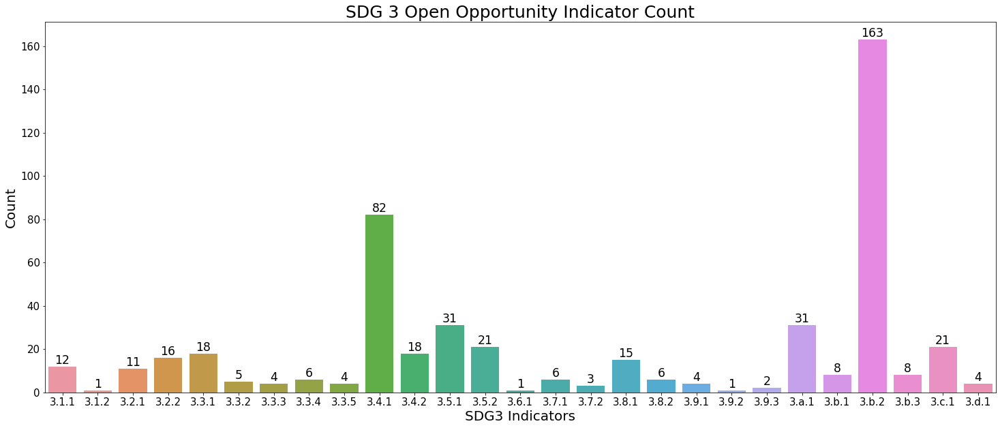

In [594]:
indi = pd.DataFrame(opp_text.iloc[:,6:33].sum())
indi.reset_index(inplace=True)

plt.figure(figsize=(25,10))
plt.title('SDG 3 Open Opportunity Indicator Count',fontsize=25)

ax = sns.barplot(data=indi,x='index',y=0)

plt.xlabel('SDG3 Indicators',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.tick_params(labelsize=15)

#adding the text labels
rects = ax.patches
labels = opp_text.iloc[:,6:33].sum().values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height, label, ha='center', va='bottom',fontsize='xx-large')

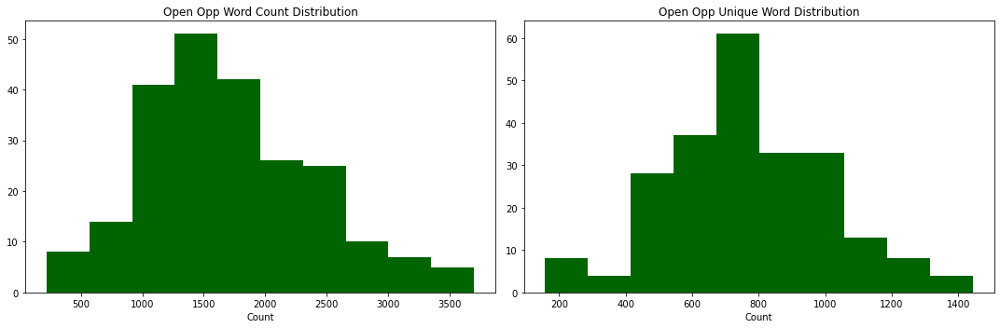

In [595]:
col = ['word_count','unique_word']
titles = ['Open Opp Word Count Distribution','Open Opp Unique Word Distribution']
xaxis = 'Count'

plot_hist(opp_text,col,titles,xaxis,'darkgreen')

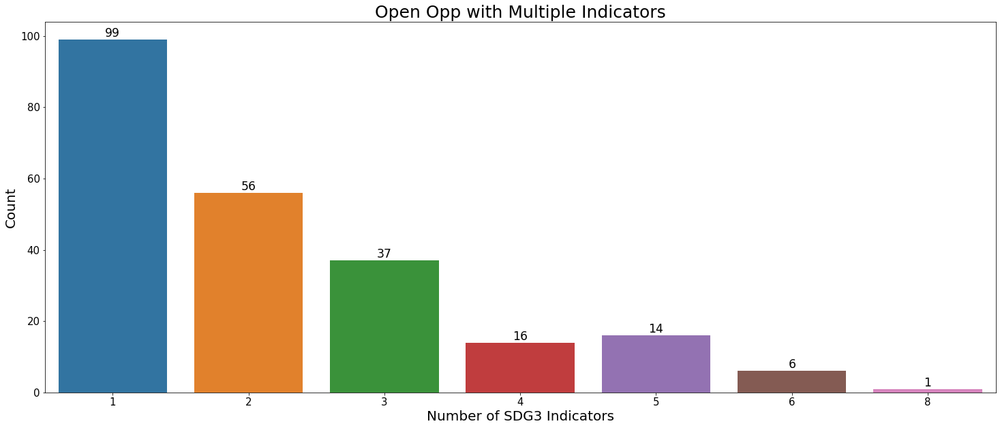

In [596]:
rowtotal = opp_text.iloc[:,6:33].sum(axis=1)
rowtotal_df = pd.DataFrame(rowtotal.value_counts())
rowtotal_df.reset_index(inplace=True)

plt.figure(figsize=(25,10))
plt.title('Open Opp with Multiple Indicators',fontsize=25)

ax = sns.barplot(data=rowtotal_df,x='index',y=0)

plt.xlabel('Number of SDG3 Indicators',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.tick_params(labelsize=15)

#adding the text labels
rects = ax.patches
labels = rowtotal.value_counts().values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height, label, ha='center', va='bottom', fontsize='xx-large')

#### News

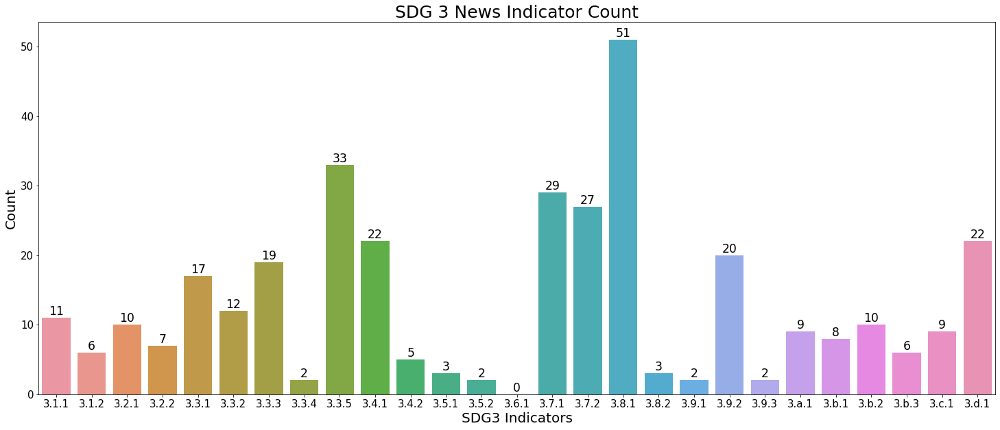

In [597]:
indi = pd.DataFrame(news_text.iloc[:,6:33].sum())
indi.reset_index(inplace=True)

plt.figure(figsize=(25,10))
plt.title('SDG 3 News Indicator Count',fontsize=25)

ax = sns.barplot(data=indi,x='index',y=0)

plt.xlabel('SDG3 Indicators',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.tick_params(labelsize=15)

#adding the text labels
rects = ax.patches
labels = news_text.iloc[:,6:33].sum().values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height, label, ha='center', va='bottom',fontsize='xx-large')

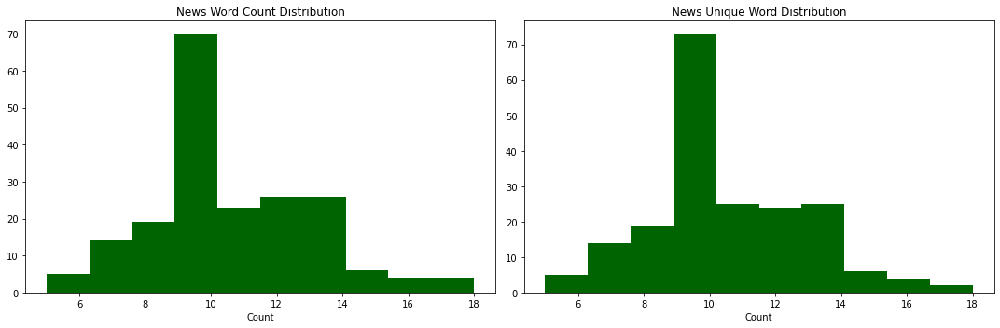

In [598]:
col = ['word_count','unique_word']
titles = ['News Word Count Distribution','News Unique Word Distribution']
xaxis = 'Count'

plot_hist(news_text,col,titles,xaxis,'darkgreen')

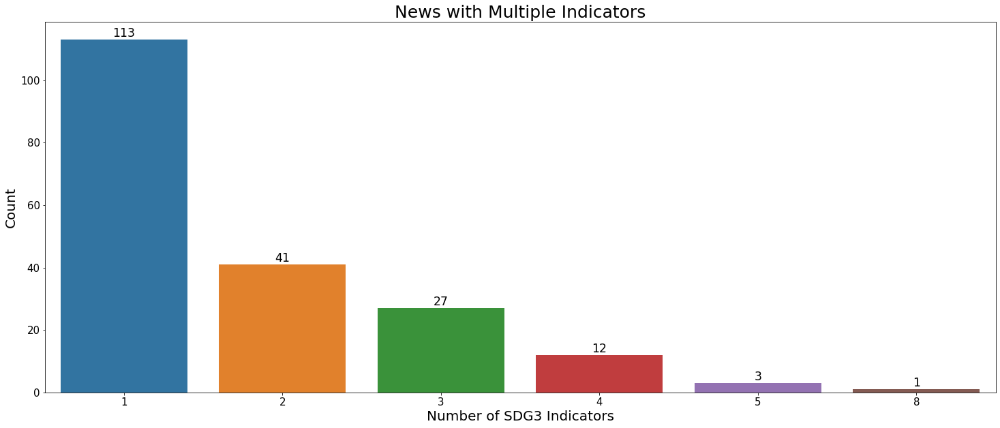

In [599]:
rowtotal = news_text.iloc[:,6:33].sum(axis=1)
rowtotal_df = pd.DataFrame(rowtotal.value_counts())
rowtotal_df.reset_index(inplace=True)

plt.figure(figsize=(25,10))
plt.title('News with Multiple Indicators',fontsize=25)

ax = sns.barplot(data=rowtotal_df,x='index',y=0)

plt.xlabel('Number of SDG3 Indicators',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.tick_params(labelsize=15)

#adding the text labels
rects = ax.patches
labels = rowtotal.value_counts().values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height, label, ha='center', va='bottom', fontsize='xx-large')

#### Funding

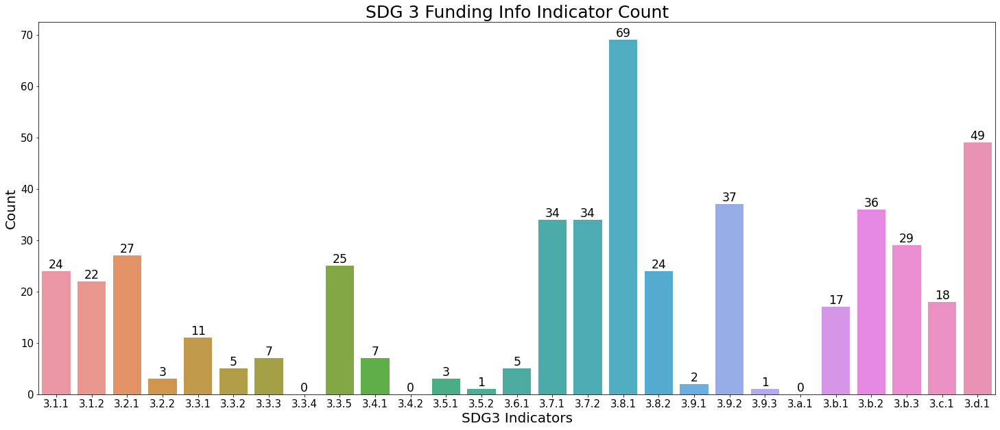

In [600]:
indi = pd.DataFrame(fund_text.iloc[:,6:33].sum())
indi.reset_index(inplace=True)

plt.figure(figsize=(25,10))
plt.title('SDG 3 Funding Info Indicator Count',fontsize=25)

ax = sns.barplot(data=indi,x='index',y=0)

plt.xlabel('SDG3 Indicators',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.tick_params(labelsize=15)

#adding the text labels
rects = ax.patches
labels = fund_text.iloc[:,6:33].sum().values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height, label, ha='center', va='bottom',fontsize='xx-large')

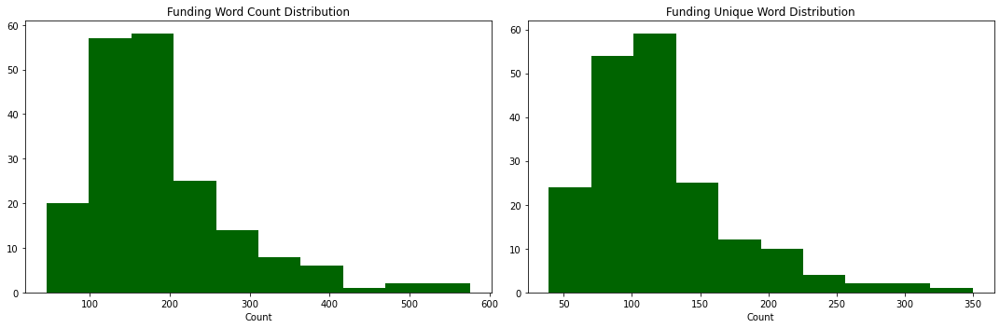

In [601]:
col = ['word_count','unique_word']
titles = ['Funding Word Count Distribution','Funding Unique Word Distribution']
xaxis = 'Count'

plot_hist(fund_text,col,titles,xaxis,'darkgreen')

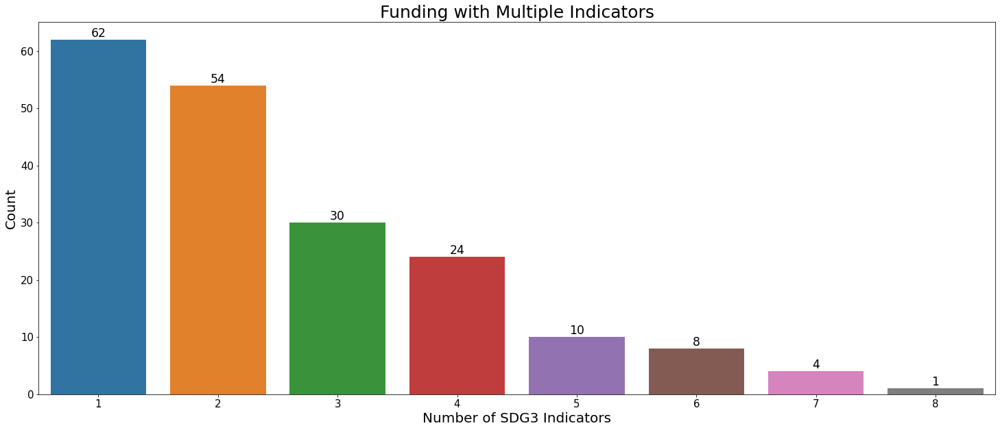

In [602]:
rowtotal = fund_text.iloc[:,6:33].sum(axis=1)
rowtotal_df = pd.DataFrame(rowtotal.value_counts())
rowtotal_df.reset_index(inplace=True)

plt.figure(figsize=(25,10))
plt.title('Funding with Multiple Indicators',fontsize=25)

ax = sns.barplot(data=rowtotal_df,x='index',y=0)

plt.xlabel('Number of SDG3 Indicators',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.tick_params(labelsize=15)

#adding the text labels
rects = ax.patches
labels = rowtotal.value_counts().values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height, label, ha='center', va='bottom', fontsize='xx-large')

#### Organization

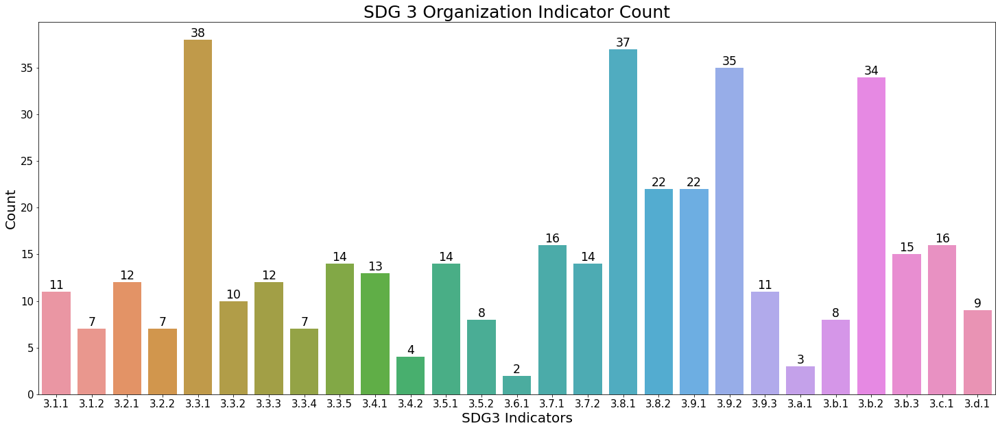

In [603]:
indi = pd.DataFrame(org_text.iloc[:,6:33].sum())
indi.reset_index(inplace=True)

plt.figure(figsize=(25,10))
plt.title('SDG 3 Organization Indicator Count',fontsize=25)

ax = sns.barplot(data=indi,x='index',y=0)

plt.xlabel('SDG3 Indicators',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.tick_params(labelsize=15)

#adding the text labels
rects = ax.patches
labels = org_text.iloc[:,6:33].sum().values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height , label, ha='center', va='bottom',fontsize='xx-large')

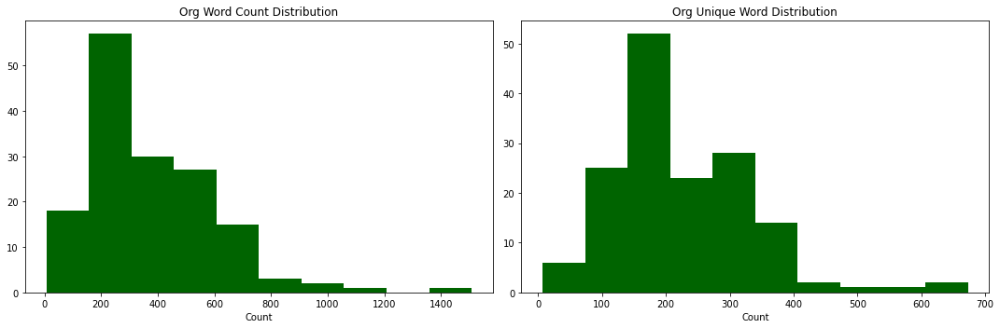

In [604]:
col = ['word_count','unique_word']
titles = ['Org Word Count Distribution','Org Unique Word Distribution']
xaxis = 'Count'

plot_hist(org_text,col,titles,xaxis,'darkgreen')

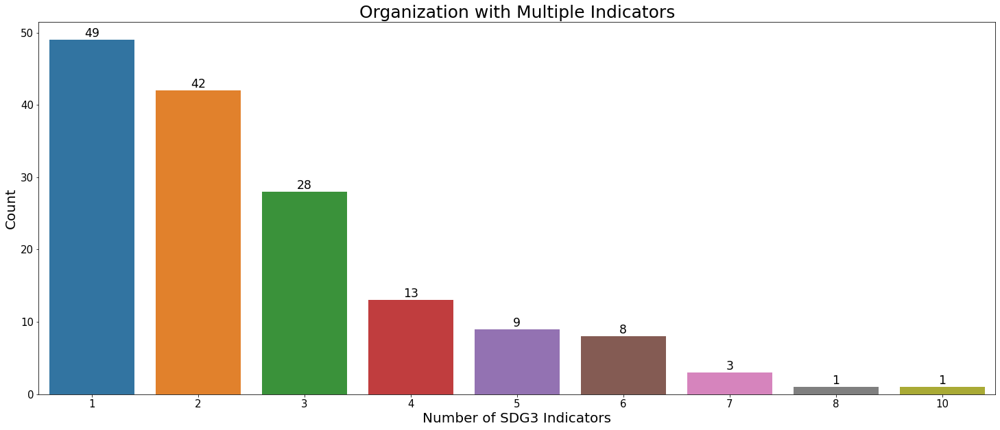

In [605]:
rowtotal = org_text.iloc[:,6:33].sum(axis=1)
rowtotal_df = pd.DataFrame(rowtotal.value_counts())
rowtotal_df.reset_index(inplace=True)

plt.figure(figsize=(25,10))
plt.title('Organization with Multiple Indicators',fontsize=25)

ax = sns.barplot(data=rowtotal_df,x='index',y=0)

plt.xlabel('Number of SDG3 Indicators',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.tick_params(labelsize=15)

#adding the text labels
rects = ax.patches
labels = rowtotal.value_counts().values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height, label, ha='center', va='bottom', fontsize='xx-large')

#### Programs

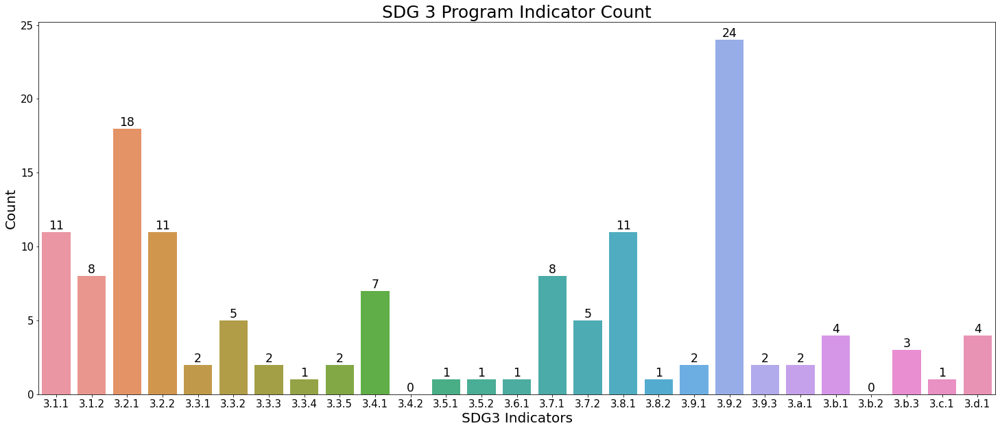

In [606]:
indi = pd.DataFrame(program_text.iloc[:,6:33].sum())
indi.reset_index(inplace=True)

plt.figure(figsize=(25,10))
plt.title('SDG 3 Program Indicator Count',fontsize=25)

ax = sns.barplot(data=indi,x='index',y=0)

plt.xlabel('SDG3 Indicators',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.tick_params(labelsize=15)

#adding the text labels
rects = ax.patches
labels = program_text.iloc[:,6:33].sum().values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height, label, ha='center', va='bottom',fontsize='xx-large')

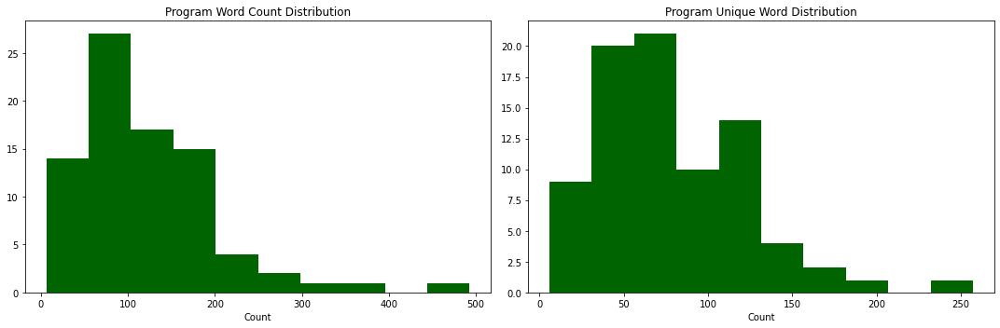

In [607]:
col = ['word_count','unique_word']
titles = ['Program Word Count Distribution','Program Unique Word Distribution']
xaxis = 'Count'

plot_hist(program_text,col,titles,xaxis,'darkgreen')

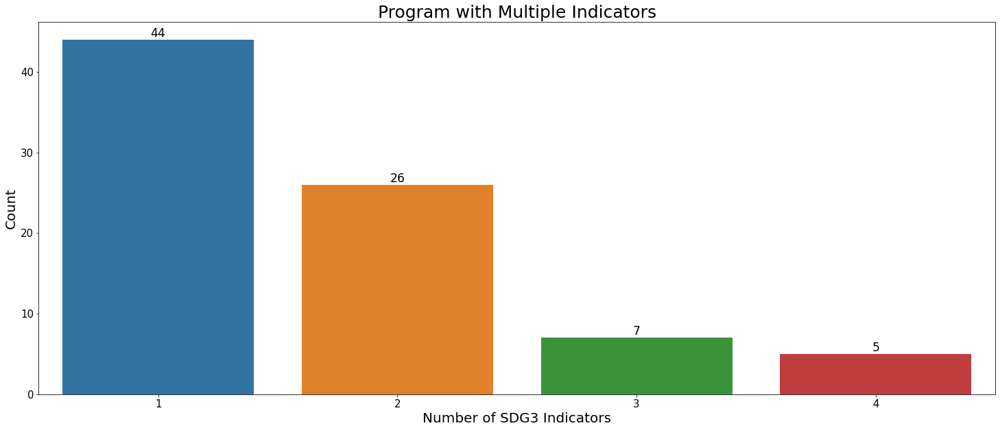

In [608]:
rowtotal = program_text.iloc[:,6:33].sum(axis=1)
rowtotal_df = pd.DataFrame(rowtotal.value_counts())
rowtotal_df.reset_index(inplace=True)

plt.figure(figsize=(25,10))
plt.title('Program with Multiple Indicators',fontsize=25)

ax = sns.barplot(data=rowtotal_df,x='index',y=0)

plt.xlabel('Number of SDG3 Indicators',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.tick_params(labelsize=15)

#adding the text labels
rects = ax.patches
labels = rowtotal.value_counts().values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height, label, ha='center', va='bottom', fontsize='xx-large')

# Test Data Visualization

In [609]:
test = pd.read_csv('../data/Devex_test_questions.csv')
clean_test = pd.read_csv('../data/clean_test.csv')

In [610]:
print('test columns:',test.columns)
print('clean test columns:',clean_test.columns)

test columns: Index(['Unique ID', 'Type', 'Text'], dtype='object')
clean test columns: Index(['Unique ID', 'Type', 'clean_text', 'word_count', 'unique_word'], dtype='object')


In [611]:
print('There are', clean_test.shape[0],'test text data')

There are 998 test text data


### Word Cloud

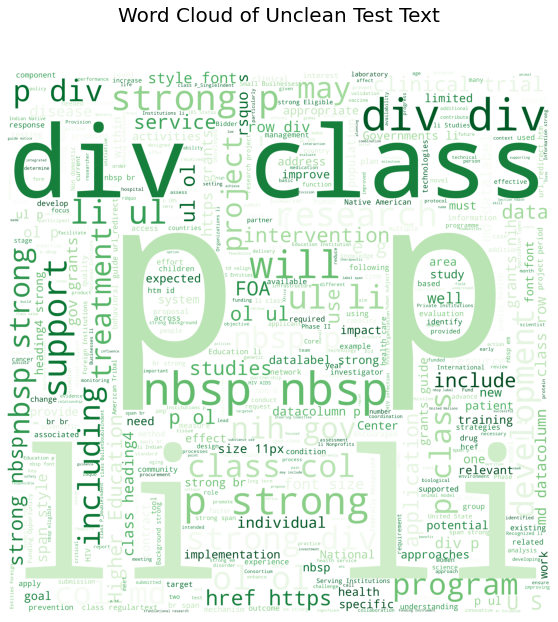

In [612]:
#word cloud of unclean text
draw_wordcloud(test.Text, "Word Cloud of Unclean Test Text")

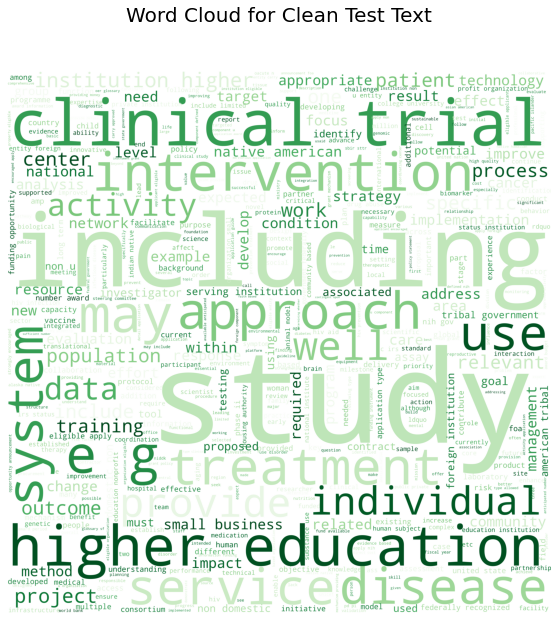

In [613]:
#word cloud of clean test text
draw_wordcloud(clean_test.clean_text, "Word Cloud for Clean Test Text")

### Word Count

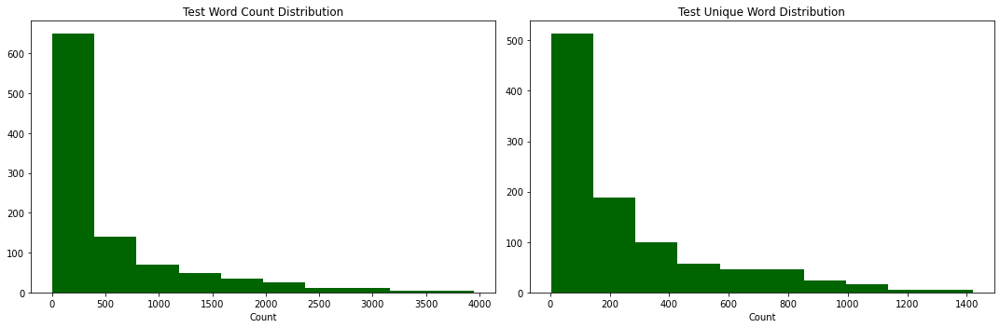

In [614]:
col = ['word_count','unique_word']
titles = ['Test Word Count Distribution','Test Unique Word Distribution']
xaxis = 'Count'

plot_hist(clean_test,col,titles,xaxis,'darkgreen')

In [615]:
#cvec test count
cvec_test = cvec.fit_transform(clean_test.clean_text)
cvec_test_df = pd.DataFrame(cvec_test.todense(),columns=cvec.get_feature_names())
cvec_test_count = cvec_test_df.sum(axis=0)
cvec_test_count.sort_values(ascending=False).head(10)

study          1818
clinical       1703
application    1646
institution    1351
data           1249
disease        1132
award          1109
use            1041
care           1038
hiv            1034
dtype: int64

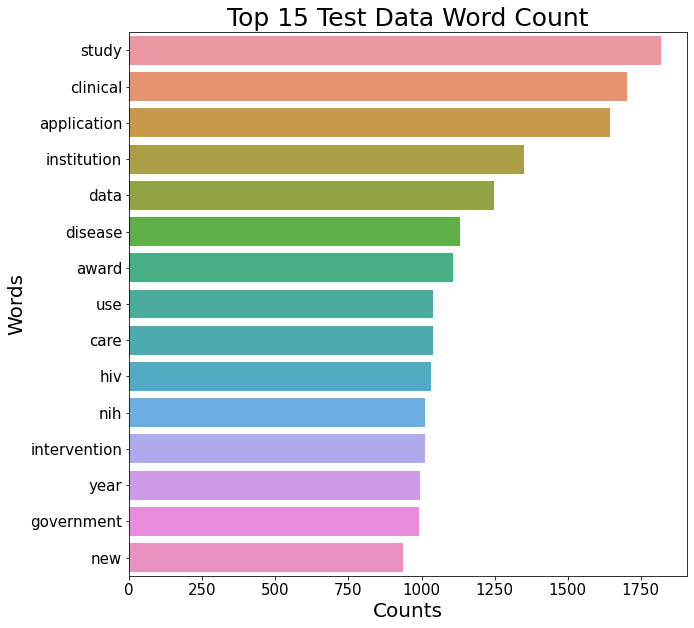

In [616]:
#making new dataframe for wordcount
cvec_test_data = pd.DataFrame(cvec_test_count)
cvec_test_data.reset_index(inplace=True)
cvec_test_data.columns = 'Words','Counts'

#graphing the word count in bar chart
plt.figure(figsize=(10,10))
plt.title('Top 15 Test Data Word Count',fontsize=25)

sns.barplot(data=cvec_test_data.sort_values(by='Counts',ascending=False).head(15),x='Counts',y='Words',orient='h')

plt.xlabel('Counts', fontsize=20)
plt.ylabel('Words', fontsize=20)
plt.tick_params(labelsize=15)

### Word Weight

In [617]:
#tvec count
tvec_text = tvec.fit_transform(clean_train.clean_text)
tvec_df = pd.DataFrame(tvec_text.todense(),columns=tvec.get_feature_names())
tvec_text_count = tvec_df.sum(axis=0)
tvec_text_count.sort_values(ascending=False).head(10)

diabetes       87.190276
care           70.771612
date           68.173209
hiv            67.731755
service        62.545134
application    58.225893
clinical       53.406834
study          52.421746
child          50.233654
disease        49.019283
dtype: float64

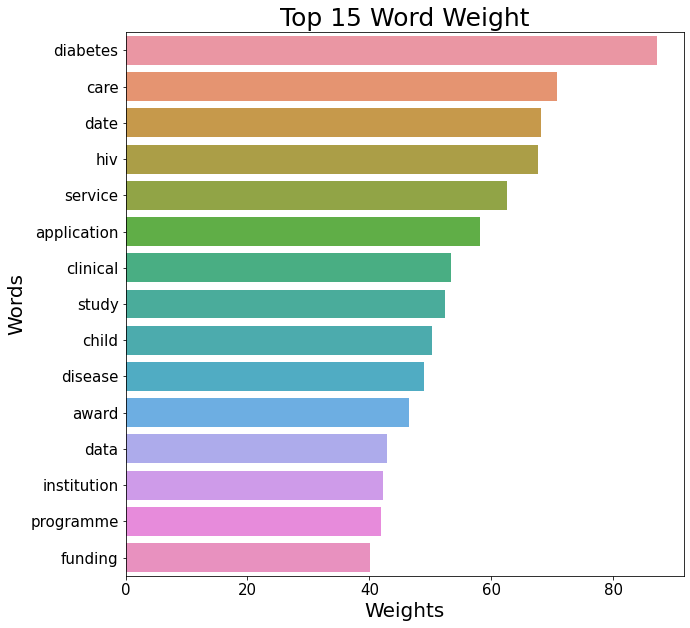

In [618]:
#make dataframe for graphing
tvec_data = pd.DataFrame(tvec_text_count)
tvec_data.reset_index(inplace=True)
tvec_data.columns = 'Words','Weights'

#graphing bar chart for word weight
plt.figure(figsize=(10,10))
plt.title('Top 15 Word Weight',fontsize=25)

sns.barplot(data=tvec_data.sort_values(by='Weights',ascending=False).head(15),x='Weights',y='Words',orient='h')

plt.xlabel('Weights', fontsize=20)
plt.ylabel('Words', fontsize=20)
plt.tick_params(labelsize=15)

### Word Frequencies

In [619]:
cvec_test_data['Freq'] = cvec_test_data['Counts'] / len(cvec_data) * 100
cvec_test_data.sort_values(by='Counts',ascending=False, inplace=True)
cvec_test_data

,Words,Counts,Freq
13058,study,1818,36.462094
2314,clinical,1703,34.155636
824,application,1646,33.012435
6902,institution,1351,27.095868
3264,data,1249,25.050140
...,...,...,...
7280,jnci,1,0.020056
7277,jinzj,1,0.020056
7276,jin,1,0.020056
7275,jihae,1,0.020056


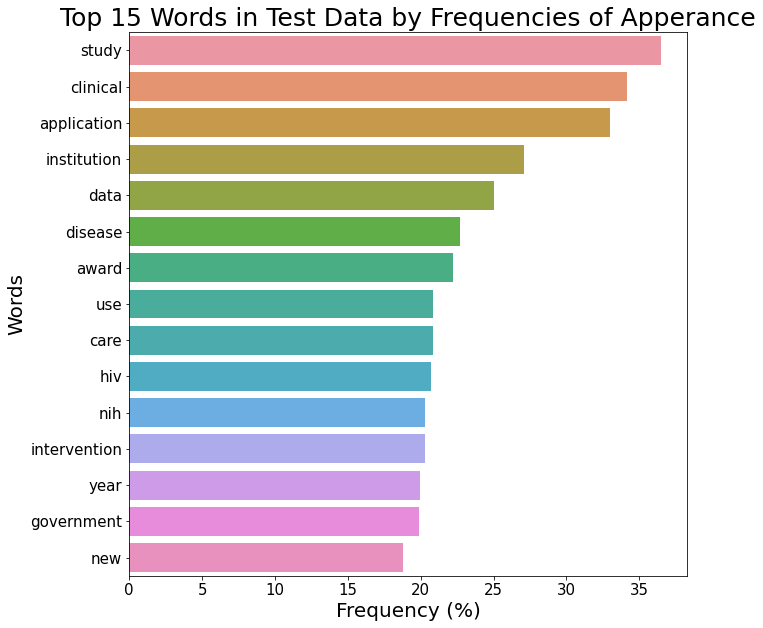

In [620]:
plt.figure(figsize=(10,10))
plt.title('Top 15 Words in Test Data by Frequencies of Apperance',fontsize=25)

sns.barplot(data=cvec_test_data.head(15),x='Freq',y='Words',orient='h')

plt.xlabel('Frequency (%)',fontsize=20)
plt.ylabel('Words',fontsize=20)
plt.tick_params(labelsize=15)

### Text Type

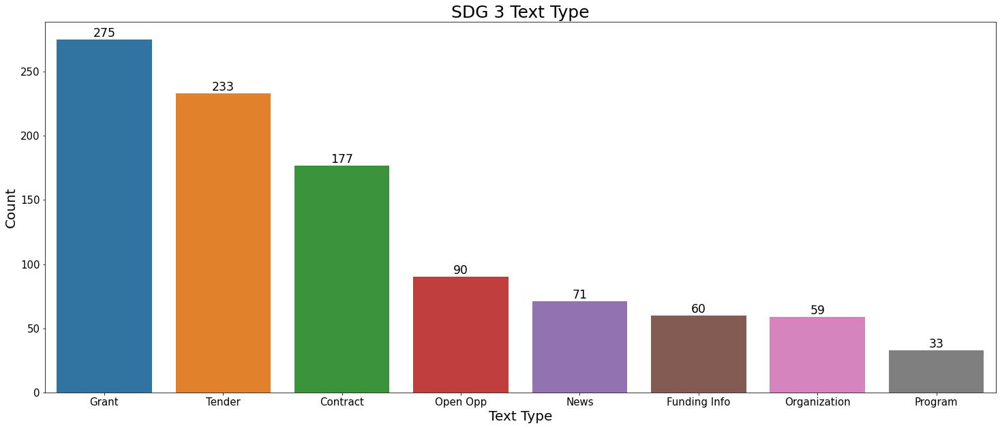

In [621]:
#number of text with multiple indicators
typecount = clean_test.Type.value_counts()
typecount_df = pd.DataFrame(typecount)
typecount_df.reset_index(inplace=True)

plt.figure(figsize=(25,10))
plt.title('SDG 3 Text Type',fontsize=25)

ax = sns.barplot(data=typecount_df,x='index',y='Type')

plt.xlabel('Text Type',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.tick_params(labelsize=15)

#adding the text labels
rects = ax.patches
labels = typecount_df.Type.values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height, label, ha='center', va='bottom', fontsize='xx-large')

<AxesSubplot:xlabel='Type', ylabel='word_count'>

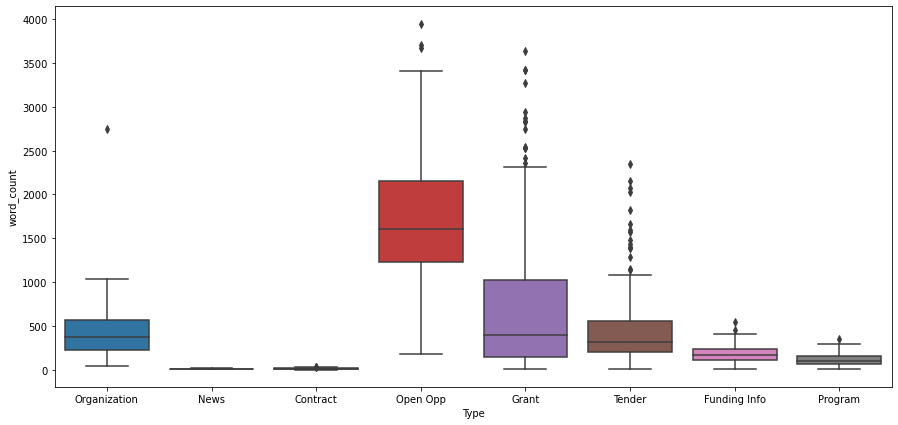

In [622]:
fig,ax = plt.subplots(figsize=(15,7))
sns.boxplot(x='Type',y='word_count',data=clean_test)